<a href="https://colab.research.google.com/github/ayomight96/IELF_FRAMEWORK/blob/main/CHD_Refined.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip freeze

absl-py==1.4.0
accelerate==1.2.1
aiohappyeyeballs==2.4.4
aiohttp==3.11.10
aiosignal==1.3.2
alabaster==1.0.0
albucore==0.0.19
albumentations==1.4.20
altair==5.5.0
annotated-types==0.7.0
anyio==3.7.1
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.5.1
arviz==0.20.0
astropy==6.1.7
astropy-iers-data==0.2024.12.16.0.35.48
astunparse==1.6.3
async-timeout==4.0.3
atpublic==4.1.0
attrs==24.3.0
audioread==3.0.1
autograd==1.7.0
babel==2.16.0
backcall==0.2.0
beautifulsoup4==4.12.3
bigframes==1.29.0
bigquery-magics==0.4.0
bleach==6.2.0
blinker==1.9.0
blis==0.7.11
blosc2==2.7.1
bokeh==3.6.2
Bottleneck==1.4.2
bqplot==0.12.43
branca==0.8.1
CacheControl==0.14.1
cachetools==5.5.0
catalogue==2.0.10
certifi==2024.12.14
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.0
chex==0.1.88
clarabel==0.9.0
click==8.1.7
cloudpathlib==0.20.0
cloudpickle==3.1.0
cmake==3.31.2
cmdstanpy==1.2.5
colorcet==3.1.0
colorlover==0.3.0
colour==0.1.5
community==1.0.0b1
confection==0.1.5
cons==0.4.6
contourpy=

In [2]:
#import and install all necessary packages
# !pip install pycairo
!pip install interpret
!pip install scikit-learn==1.5.2
!pip install xgboost
!pip install ucimlrepo
from sklearn.feature_selection import chi2, f_classif
from sklearn.preprocessing import  MinMaxScaler, OneHotEncoder, LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.ensemble import VotingClassifier
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, StratifiedKFold
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, make_scorer, roc_auc_score
from sklearn.model_selection import KFold
from sklearn.calibration import calibration_curve
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import kagglehub
from google.colab import drive
from ucimlrepo import fetch_ucirepo
import seaborn as sns
from imblearn.over_sampling import SMOTE
from collections import Counter
from imblearn.combine import SMOTETomek
from xgboost import XGBClassifier
from interpret.glassbox import ExplainableBoostingClassifier
import shap
from interpret import show
from joblib import Parallel, delayed
import itertools
from statistics import stdev
from sklearn.feature_selection import RFE
from collections import defaultdict
import re

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.0/4.0 MB 25.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.4/44.4 kB 2.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 26.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.7/6.7 MB 37.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 39.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 12.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 32.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 778.9/778.9 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.7/101.7 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 15.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 228.0/228.0 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━

In [3]:
# !pip check

#1. Fetching of Datasets and Data Exploration
1.1 Cleaveland Heart Disease Dataset Extraction and Exploration

In [4]:
# fetch dataset
heart_disease = fetch_ucirepo(id=45)

# data (as pandas dataframes)
X = heart_disease.data.features
y = heart_disease.data.targets

# variable information
print(heart_disease.variables)
# metadata
print(heart_disease.metadata)

# Access the complete dataset table
complete_data = heart_disease.data.original

# Rename a column
complete_data = complete_data.rename(columns={'num': 'chd'})

        name     role         type demographic  \
0        age  Feature      Integer         Age   
1        sex  Feature  Categorical         Sex   
2         cp  Feature  Categorical        None   
3   trestbps  Feature      Integer        None   
4       chol  Feature      Integer        None   
5        fbs  Feature  Categorical        None   
6    restecg  Feature  Categorical        None   
7    thalach  Feature      Integer        None   
8      exang  Feature  Categorical        None   
9    oldpeak  Feature      Integer        None   
10     slope  Feature  Categorical        None   
11        ca  Feature      Integer        None   
12      thal  Feature  Categorical        None   
13       num   Target      Integer        None   

                                          description  units missing_values  
0                                                None  years             no  
1                                                None   None             no  
2              

1.1.1 Cleaveland Heart Disease Feature and Target extraction

In [5]:
print("Cleveland Dataset Info:")
print(complete_data.info())

Cleveland Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   age       303 non-null    int64  
 1   sex       303 non-null    int64  
 2   cp        303 non-null    int64  
 3   trestbps  303 non-null    int64  
 4   chol      303 non-null    int64  
 5   fbs       303 non-null    int64  
 6   restecg   303 non-null    int64  
 7   thalach   303 non-null    int64  
 8   exang     303 non-null    int64  
 9   oldpeak   303 non-null    float64
 10  slope     303 non-null    int64  
 11  ca        299 non-null    float64
 12  thal      301 non-null    float64
 13  chd       303 non-null    int64  
dtypes: float64(3), int64(11)
memory usage: 33.3 KB
None


In [6]:
print("\nColumn Names:")
print(complete_data.columns.tolist())

print("\nTotal Number of Values per Column:")
print(complete_data.count())

print("\nMissing Values (N/A) per Column:")
print(complete_data.isnull().sum())

print("\nTotal Number of Rows and Columns:")
print(f"Rows: {complete_data.shape[0]}, Columns: {complete_data.shape[1]}")

print("\nData Types of Each Column:")
print(complete_data.dtypes)

print("\nSample Unique Values per Column:")
for column in complete_data.columns:
    print(f"{column}: {complete_data[column].unique()[:5]}")

complete_data.describe()


Column Names:
['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'chd']

Total Number of Values per Column:
age         303
sex         303
cp          303
trestbps    303
chol        303
fbs         303
restecg     303
thalach     303
exang       303
oldpeak     303
slope       303
ca          299
thal        301
chd         303
dtype: int64

Missing Values (N/A) per Column:
age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          4
thal        2
chd         0
dtype: int64

Total Number of Rows and Columns:
Rows: 303, Columns: 14

Data Types of Each Column:
age           int64
sex           int64
cp            int64
trestbps      int64
chol          int64
fbs           int64
restecg       int64
thalach       int64
exang         int64
oldpeak     float64
slope         int64
ca          float64
thal        float64
chd

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,chd
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,299.000000,301.000000,303.000000
mean,54.438944,0.679868,3.158416,131.689769,246.693069,0.148515,0.990099,149.607261,0.326733,1.039604,1.600660,0.672241,4.734219,0.937294
std,9.038662,0.467299,0.960126,17.599748,51.776918,0.356198,0.994971,22.875003,0.469794,1.161075,0.616226,0.937438,1.939706,1.228536
min,29.000000,0.000000,1.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
25%,48.000000,0.000000,3.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,3.000000,0.000000
50%,56.000000,1.000000,3.000000,130.000000,241.000000,0.000000,1.000000,153.000000,0.000000,0.800000,2.000000,0.000000,3.000000,0.000000
75%,61.000000,1.000000,4.000000,140.000000,275.000000,0.000000,2.000000,166.000000,1.000000,1.600000,2.000000,1.000000,7.000000,2.000000
max,77.000000,1.000000,4.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,3.000000,3.000000,7.000000,4.000000


In [7]:
complete_data['chd'] = complete_data['chd'].astype(int).apply(lambda x: 0 if x == 0 else 1)

1.1.2 Cleaveland Heart Disease missing value

In [8]:
# Check for missing values in each column
missing_data_summary = complete_data.isnull().sum().reset_index()
missing_data_summary.columns = ['Column', 'Missing Values']
missing_data_summary['Percentage Missing'] = (
    missing_data_summary['Missing Values'] / len(complete_data) * 100
)

# Display the table of missing data
print("Summary of Missing Data:")
print(missing_data_summary)

complete_data.head()
print("\nTotal Number of Rows and Columns:")
print(f"Rows: {complete_data.shape[0]}, Columns: {complete_data.shape[1]}")  # Number of rows and columns

Summary of Missing Data:
      Column  Missing Values  Percentage Missing
0        age               0            0.000000
1        sex               0            0.000000
2         cp               0            0.000000
3   trestbps               0            0.000000
4       chol               0            0.000000
5        fbs               0            0.000000
6    restecg               0            0.000000
7    thalach               0            0.000000
8      exang               0            0.000000
9    oldpeak               0            0.000000
10     slope               0            0.000000
11        ca               4            1.320132
12      thal               2            0.660066
13       chd               0            0.000000

Total Number of Rows and Columns:
Rows: 303, Columns: 14


1.1.3 Cleaveland Heart Disease Dataset class distribution

In [9]:
class_distribution_clv = complete_data['chd'].value_counts()
print("Class Distribution:\n", class_distribution_clv)

Class Distribution:
 chd
0    164
1    139
Name: count, dtype: int64


1.1.4 Visualize Cleaveland Heart Disease Dataset class distribution

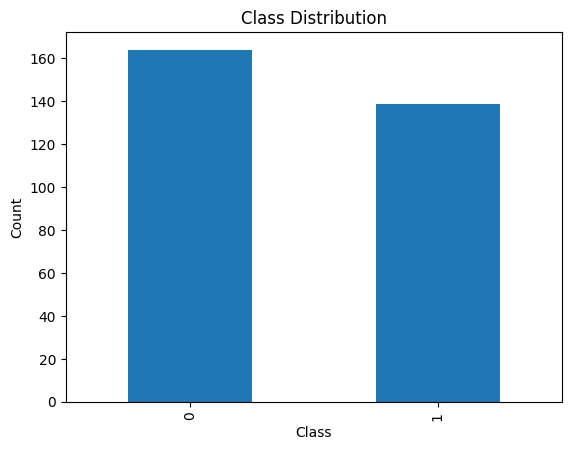

In [10]:
class_distribution_clv.plot(kind='bar')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

1.1.5 Compute correlation Matrix - Cleaveland Dataset.

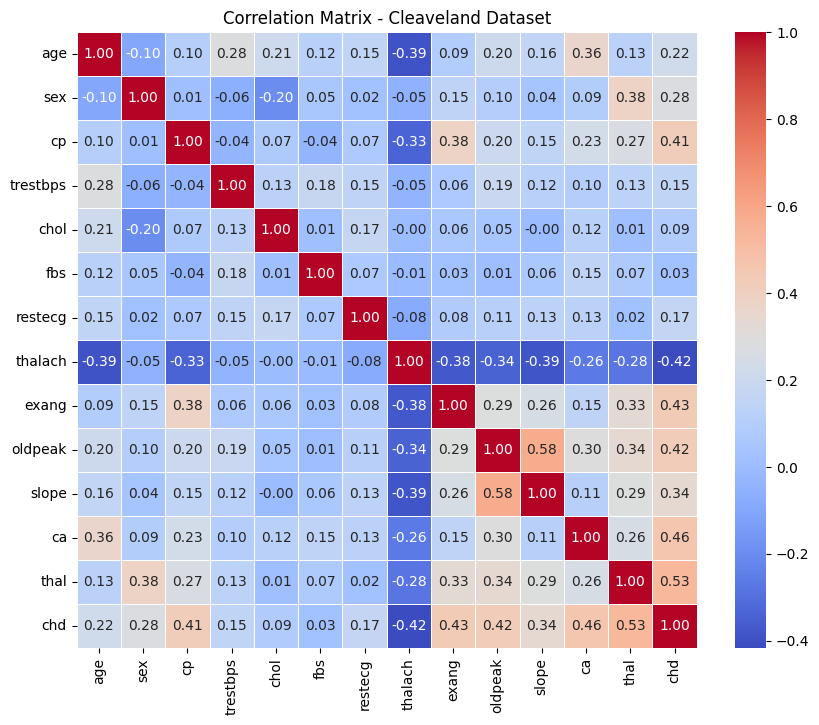

In [11]:
# Compute correlation matrix
correlation_matrix = complete_data.corr()

# Display heatmap of correlations
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix - Cleaveland Dataset")
plt.show()

1.1.6 Correlation between numerical features and the target in Cleaveland Dataset

Steps to Categorize Variables
1. Understand the Definitions of Nominal, Ordinal, and Numerical

a. Nominal Variables: Categories with no inherent order (e.g., Male, Female or Yes, No).

b. Ordinal Variables: Categories with a meaningful order or ranking, but the intervals between ranks may not be uniform (e.g., severity levels, class rankings).

c. Numerical Variables: Continuous or discrete numerical values (e.g., age, blood pressure, cholesterol).

In [12]:
# Cleveland Dataset
numerical_columns = ["chol", "age", "trestbps", "thalach", "oldpeak", "ca"]
categorical_columns_nominal = ["sex", "fbs", "exang"]
categorical_columns_ordinal = ["cp", "restecg", "slope", "thal"]
categorical_columns = ["cp", "restecg", "slope", "thal", "sex", "fbs", "exang"]

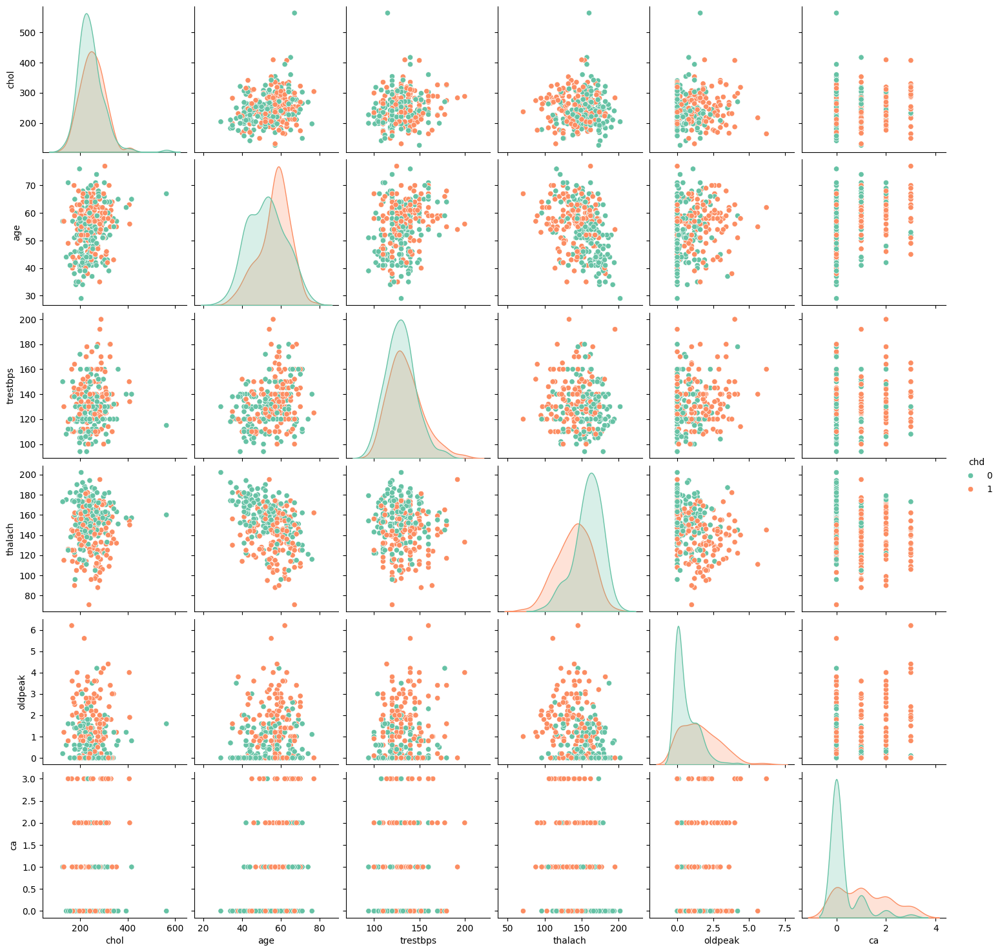

In [13]:
# Adding the target variable to numerical features for visualization
numerical_columns_plot_clv = numerical_columns + ['chd']

# Creating a pair plot
sns.pairplot(complete_data[numerical_columns_plot_clv], diag_kind='kde', hue='chd', palette="Set2")
plt.show()

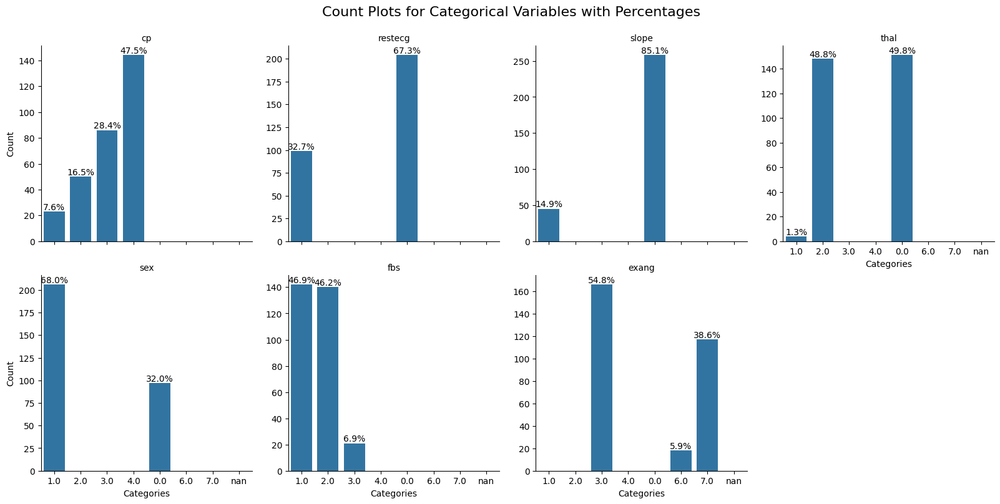

In [14]:
# Custom function to add percentages to the bars
def annotate_percentages(ax, data, feature):
    total = len(data)  # Total number of observations for the specific feature
    for p in ax.patches:
        # Calculate percentage
        percentage = f"{100 * p.get_height() / total:.1f}%" if total > 0 else "0%"
        # Add annotation
        ax.annotate(percentage,
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, color='black')


# Melt the dataset to reshape for FacetGrid
melted_data = complete_data.melt(value_vars=categorical_columns)

# Create the FacetGrid
grid = sns.FacetGrid(melted_data, col="variable", col_wrap=4, sharey=False, height=4)

# Map the countplot and annotate percentages
for ax, (feature, data) in zip(grid.axes.flat, melted_data.groupby("variable")):
    sns.countplot(data=data, x="value", ax=ax, order=sorted(data["value"].unique()))
    annotate_percentages(ax, data, feature)

# Set titles and labels
grid.set_titles("{col_name}")
grid.set_axis_labels("Categories", "Count")
plt.subplots_adjust(top=0.9)
grid.fig.suptitle("Count Plots for Categorical Variables with Percentages", fontsize=16)

# Show the plot
plt.show()

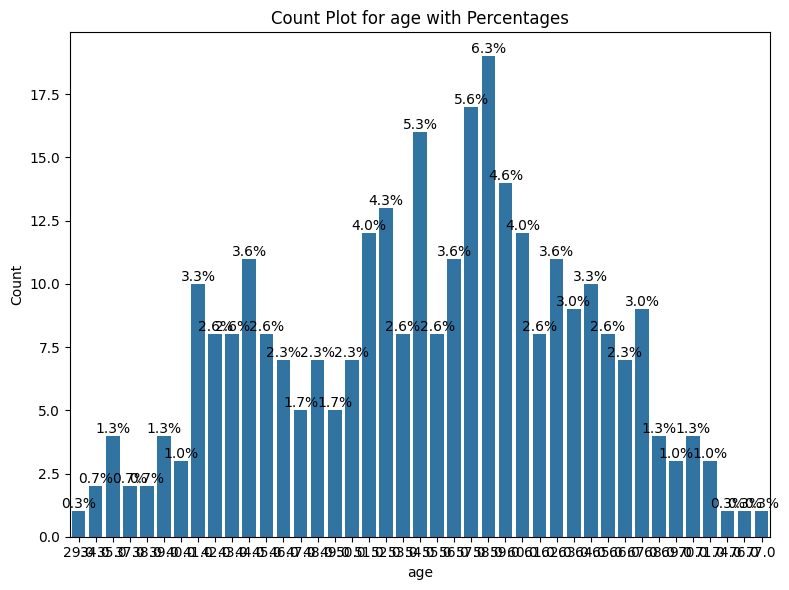

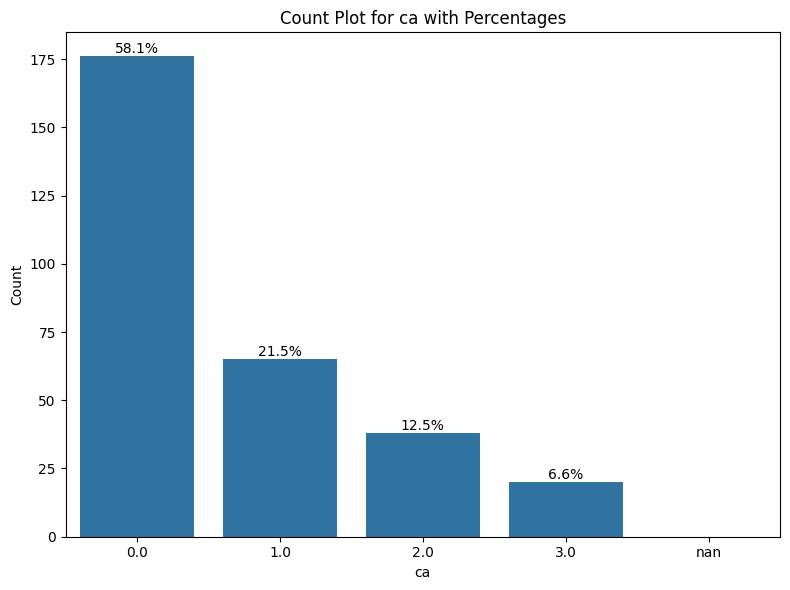

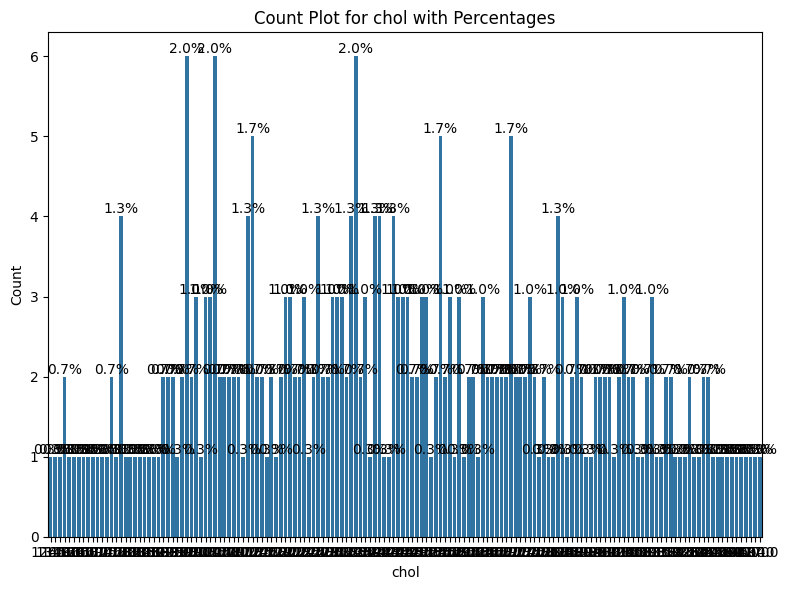

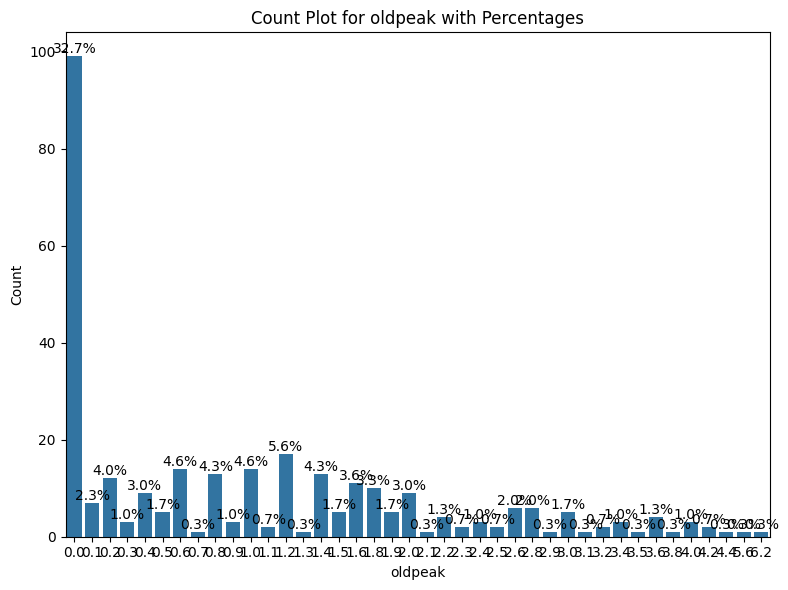

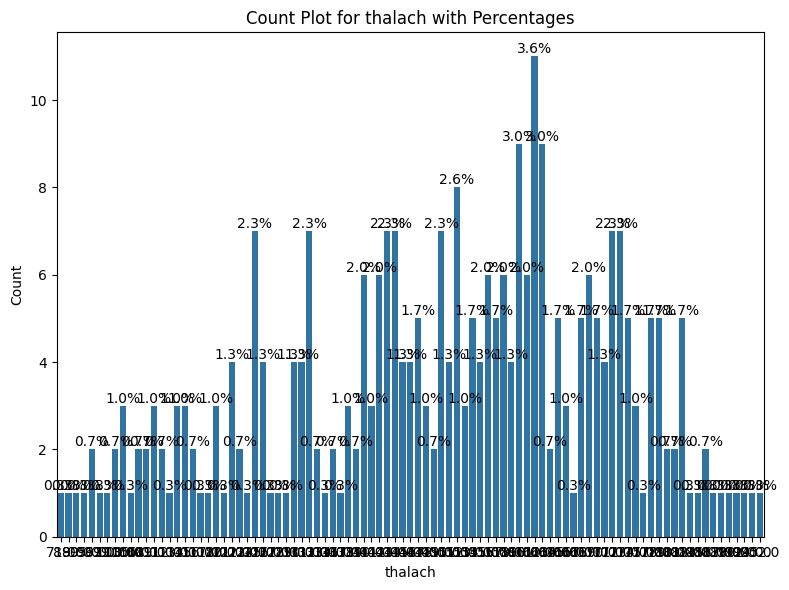

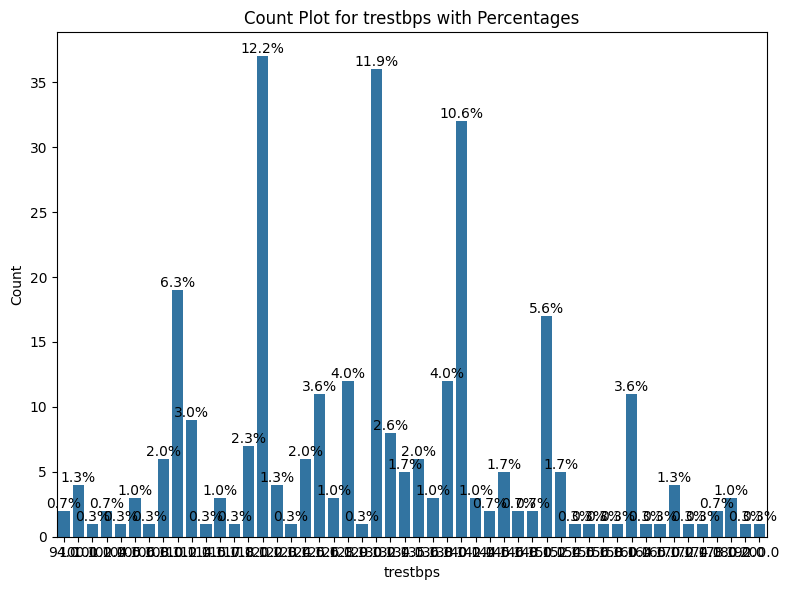

In [15]:
# Melt the dataset to reshape for plotting
melted_data = complete_data.melt(value_vars=numerical_columns)

# Loop through each numerical variable
for feature, data in melted_data.groupby("variable"):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(data=data, x="value", order=sorted(data["value"].unique()))

    # Annotate percentages on each bar
    total = len(data)
    for p in ax.patches:
        percentage = f"{100 * p.get_height() / total:.1f}%"
        ax.annotate(percentage,
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, color='black')

    # Add title and labels
    plt.title(f"Count Plot for {feature} with Percentages")
    plt.xlabel(feature)
    plt.ylabel("Count")

    # Show the plot
    plt.tight_layout()
    plt.show()

In [16]:
# Calculate correlation between numerical features and the target
correlations = complete_data[numerical_columns + ['chd']].corr()

# Extract correlations with the target variable
target_corr = correlations['chd'].sort_values(ascending=False)
print("Correlation with target (chd) - Cleaveland Dataset:\n", target_corr)

Correlation with target (chd) - Cleaveland Dataset:
 chd         1.000000
ca          0.460442
oldpeak     0.424510
age         0.223120
trestbps    0.150825
chol        0.085164
thalach    -0.417167
Name: chd, dtype: float64


1.1.7 Scatter plot for numerical features in Cleaveland Dataset

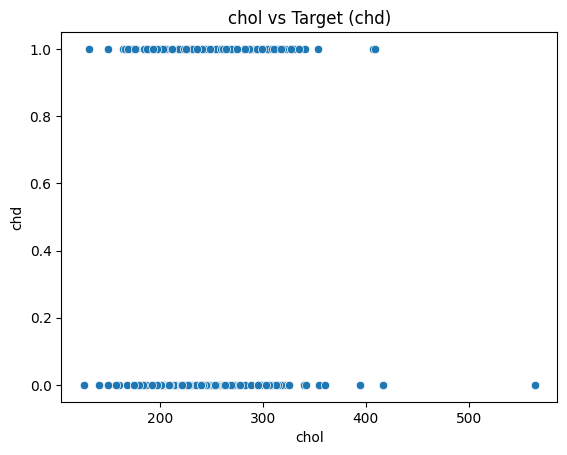

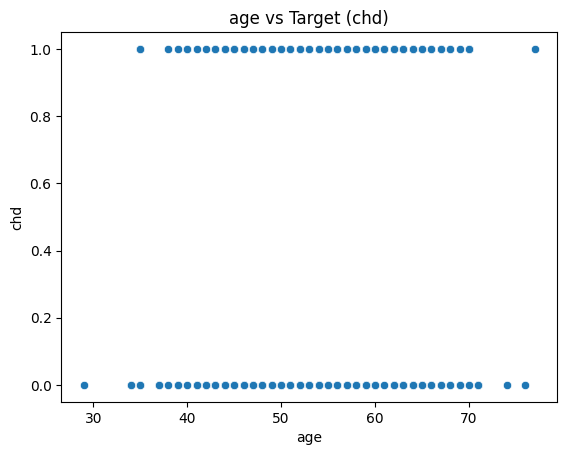

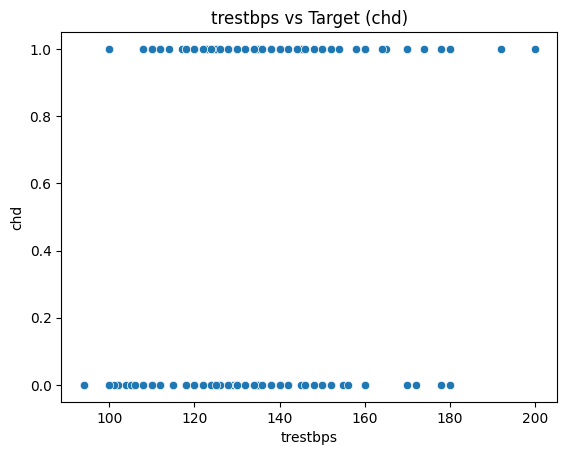

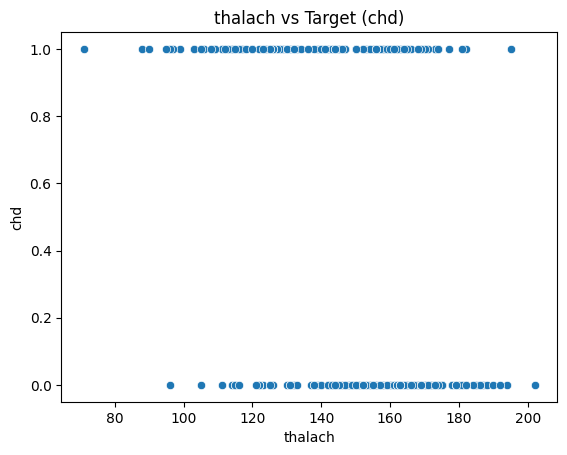

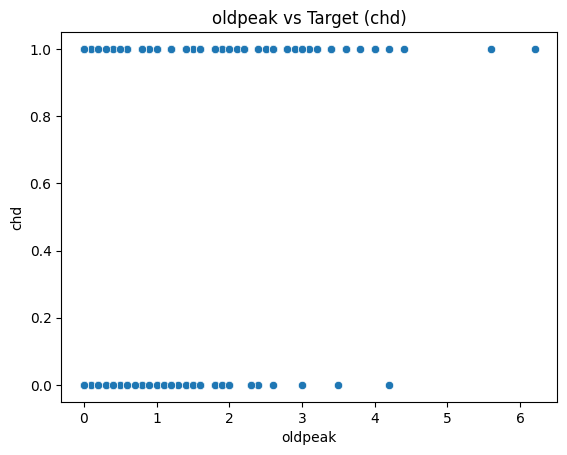

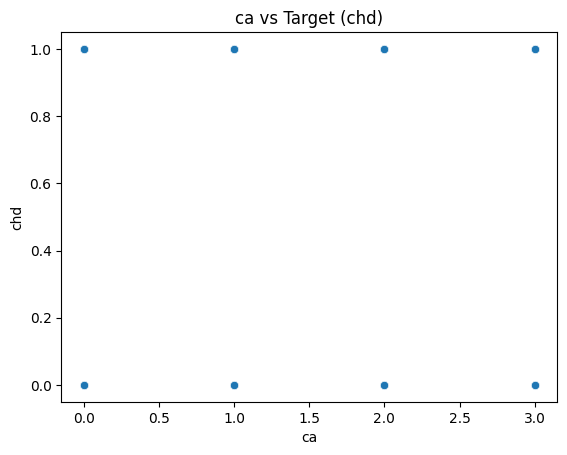

In [17]:
# Scatter plot for numerical features
for column in numerical_columns:
    sns.scatterplot(x=complete_data[column], y=complete_data['chd'])
    plt.title(f"{column} vs Target (chd)")
    plt.show()

<!-- 1.1.8 Label encoding and chi-square test for categorical columns in Cleaveland Dataset -->

In [18]:
# # Label encode categorical columns
# categorical_columns = ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'thal']
# for column in categorical_columns:
#     complete_data[column] = LabelEncoder().fit_transform(complete_data[column])

# # Perform Chi-Square test
# chi2_values, p_values = chi2(complete_data[categorical_columns], complete_data['chd'])
# chi2_results = pd.DataFrame({'Feature': categorical_columns, 'Chi2': chi2_values, 'p-value': p_values})
# print(chi2_results.sort_values(by='Chi2', ascending=False))

1.1.8 Box plot for categorical features in Cleaveland Dataset.**bold text**

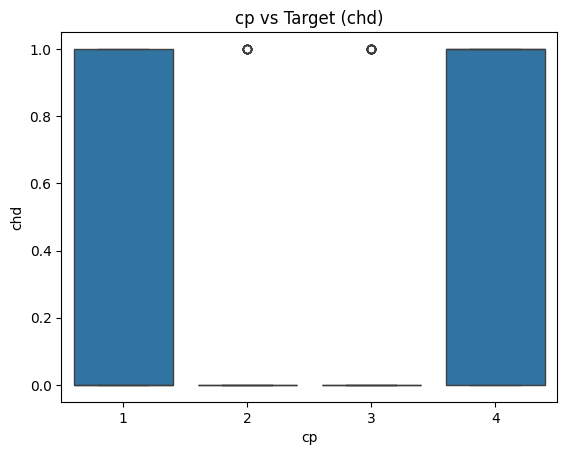

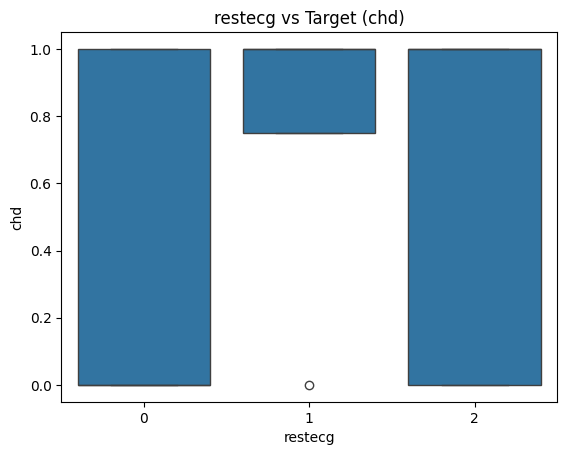

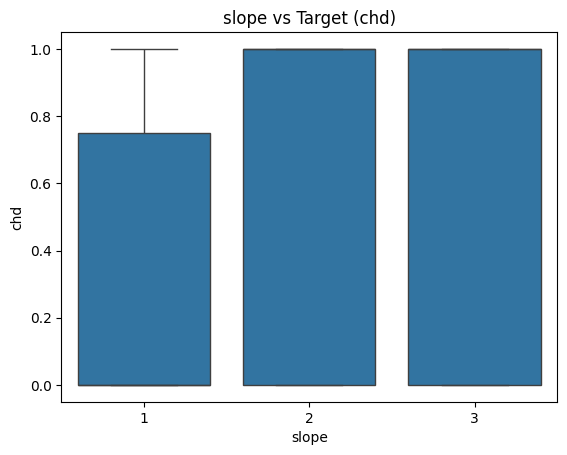

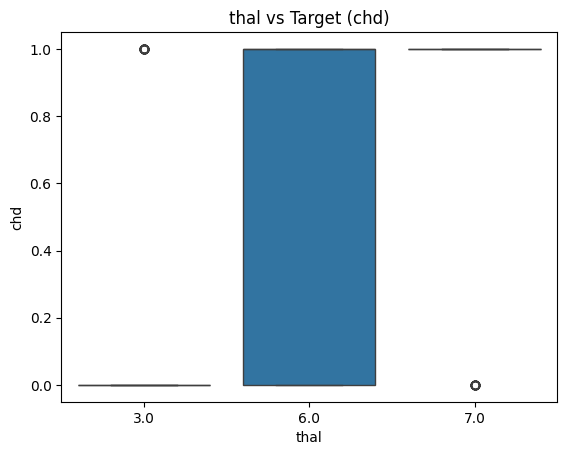

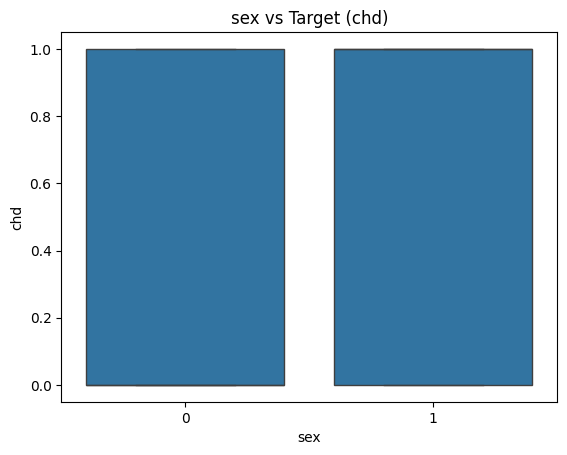

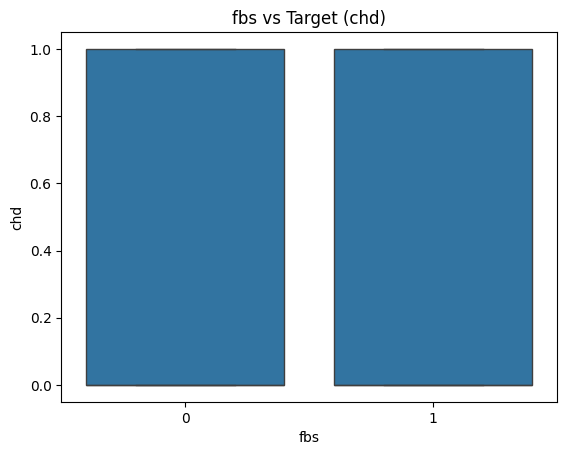

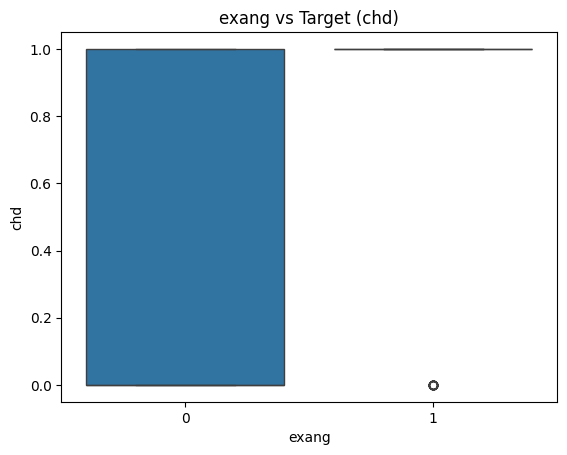

In [19]:
# Boxplot for categorical features
for column in categorical_columns:
    sns.boxplot(x=complete_data[column], y=complete_data['chd'])
    plt.title(f"{column} vs Target (chd)")
    plt.show()

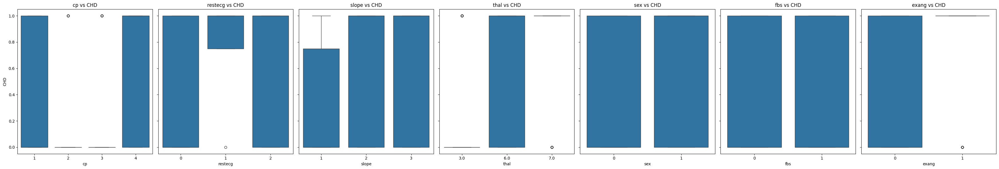

In [20]:
# Define the number of categorical columns
num_columns = len(categorical_columns)

# Set up subplots
fig, axes = plt.subplots(nrows=1, ncols=num_columns, figsize=(5 * num_columns, 6), sharey=True)

# Loop through each categorical column and create a boxplot
for ax, column in zip(axes, categorical_columns):
    sns.boxplot(data=complete_data, x=complete_data[column], y=complete_data['chd'], ax=ax)
    ax.set_title(f"{column} vs CHD")
    ax.set_xlabel(column)
    ax.set_ylabel("CHD")

# Adjust layout for better readability
plt.tight_layout()
plt.show()

1.2 Framingham Heart Study Dataset Extraction and Exploration

In [22]:
# Mount Google Drive
drive.mount('/content/drive')

# Load Framingham Dataset
fsh_dataset = pd.read_csv('/content/drive/My Drive/CHD/framingham.csv')
fsh_dataset.head()

Mounted at /content/drive


,male,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,TenYearCHD
0,1,39,4.0,0,0.0,0.0,0,0,0,195.0,106.0,70.0,26.97,80.0,77.0,0
1,0,46,2.0,0,0.0,0.0,0,0,0,250.0,121.0,81.0,28.73,95.0,76.0,0
2,1,48,1.0,1,20.0,0.0,0,0,0,245.0,127.5,80.0,25.34,75.0,70.0,0
3,0,61,3.0,1,30.0,0.0,0,1,0,225.0,150.0,95.0,28.58,65.0,103.0,1
4,0,46,3.0,1,23.0,0.0,0,0,0,285.0,130.0,84.0,23.10,85.0,85.0,0


1.2.1 Framingham Heart Study Dataset feature extraction, target extraction and column renaming

In [23]:
# Explore the datasets
print("Framingham Dataset Info:")
print(fsh_dataset.info())

Framingham Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   male             4240 non-null   int64  
 1   age              4240 non-null   int64  
 2   education        4135 non-null   float64
 3   currentSmoker    4240 non-null   int64  
 4   cigsPerDay       4211 non-null   float64
 5   BPMeds           4187 non-null   float64
 6   prevalentStroke  4240 non-null   int64  
 7   prevalentHyp     4240 non-null   int64  
 8   diabetes         4240 non-null   int64  
 9   totChol          4190 non-null   float64
 10  sysBP            4240 non-null   float64
 11  diaBP            4240 non-null   float64
 12  BMI              4221 non-null   float64
 13  heartRate        4239 non-null   float64
 14  glucose          3852 non-null   float64
 15  TenYearCHD       4240 non-null   int64  
dtypes: float64(9), int64(7)
memory usag

In [24]:
# Rename a column
fsh_dataset = fsh_dataset.rename(columns={'male': 'sex', 'TenYearCHD':'chd'})
X_fsh = fsh_dataset.drop('chd', axis=1)
y_fsh = fsh_dataset['chd']

# Verify column names
print("\nUpdated Column Names:")
print(fsh_dataset.columns.tolist())


Updated Column Names:
['sex', 'age', 'education', 'currentSmoker', 'cigsPerDay', 'BPMeds', 'prevalentStroke', 'prevalentHyp', 'diabetes', 'totChol', 'sysBP', 'diaBP', 'BMI', 'heartRate', 'glucose', 'chd']


1.2.2 Framingham Heart Study Dataset description

In [25]:
# Dataset details
print("Dataset Information:")
print(fsh_dataset.info())

print("\nColumn Names:")
print(fsh_dataset.columns.tolist())

print("\nTotal Number of Values per Column:")
print(fsh_dataset.count())

print("\nMissing Values (N/A) per Column:")
print(fsh_dataset.isnull().sum())

print("\nTotal Number of Rows and Columns:")
print(f"Rows: {fsh_dataset.shape[0]}, Columns: {fsh_dataset.shape[1]}")

print("\nData Types of Each Column:")
print(fsh_dataset.dtypes)

print("\nSample Unique Values per Column:")
for column in fsh_dataset.columns:
    print(f"{column}: {fsh_dataset[column].unique()[:5]}")

fsh_dataset.describe()

Dataset Information:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4240 entries, 0 to 4239
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   sex              4240 non-null   int64  
 1   age              4240 non-null   int64  
 2   education        4135 non-null   float64
 3   currentSmoker    4240 non-null   int64  
 4   cigsPerDay       4211 non-null   float64
 5   BPMeds           4187 non-null   float64
 6   prevalentStroke  4240 non-null   int64  
 7   prevalentHyp     4240 non-null   int64  
 8   diabetes         4240 non-null   int64  
 9   totChol          4190 non-null   float64
 10  sysBP            4240 non-null   float64
 11  diaBP            4240 non-null   float64
 12  BMI              4221 non-null   float64
 13  heartRate        4239 non-null   float64
 14  glucose          3852 non-null   float64
 15  chd              4240 non-null   int64  
dtypes: float64(9), int64(7)
memory usage: 5

,sex,age,education,currentSmoker,cigsPerDay,BPMeds,prevalentStroke,prevalentHyp,diabetes,totChol,sysBP,diaBP,BMI,heartRate,glucose,chd
count,4240.000000,4240.000000,4135.000000,4240.000000,4211.000000,4187.000000,4240.000000,4240.000000,4240.000000,4190.000000,4240.000000,4240.000000,4221.000000,4239.000000,3852.000000,4240.000000
mean,0.429245,49.580189,1.979444,0.494104,9.005937,0.029615,0.005896,0.310613,0.025708,236.699523,132.354599,82.897759,25.800801,75.878981,81.963655,0.151887
std,0.495027,8.572942,1.019791,0.500024,11.922462,0.169544,0.076569,0.462799,0.158280,44.591284,22.033300,11.910394,4.079840,12.025348,23.954335,0.358953
min,0.000000,32.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,107.000000,83.500000,48.000000,15.540000,44.000000,40.000000,0.000000
25%,0.000000,42.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,206.000000,117.000000,75.000000,23.070000,68.000000,71.000000,0.000000
50%,0.000000,49.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,234.000000,128.000000,82.000000,25.400000,75.000000,78.000000,0.000000
75%,1.000000,56.000000,3.000000,1.000000,20.000000,0.000000,0.000000,1.000000,0.000000,263.000000,144.000000,90.000000,28.040000,83.000000,87.000000,0.000000
max,1.000000,70.000000,4.000000,1.000000,70.000000,1.000000,1.000000,1.000000,1.000000,696.000000,295.000000,142.500000,56.800000,143.000000,394.000000,1.000000


1.2.3 Framingham Heart Study Dataset class distribution

In [26]:
# Class distribution for Framingham Heart Study Dataset
class_distribution_fsh = fsh_dataset['chd'].value_counts()
print("Class Distribution:\n", class_distribution_fsh)

Class Distribution:
 chd
0    3596
1     644
Name: count, dtype: int64


1.2.4 Visualize Framingham Heart Study Dataset class distribution

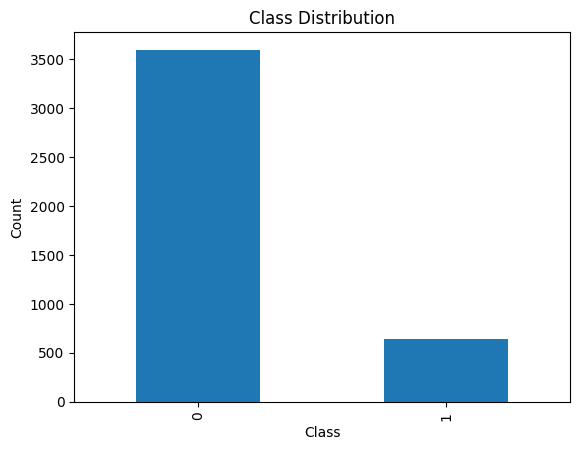

In [27]:
class_distribution_fsh.plot(kind='bar')
plt.title("Class Distribution")
plt.xlabel("Class")
plt.ylabel("Count")
plt.show()

1.2.5 Compute correlation Matrix - Framingham Heart Study Dataset.

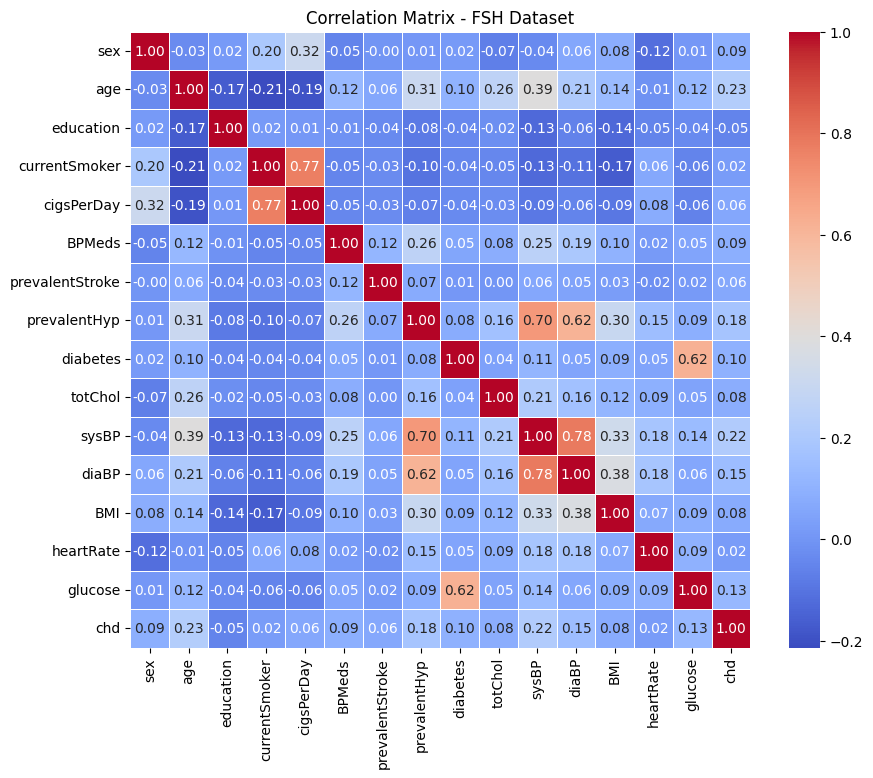

In [28]:
fsh_correlation_matrix = fsh_dataset.corr()

# Display heatmap of correlations
plt.figure(figsize=(10, 8))
sns.heatmap(fsh_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title("Correlation Matrix - FSH Dataset")
plt.show()

1.2.6 Correlation between numerical features and the target in Framingham Heart Study Dataset.

In [29]:
numerical_columns_fsh = ['totChol', 'age', 'sysBP', 'cigsPerDay', 'BMI', 'heartRate', 'glucose', 'diaBP']
categorical_columns_nominal_fsh = ['sex', 'currentSmoker', 'diabetes', 'BPMeds', 'prevalentHyp', 'prevalentStroke']
categorical_columns_fsh = ['sex', 'currentSmoker', 'diabetes', 'BPMeds', 'prevalentHyp', 'prevalentStroke']

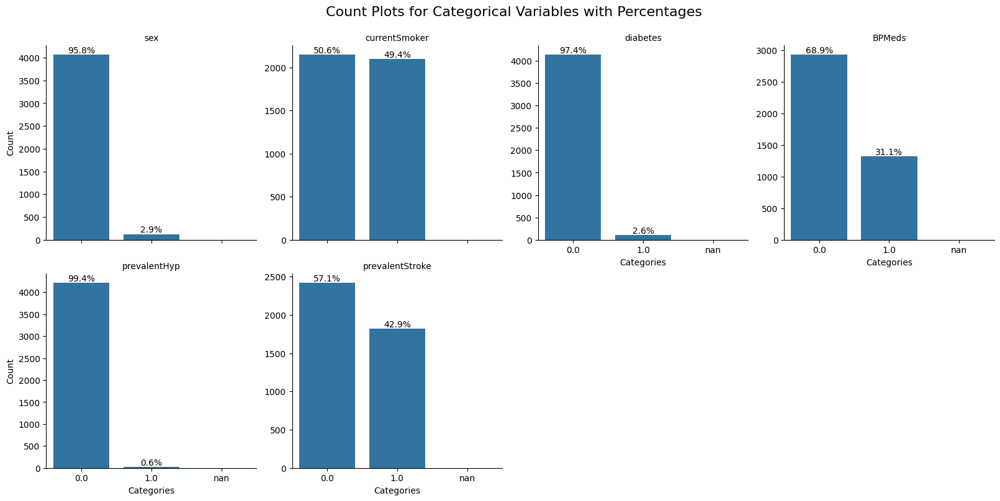

In [30]:
# Melt the dataset to reshape for FacetGrid
melted_data = fsh_dataset.melt(value_vars=categorical_columns_fsh)

# Create the FacetGrid
grid = sns.FacetGrid(melted_data, col="variable", col_wrap=4, sharey=False, height=4)

# Map the countplot and annotate percentages
for ax, (feature, data) in zip(grid.axes.flat, melted_data.groupby("variable")):
    sns.countplot(data=data, x="value", ax=ax, order=sorted(data["value"].unique()))
    annotate_percentages(ax, data, feature)

# Set titles and labels
grid.set_titles("{col_name}")
grid.set_axis_labels("Categories", "Count")
plt.subplots_adjust(top=0.9)
grid.fig.suptitle("Count Plots for Categorical Variables with Percentages", fontsize=16)

# Show the plot
plt.show()

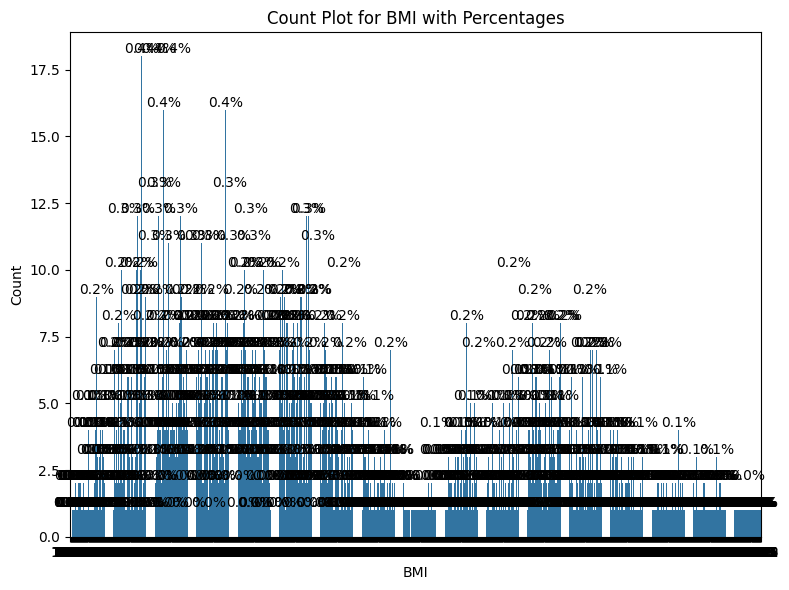

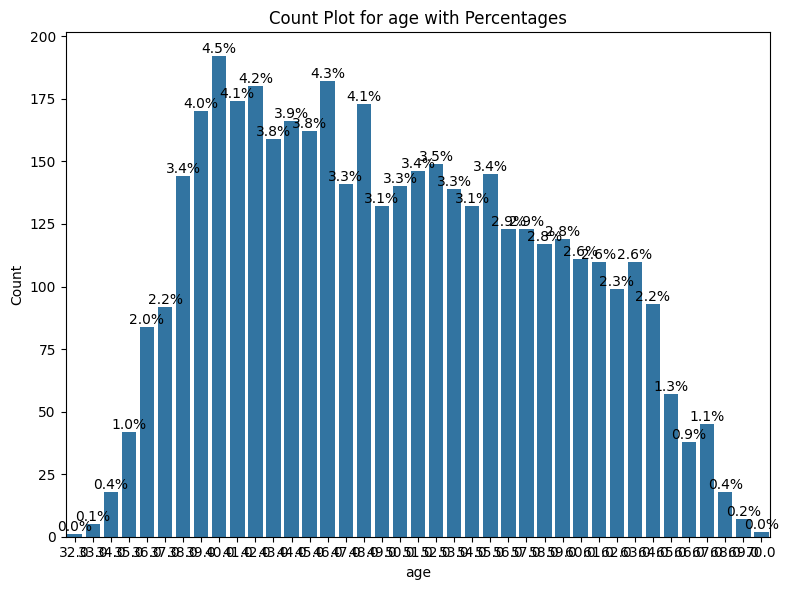

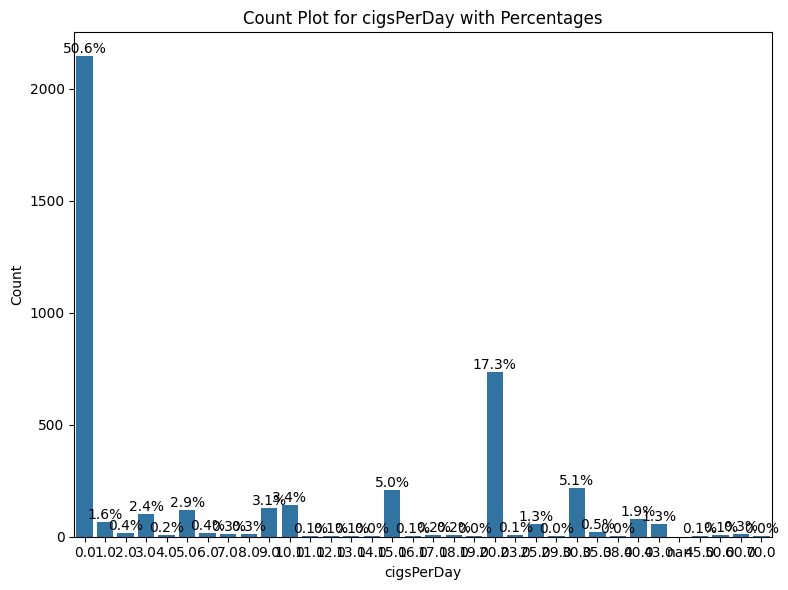

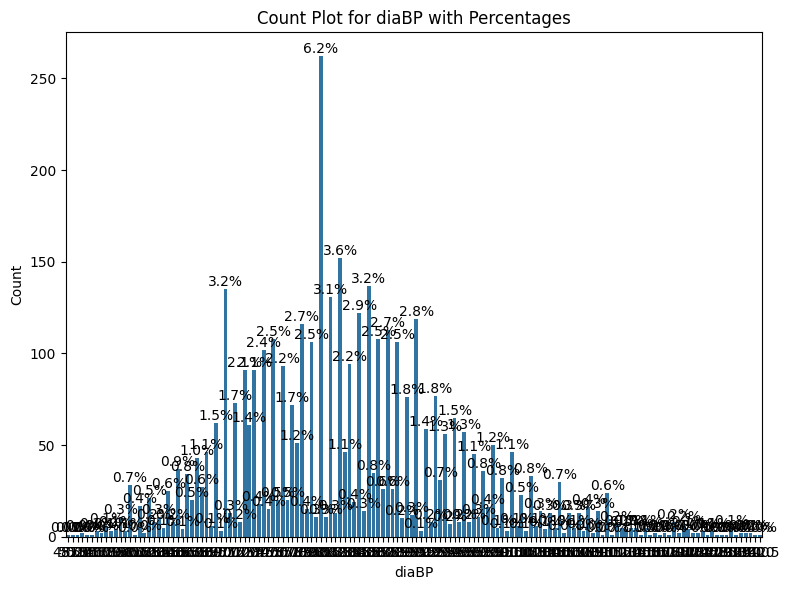

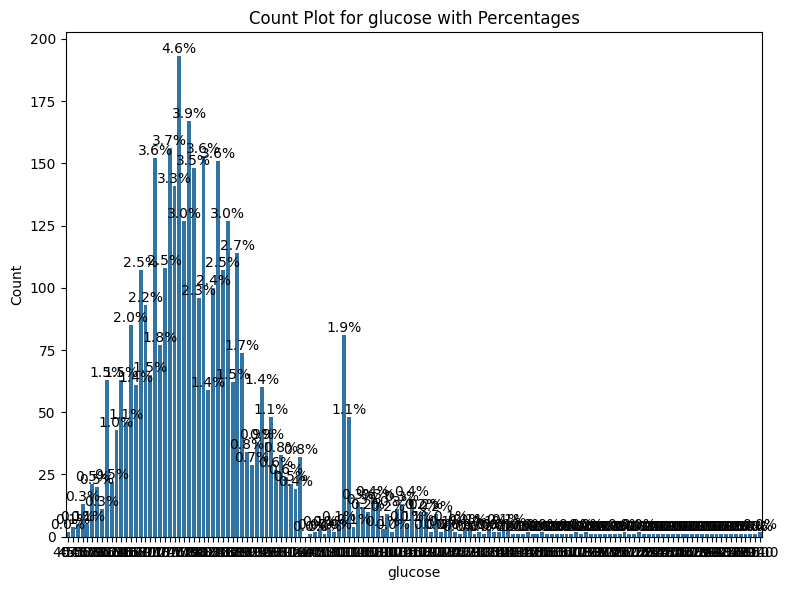

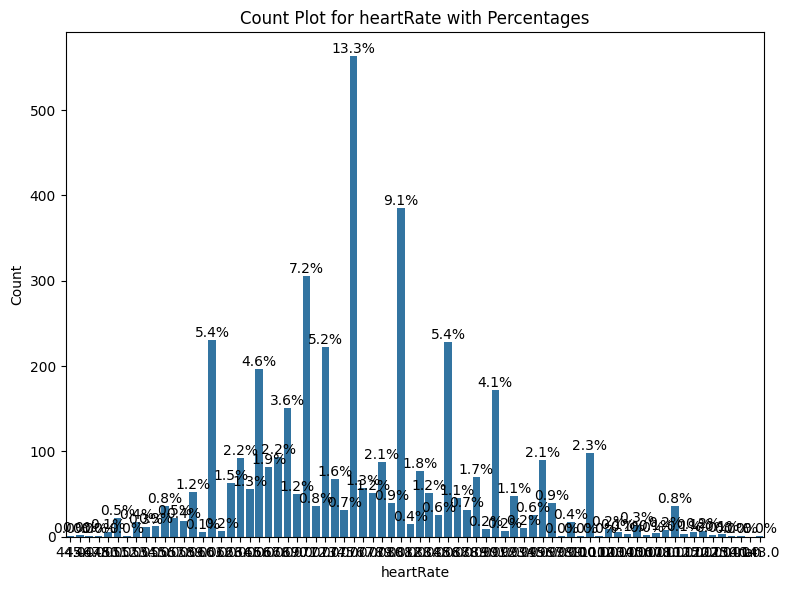

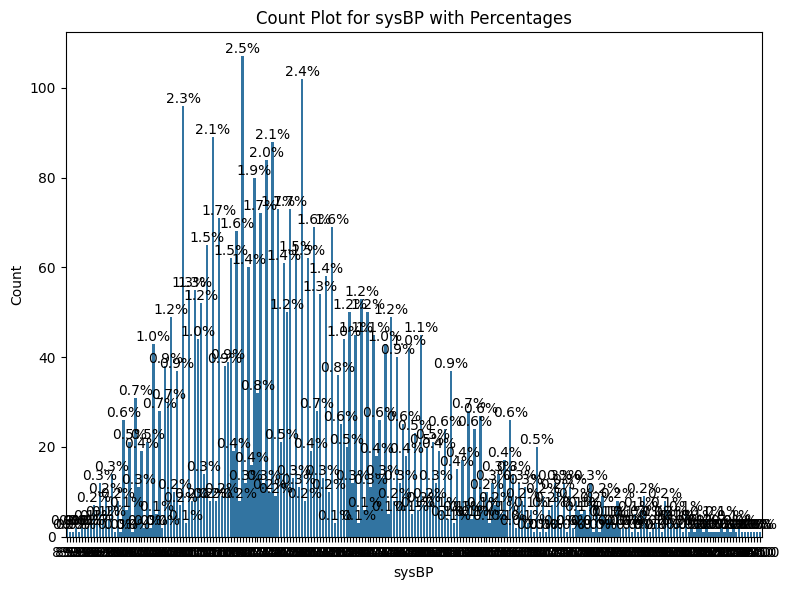

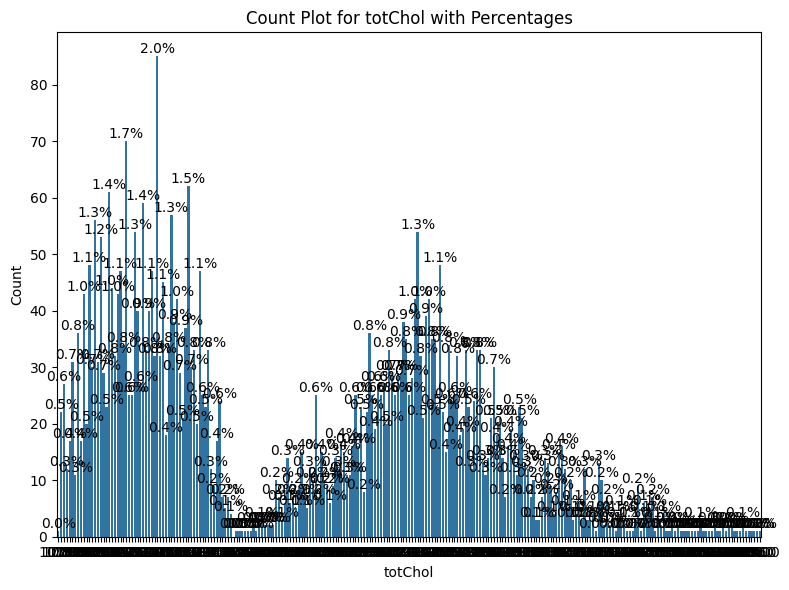

In [31]:
# Melt the dataset to reshape for plotting
melted_data = fsh_dataset.melt(value_vars=numerical_columns_fsh)

# Loop through each numerical variable
for feature, data in melted_data.groupby("variable"):
    plt.figure(figsize=(8, 6))
    ax = sns.countplot(data=data, x="value", order=sorted(data["value"].unique()))

    # Annotate percentages on each bar
    total = len(data)
    for p in ax.patches:
        percentage = f"{100 * p.get_height() / total:.1f}%"
        ax.annotate(percentage,
                    (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='bottom', fontsize=10, color='black')

    # Add title and labels
    plt.title(f"Count Plot for {feature} with Percentages")
    plt.xlabel(feature)
    plt.ylabel("Count")

    # Show the plot
    plt.tight_layout()
    plt.show()

In [32]:
# Calculate correlation between numerical features and the target
correlations_fsh = fsh_dataset[numerical_columns_fsh + ['chd']].corr()

# Extract correlations with the target variable
target_corr_fsh = correlations_fsh['chd'].sort_values(ascending=False)
print("Correlation with target (chd) - FSH Dataset:\n", target_corr_fsh)

Correlation with target (chd) - FSH Dataset:
 chd           1.000000
age           0.225408
sysBP         0.216374
diaBP         0.145112
glucose       0.125590
totChol       0.082369
BMI           0.075300
cigsPerDay    0.057755
heartRate     0.022907
Name: chd, dtype: float64


1.2.7 Scatter plot for numerical features in Framingham Heart Study Dataset

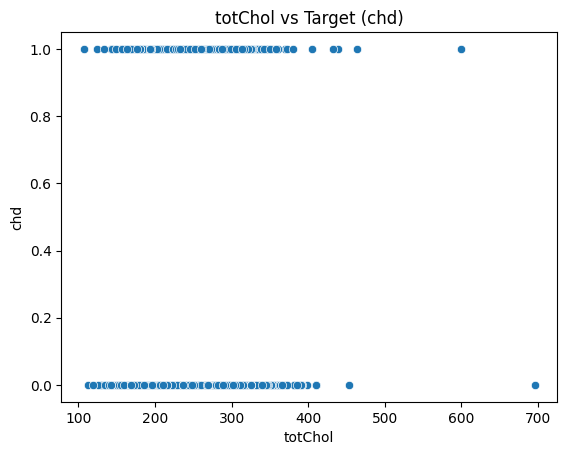

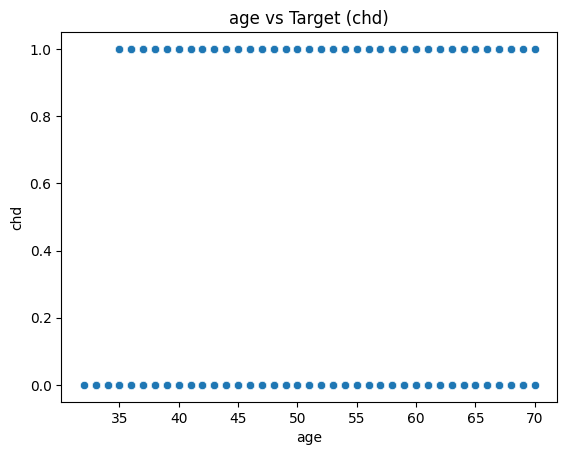

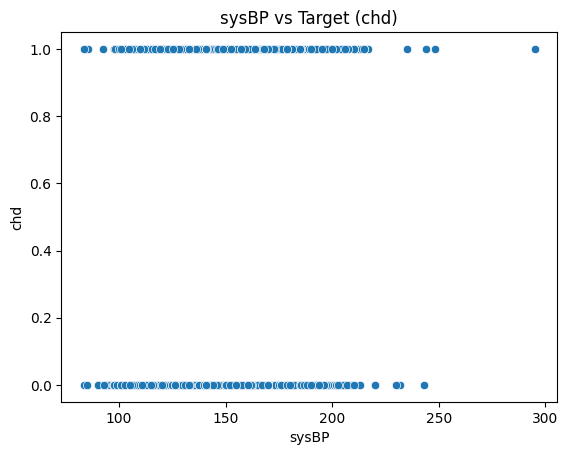

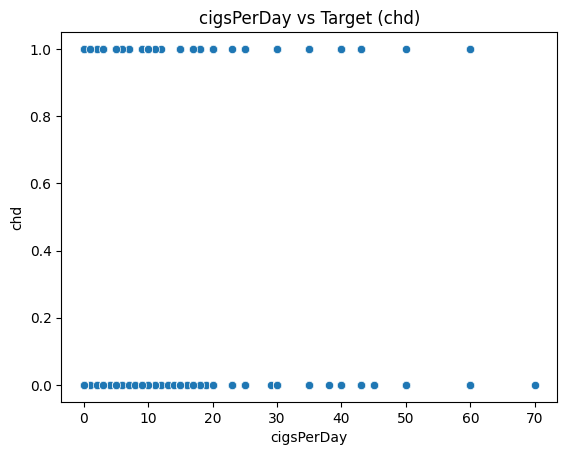

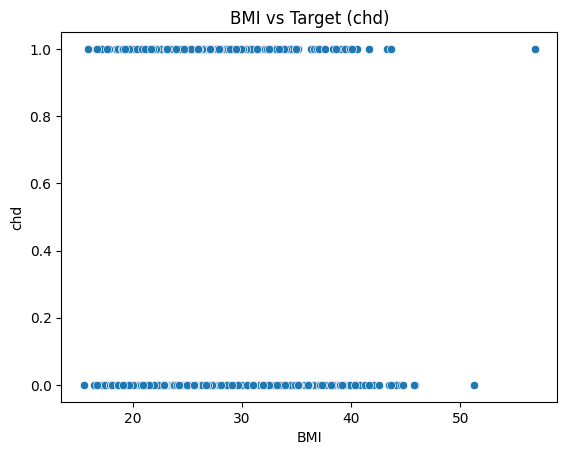

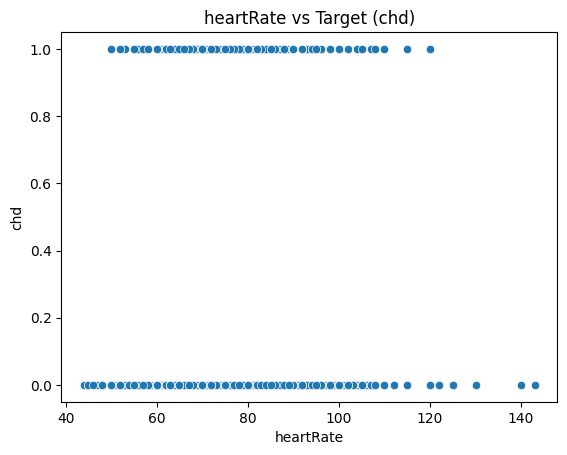

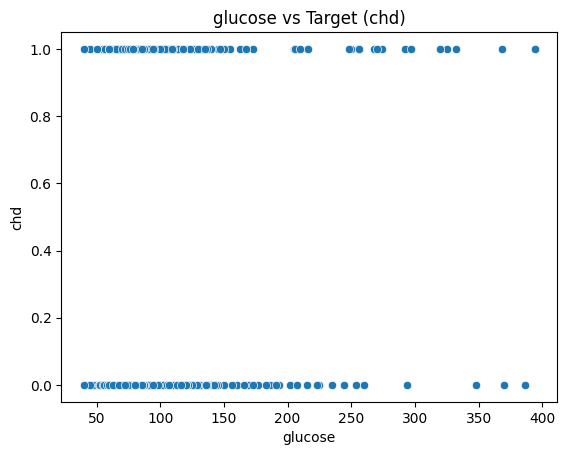

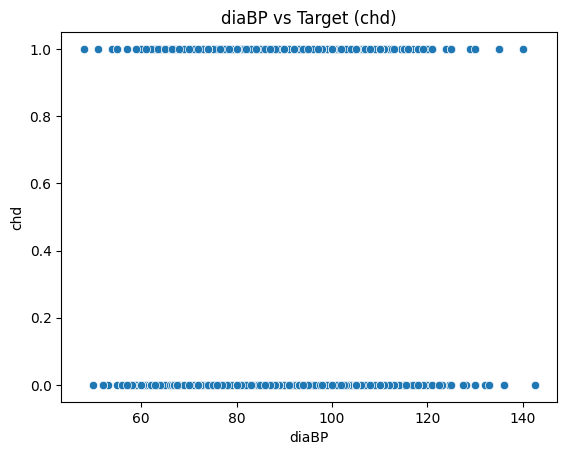

In [33]:
# Scatter plot for numerical features
for column in numerical_columns_fsh:
    sns.scatterplot(x=fsh_dataset[column], y=fsh_dataset['chd'])
    plt.title(f"{column} vs Target (chd)")
    plt.show()

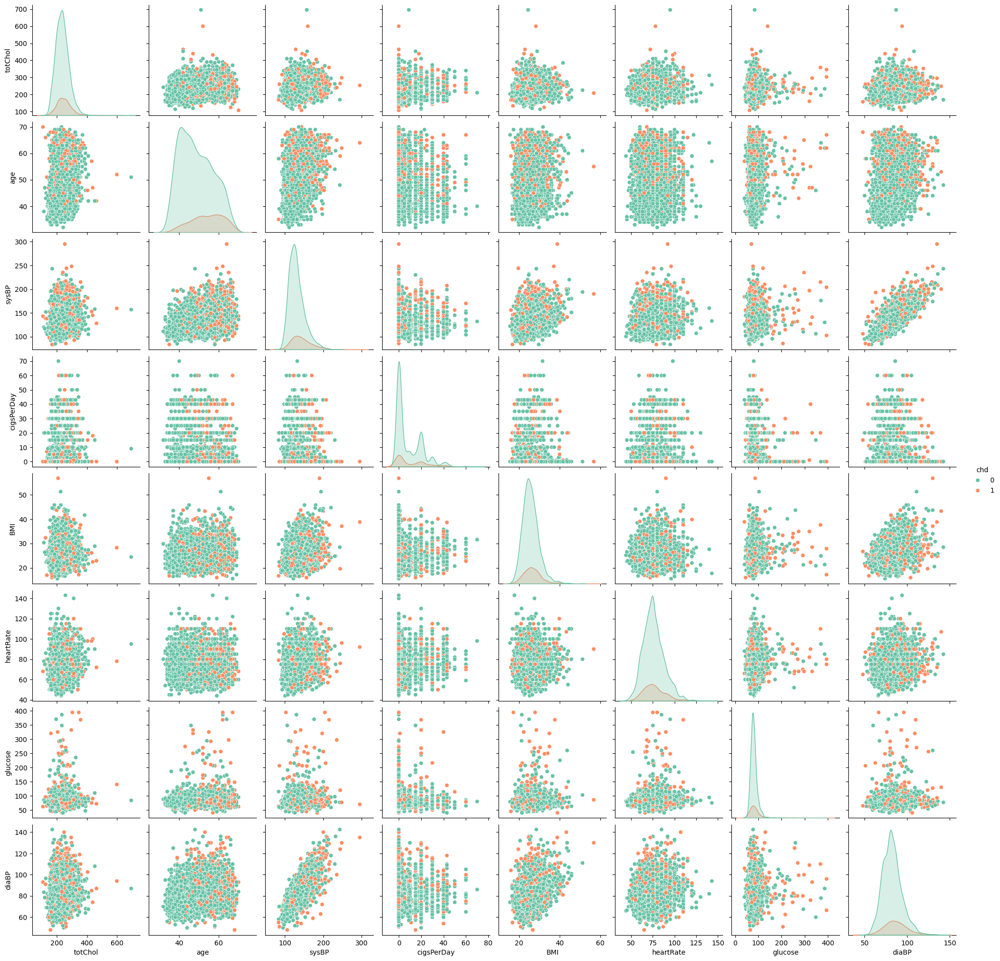

In [34]:
# Adding the target variable to numerical features for visualization
numerical_columns_plot = numerical_columns_fsh + ['chd']

# Creating a pair plot
sns.pairplot(fsh_dataset[numerical_columns_plot], diag_kind='kde', hue='chd', palette="Set2")
plt.show()

<!-- 1.2.8 Label encoding and chi-square test for categorical columns in Framingham Heart Study Dataset -->

In [35]:
# # Label encode categorical columns
# for column in categorical_columns_fsh:
#     fsh_dataset[column] = LabelEncoder().fit_transform(fsh_dataset[column])

# # Perform Chi-Square test
# chi2_values_fsh, p_values_fsh = chi2(fsh_dataset[categorical_columns_fsh], fsh_dataset['chd'])
# chi2_results_fsh = pd.DataFrame({'Feature': categorical_columns_fsh, 'Chi2': chi2_values_fsh, 'p-value': p_values_fsh})
# print(chi2_results_fsh.sort_values(by='Chi2', ascending=False))

1.2.8 Box plot for categorical features in Framingham Heart Study Dataset.

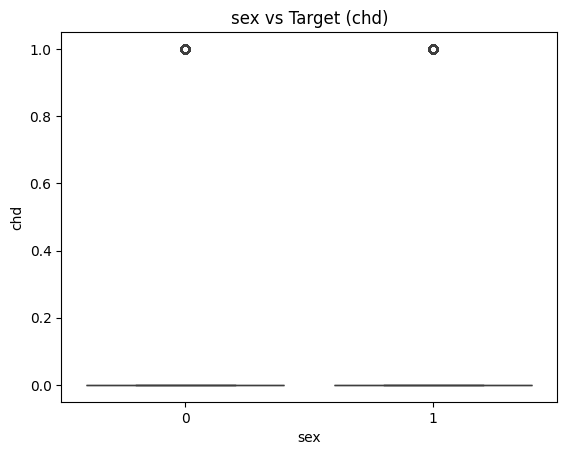

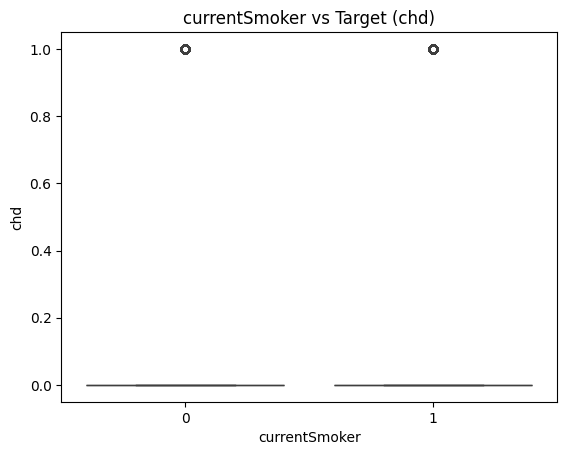

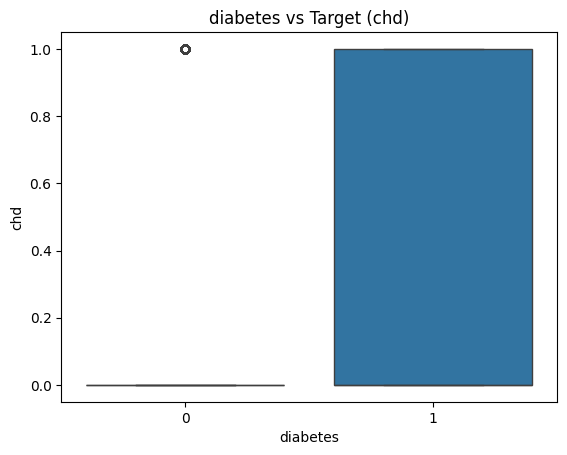

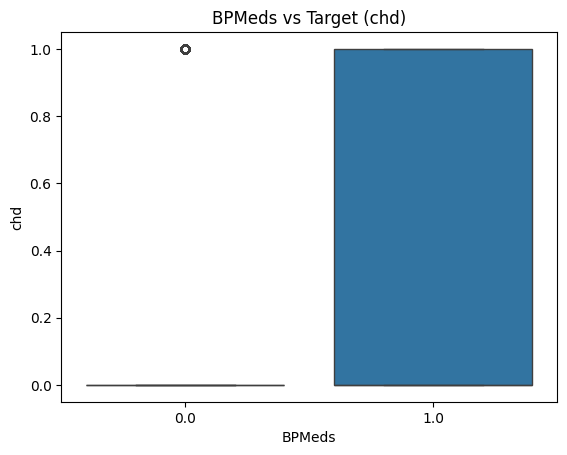

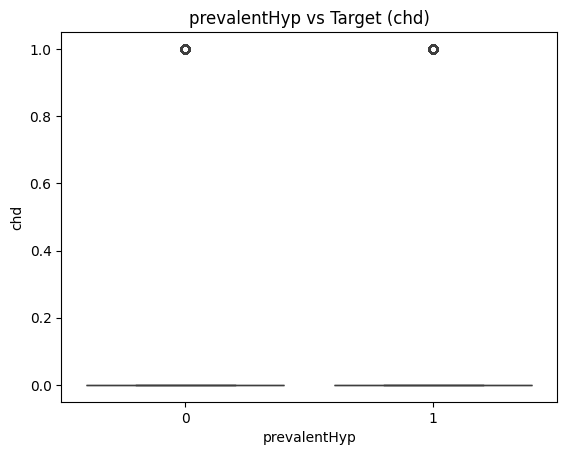

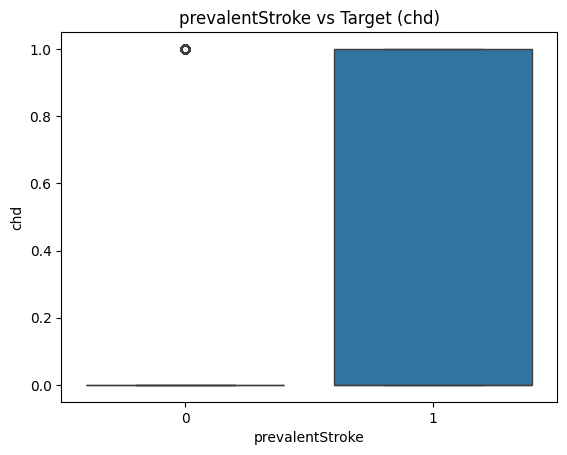

In [36]:
# Boxplot for categorical features
for column in categorical_columns_fsh:
    sns.boxplot(x=fsh_dataset[column], y=fsh_dataset['chd'])
    plt.title(f"{column} vs Target (chd)")
    plt.show()

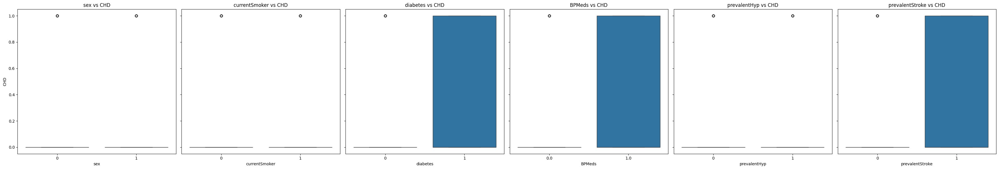

In [37]:
# Define the number of categorical columns
num_columns_fsh = len(categorical_columns_fsh)

# Set up subplots
fig, axes = plt.subplots(nrows=1, ncols=num_columns_fsh, figsize=(5 * num_columns, 6), sharey=True)

# Loop through each categorical column and create a boxplot
for ax, column in zip(axes, categorical_columns_fsh):
    sns.boxplot(data=fsh_dataset, x=fsh_dataset[column], y=fsh_dataset['chd'], ax=ax)
    ax.set_title(f"{column} vs CHD")
    ax.set_xlabel(column)
    ax.set_ylabel("CHD")

# Adjust layout for better readability
plt.tight_layout()
plt.show()

#2. Address Missingness in Datasets
2.1 Input missing data in cleaveland datasets

In [38]:
mice_imputer = IterativeImputer(random_state=42)
complete_data_imputed = pd.DataFrame(mice_imputer.fit_transform(complete_data), columns=complete_data.columns)
X_imputed = complete_data_imputed.drop('chd', axis=1)
y_imputed = complete_data_imputed['chd'].astype(int)

2.1.1 Validate missing data imputation in Cleaveland Dataset

In [39]:
# Check again for missing values
missing_data_summary = complete_data_imputed.isnull().sum().reset_index()
missing_data_summary.columns = ['Column', 'Missing Values']
print(missing_data_summary)

      Column  Missing Values
0        age               0
1        sex               0
2         cp               0
3   trestbps               0
4       chol               0
5        fbs               0
6    restecg               0
7    thalach               0
8      exang               0
9    oldpeak               0
10     slope               0
11        ca               0
12      thal               0
13       chd               0


2.2 Input missing data in Framingham Heart Study Dataset

In [40]:
mice_imputer_fsh = IterativeImputer(random_state=42)
fsh_dataset_imputed = pd.DataFrame(mice_imputer_fsh.fit_transform(fsh_dataset), columns=fsh_dataset.columns)
X_fsh_imputed = fsh_dataset_imputed.drop('chd', axis=1)
y_fsh_imputed = fsh_dataset_imputed['chd'].astype(int)

2.2.1 Validate missing data imputation in Framingham Heart Study Dataset

In [41]:
# Check again for missing values
missing_data_summary_fsh = fsh_dataset_imputed.isnull().sum().reset_index()
missing_data_summary_fsh.columns = ['Column', 'Missing Values']
print(missing_data_summary_fsh)

             Column  Missing Values
0               sex               0
1               age               0
2         education               0
3     currentSmoker               0
4        cigsPerDay               0
5            BPMeds               0
6   prevalentStroke               0
7      prevalentHyp               0
8          diabetes               0
9           totChol               0
10            sysBP               0
11            diaBP               0
12              BMI               0
13        heartRate               0
14          glucose               0
15              chd               0


#3. Feature Encoding and scaling of datasets
3.1 Cleaveland Dataset

- One-Hot Encoding for nominal categorical variables.
- Label Encoding for ordinal categorical variables.
- MinMax Scaling for numerical features.

In [42]:
# One-Hot Encoding for nominal variables
encoder = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
X_nominal = pd.DataFrame(encoder.fit_transform(X_imputed[categorical_columns_nominal]),
                      columns=encoder.get_feature_names_out(categorical_columns_nominal))

# Label Encoding for ordinal variables
label_encoders = {col: LabelEncoder() for col in categorical_columns_ordinal}
X_ordinal = X[categorical_columns_ordinal].apply(lambda col: label_encoders[col.name].fit_transform(col))

# MinMax Scaling for numerical features
scaler = MinMaxScaler()
X_numerical = pd.DataFrame(scaler.fit_transform(X_imputed[numerical_columns]), columns=numerical_columns)

# Combine all transformed features
X_transformed = pd.concat([X_nominal, X_ordinal, X_numerical], axis=1)

3.1.1 view transformed feature for Cleaveland Dataset

In [43]:
X_transformed.head()

,sex_0.0,sex_1.0,fbs_0.0,fbs_1.0,exang_0.0,exang_1.0,cp,restecg,slope,thal,chol,age,trestbps,thalach,oldpeak,ca
0,0.0,1.0,0.0,1.0,1.0,0.0,0,2,2,1,0.244292,0.708333,0.481132,0.603053,0.370968,0.066191
1,0.0,1.0,1.0,0.0,0.0,1.0,3,2,1,0,0.365297,0.791667,0.622642,0.282443,0.241935,1.000000
2,0.0,1.0,1.0,0.0,0.0,1.0,3,2,1,2,0.235160,0.791667,0.245283,0.442748,0.419355,0.688730
3,0.0,1.0,1.0,0.0,1.0,0.0,2,0,2,0,0.283105,0.166667,0.339623,0.885496,0.564516,0.066191
4,1.0,0.0,1.0,0.0,1.0,0.0,1,2,0,0,0.178082,0.250000,0.339623,0.770992,0.225806,0.066191


3.2 Framingham Heart Study Dataset

In [44]:
# One-Hot Encoding for nominal variables
X_nominal_fsh = pd.DataFrame(encoder.fit_transform(X_fsh_imputed[categorical_columns_nominal_fsh]),
                      columns=encoder.get_feature_names_out(categorical_columns_nominal_fsh))

# MinMax Scaling for numerical features
X_numerical_fsh = pd.DataFrame(scaler.fit_transform(X_fsh_imputed[numerical_columns_fsh]), columns=numerical_columns_fsh)

# Combine all transformed features
X_transformed_fsh = pd.concat([X_nominal_fsh, X_numerical_fsh], axis=1)

3.2.1 view transformed feature for Framingham Heart Study Dataset

In [45]:
X_transformed_fsh.head()

,sex_0.0,sex_1.0,currentSmoker_0.0,currentSmoker_1.0,diabetes_0.0,diabetes_1.0,BPMeds_-0.029276627388745716,BPMeds_-0.028067951175821587,BPMeds_-0.025677512386969983,BPMeds_-0.013968299767401646,...,prevalentStroke_0.0,prevalentStroke_1.0,totChol,age,sysBP,cigsPerDay,BMI,heartRate,glucose,diaBP
0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.149406,0.184211,0.106383,0.000000,0.277024,0.363636,0.104520,0.232804
1,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.242784,0.368421,0.177305,0.000000,0.319680,0.515152,0.101695,0.349206
2,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.234295,0.421053,0.208038,0.285714,0.237518,0.313131,0.084746,0.338624
3,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.200340,0.763158,0.314421,0.428571,0.316045,0.212121,0.177966,0.497354
4,1.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.302207,0.368421,0.219858,0.328571,0.183228,0.414141,0.127119,0.380952


#5. Extraction of important features
5.1 Extraction of important features using Random Forest Classifier for Cleaveland Dataset

In [46]:
# Step 4: Feature Selection (SHAP-based and EBM-based)
def select_features_shap(model, X, y, n_features):
    """
    Select top features using SHAP values for binary classification.
    """
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(X)

    # Debugging SHAP values shape
    print(f"SHAP Values Shape: {np.array(shap_values).shape}")

    # Handle SHAP values based on dimensions
    if shap_values.ndim == 3:  # Binary classification with extra dimension
        importance = np.abs(shap_values[:, :, 1]).mean(axis=0)
    elif shap_values.ndim == 2:  # Standard 2D SHAP values
        importance = np.abs(shap_values).mean(axis=0)
    else:
        raise ValueError(f"Unexpected SHAP values dimension: {shap_values.ndim}")

    # Create feature importance DataFrame
    feature_importance = pd.DataFrame({
        "feature": X.columns,
        "importance": importance
    }).sort_values(by="importance", ascending=False)

    # Print SHAP feature importance
    print("\nSHAP Feature Importance:")
    print(feature_importance.head(n_features))

    return feature_importance["feature"].head(n_features).tolist()


def select_features_ebm(model, X, n_features):
    """
    Select top features using EBM's built-in global explanation.
    """
    global_explanation = model.explain_global()

    feature_names = model.feature_names or X.columns.tolist()

    # Debugging shapes
    print(f"\nEBM Feature Names Shape: {len(feature_names)}")
    print(f"EBM Scores Shape: {len(global_explanation.data()['scores'])}")

    # Ensure feature names align with EBM scores
    scores = global_explanation.data()["scores"]
    if len(feature_names) != len(scores):
        raise ValueError(f"Mismatch: {len(feature_names)} feature names vs {len(scores)} EBM scores")

    feature_importance = pd.DataFrame({
        "feature": feature_names,
        "importance": scores
    }).sort_values(by="importance", ascending=False)

    # Print EBM feature importance
    print("\nEBM Feature Importance:")
    print(feature_importance.head(n_features))

    return feature_importance["feature"].head(n_features).tolist()


def ensure_all_one_hot_features(selected_features, feature_mapping):
    """
    Ensure all components of selected one-hot encoded features are included.
    """
    extended_features = set(selected_features)
    for feature, sub_features in feature_mapping.items():
        if any(f in selected_features for f in sub_features):
            extended_features.update(sub_features)
    return list(extended_features)

def auto_extract_original_feature_mapping(columns):
    """
    Automatically extract original feature mapping from one-hot encoded column names.

    Parameters:
    - columns (list): List of column names (e.g., from X_transformed.columns).

    Returns:
    - feature_mapping (dict): Mapping of original features to one-hot encoded components.
    """
    feature_mapping = defaultdict(list)

    for column in columns:
        # Split column name using a regex pattern or a delimiter (e.g., underscore)
        match = re.match(r"^(.*)_[^_]+$", column)  # Matches columns like "feature_value"
        if match:
            original_feature = match.group(1)  # Extract the prefix (original feature name)
            feature_mapping[original_feature].append(column)

    return dict(feature_mapping)


# Define the one-hot encoded feature mapping
original_feature_mapping = auto_extract_original_feature_mapping(list(X_transformed.columns))

# Train and select features using EBM
print("Training EBM...")
ebm = ExplainableBoostingClassifier(interactions=0)  # Disable interactions to avoid warnings
ebm.fit(X_transformed, y_imputed)
selected_features_ebm = select_features_ebm(ebm, X_transformed, 10)

# Train and select features using XGBoost
print("\nTraining XGBoost...")
xgb = XGBClassifier(objective="binary:logistic", random_state=42)
xgb.fit(X_transformed, y_imputed)
selected_features_xgb = select_features_shap(xgb, X_transformed, y_imputed, 10)

# Combine features selected by both models
final_selected_features = list(set(selected_features_xgb).union(set(selected_features_ebm)))

# Ensure all one-hot encoded feature components are included
final_selected_features = ensure_all_one_hot_features(final_selected_features, original_feature_mapping)

# Print final selected features
print("\nFinal Selected Features (Combined EBM and XGBoost, with One-Hot Encoding Adjustments):")
print(final_selected_features)

# Select only the final features from the dataset
X_final_features = X_transformed[final_selected_features]

Training EBM...

EBM Feature Names Shape: 16
EBM Scores Shape: 16

EBM Feature Importance:
      feature  importance
15         ca    0.616453
9        thal    0.488696
6          cp    0.483230
8       slope    0.315947
14    oldpeak    0.261386
4   exang_0.0    0.225137
5   exang_1.0    0.225123
1     sex_1.0    0.196803
0     sex_0.0    0.196717
13    thalach    0.189973

Training XGBoost...
SHAP Values Shape: (303, 16)

SHAP Feature Importance:
     feature  importance
15        ca    1.519470
9       thal    1.187054
6         cp    1.184821
11       age    0.763813
0    sex_0.0    0.739606
8      slope    0.631162
14   oldpeak    0.587870
10      chol    0.459277
13   thalach    0.419532
12  trestbps    0.375409

Final Selected Features (Combined EBM and XGBoost, with One-Hot Encoding Adjustments):
['trestbps', 'exang_1.0', 'chol', 'ca', 'cp', 'age', 'sex_1.0', 'slope', 'oldpeak', 'thal', 'thalach', 'exang_0.0', 'sex_0.0']


5.2 Extraction of important features for Framingham Heart Study Dataset

In [47]:
# Define the one-hot encoded feature mapping
original_feature_mapping_fsh = auto_extract_original_feature_mapping(list(X_transformed_fsh.columns))

# Train and select features using EBM
print("Training EBM...")
ebm_fsh = ExplainableBoostingClassifier(interactions=0)  # Disable interactions to avoid warnings
ebm_fsh.fit(X_transformed_fsh, y_fsh_imputed)
selected_features_ebm_fsh = select_features_ebm(ebm_fsh, X_transformed_fsh, 10)

# Train and select features using XGBoost
print("\nTraining XGBoost...")
xgb_fsh = XGBClassifier(objective="binary:logistic", random_state=42)
xgb_fsh.fit(X_transformed_fsh, y_fsh_imputed)
selected_features_xgb_fsh = select_features_shap(xgb_fsh, X_transformed_fsh, y_fsh_imputed, 10)

# Combine features selected by both models
final_selected_features_fsh = list(set(selected_features_xgb_fsh).union(set(selected_features_ebm_fsh)))

# Ensure all one-hot encoded feature components are included
final_selected_features_fsh = ensure_all_one_hot_features(final_selected_features_fsh, original_feature_mapping_fsh)

# Print final selected features
print("\nFinal Selected Features (Combined EBM and XGBoost, with One-Hot Encoding Adjustments):")
print(final_selected_features_fsh)

# Select only the final features from the dataset
X_final_features_fsh = X_transformed_fsh[final_selected_features_fsh]

Training EBM...

EBM Feature Names Shape: 73
EBM Scores Shape: 73

EBM Feature Importance:
             feature  importance
66               age    0.373063
0            sex_0.0    0.111825
1            sex_1.0    0.111802
62  prevalentHyp_1.0    0.106109
61  prevalentHyp_0.0    0.106046
67             sysBP    0.100986
68        cigsPerDay    0.086722
71           glucose    0.061473
65           totChol    0.054719
72             diaBP    0.048027

Training XGBoost...
SHAP Values Shape: (4240, 73)

SHAP Feature Importance:
             feature  importance
66               age    0.724105
67             sysBP    0.421604
69               BMI    0.314740
65           totChol    0.301111
71           glucose    0.295870
68        cigsPerDay    0.288232
72             diaBP    0.251105
0            sex_0.0    0.249918
70         heartRate    0.233916
61  prevalentHyp_0.0    0.116360

Final Selected Features (Combined EBM and XGBoost, with One-Hot Encoding Adjustments):
['cigsPerDay', 'pr

<!-- #5. Addressing Class Imbalances in Datasets
5.1 Applying SMOTE to Framingham Heart Study Dataset -->

#5. Addressing Class Imbalances in Datasets
Applying SMOTE to Framingham Heart Study Dataset

Class Distribution after SMOTE: Counter({0: 3596, 1: 3596})


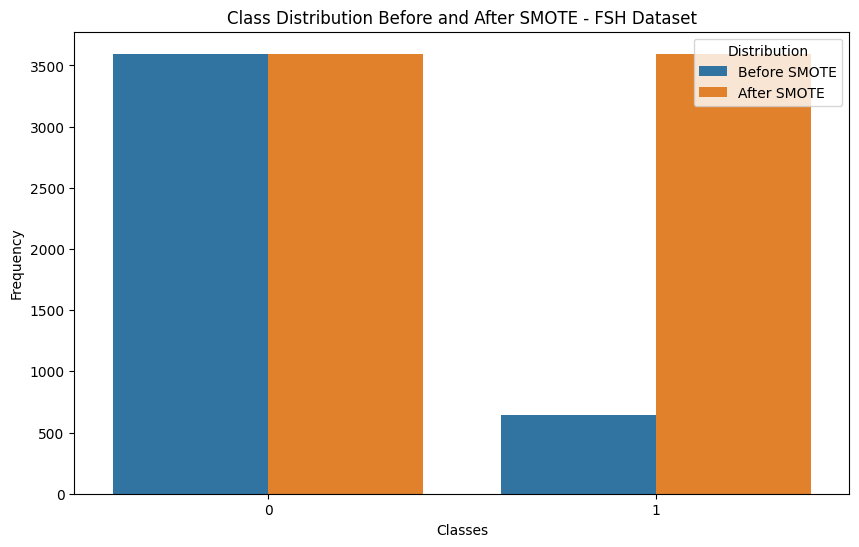

In [48]:
# Apply SMOTE to the dataset
smote = SMOTE(random_state=42)
X_resampled_fsh, y_resampled_fsh = smote.fit_resample(X_final_features_fsh, y_fsh_imputed)

# Check the new class distribution
print("Class Distribution after SMOTE:", Counter(y_resampled_fsh))
# Create dataframes for plotting
original_df_fsh = pd.DataFrame({'Class': y_fsh, 'Distribution': 'Before SMOTE'})
resampled_df_fsh = pd.DataFrame({'Class': y_resampled_fsh, 'Distribution': 'After SMOTE'})

# Combine the dataframes
combined_df_fsh = pd.concat([original_df_fsh, resampled_df_fsh])


plt.figure(figsize=(10, 6))
sns.countplot(x='Class', hue='Distribution', data=combined_df_fsh)
plt.title("Class Distribution Before and After SMOTE - FSH Dataset")
plt.xlabel("Classes")
plt.ylabel("Frequency")
plt.show()

#5. Splitting of Training and Testing set
5.1 Splitting of training and testing set for Cleaveland Dataset

In [49]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_final_features, y_imputed, test_size=0.2, random_state=42)

5.2 Splitting of training and testing set for Framingham Heart Study Dataset

In [50]:
# Split into training and testing sets
X_train_fsh, X_test_fsh, y_train_fsh, y_test_fsh = train_test_split(X_resampled_fsh, y_resampled_fsh, test_size=0.2, random_state=42)

In [51]:
def validate_correlation(selected_features, dataset, target_col):
    """
    Validate selected features by checking their correlation with the target variable.
    Handles one-hot encoded features by removing suffixes like '_1.0', '_0.0', etc.

    Parameters:
    - selected_features (list): Features selected by SHAP or EBM.
    - dataset (pd.DataFrame): Complete dataset with features and target.
    - target_col (str): Name of the target column.

    Returns:
    - pd.DataFrame: Correlation of selected features with the target.
    """
    # Map one-hot encoded features to their original names
    def strip_suffix(feature):
        return feature.split('_')[0] if '_' in feature else feature

    # Strip suffixes from selected features
    stripped_features = [strip_suffix(f) for f in selected_features]

    # Ensure unique features after stripping suffixes
    stripped_features = list(set(stripped_features))

    # Ensure selected features exist in the dataset
    valid_features = [f for f in stripped_features if f in dataset.columns]

    # Add target column to the feature list
    valid_features.append(target_col)

    # Calculate correlations
    correlations = dataset[valid_features].corr()
    target_corr = correlations[target_col].drop(target_col).sort_values(ascending=False)
    return target_corr


# Validate features for Cleveland dataset
cleveland_corr = validate_correlation(final_selected_features, complete_data, 'chd')
print("\nCorrelation with target (chd) - Validated Features (Cleveland):")
print(cleveland_corr)

# Validate features for Framingham dataset
framingham_corr = validate_correlation(final_selected_features_fsh, fsh_dataset, 'chd')
print("\nCorrelation with target (chd) - Validated Features (Framingham):")
print(framingham_corr)


Correlation with target (chd) - Validated Features (Cleveland):
thal        0.525689
ca          0.460442
exang       0.431894
oldpeak     0.424510
cp          0.414446
slope       0.339213
sex         0.276816
age         0.223120
trestbps    0.150825
chol        0.085164
thalach    -0.417167
Name: chd, dtype: float64

Correlation with target (chd) - Validated Features (Framingham):
age             0.225408
sysBP           0.216374
prevalentHyp    0.177458
diaBP           0.145112
glucose         0.125590
sex             0.088374
totChol         0.082369
BMI             0.075300
cigsPerDay      0.057755
heartRate       0.022907
Name: chd, dtype: float64


In [52]:
def validate_statistical_relevance(X, y, selected_features):
    """
    Validate statistical relevance of features using chi2 and ANOVA.

    Parameters:
    - X (pd.DataFrame): Feature matrix.
    - y (pd.Series): Target vector.
    - selected_features (list): Selected features for validation.

    Returns:
    - pd.DataFrame: Statistical relevance of selected features.
    """
    X_selected = X[selected_features]
    scaler = MinMaxScaler()
    X_scaled = pd.DataFrame(scaler.fit_transform(X_selected), columns=selected_features)

    # Chi-square for categorical and f_classif for numerical
    chi2_scores, chi2_p_values = chi2(X_scaled, y)
    f_scores, f_p_values = f_classif(X_scaled, y)

    stats = pd.DataFrame({
        'Feature': selected_features,
        'Chi2 Score': chi2_scores,
        'Chi2 p-value': chi2_p_values,
        'ANOVA F-Score': f_scores,
        'ANOVA p-value': f_p_values
    }).sort_values(by='Chi2 Score', ascending=False)
    return stats

# Validate statistical relevance for Cleveland dataset
cleveland_stats = validate_statistical_relevance(X_transformed, y_imputed, final_selected_features)
print("\nStatistical Relevance - Validated Features (Cleveland):")
print(cleveland_stats)

# Validate statistical relevance for Framingham dataset
framingham_stats = validate_statistical_relevance(X_resampled_fsh, y_resampled_fsh, final_selected_features_fsh)
print("\nStatistical Relevance - Validated Features (Framingham):")
print(framingham_stats)


Statistical Relevance - Validated Features (Cleveland):
      Feature  Chi2 Score  Chi2 p-value  ANOVA F-Score  ANOVA p-value
1   exang_1.0   38.052613  6.886243e-10      69.020891   3.365774e-15
9        thal   28.991480  7.269733e-08     106.018052   1.689796e-21
3          ca   19.871736  8.281573e-06      81.703376   1.976787e-17
11  exang_0.0   18.466709  1.728982e-05      69.020891   3.365774e-15
12    sex_0.0   15.785218  7.095470e-05      24.978872   9.851911e-07
8     oldpeak   11.382669  7.413251e-04      66.166707   1.097605e-14
7       slope   10.984336  9.188519e-04      39.138194   1.353757e-09
6     sex_1.0    7.432845  6.404399e-03      24.978872   9.851911e-07
4          cp    7.384879  6.577449e-03      62.423779   5.250735e-14
10    thalach    2.670638  1.022151e-01      63.419223   3.456965e-14
5         age    1.005896  3.158880e-01      15.769637   8.955637e-05
0    trestbps    0.532647  4.654960e-01       7.006632   8.548269e-03
2        chol    0.111079  7.3891

In [53]:
def validate_clinical_relevance(selected_features, clinical_features):
    """
    Validate selected features against clinical relevance.

    Parameters:
    - selected_features (list): Selected features for validation.
    - clinical_features (list): Features known to be clinically relevant.

    Returns:
    - list: Selected features that match clinical relevance.
    """
    # Map one-hot encoded features to their original names
    def strip_suffix(feature):
        return feature.split('_')[0] if '_' in feature else feature

    # Strip suffixes from selected features
    stripped_features = [strip_suffix(f) for f in selected_features]

    # Ensure unique features after stripping suffixes
    stripped_features = list(set(stripped_features))
    validated_features = [feature for feature in stripped_features if feature in clinical_features]
    return validated_features

# Known clinically relevant features for CVD
clinical_relevant_features = [
    'age', 'sex', 'chol', 'sysBP', 'diaBP', 'cigsPerDay', 'BMI', 'glucose',
    'currentSmoker', 'diabetes', 'prevalentHyp', 'prevalentStroke', 'ca', 'thal'
]

# Validate Cleveland dataset features
cleveland_clinical = validate_clinical_relevance(final_selected_features, clinical_relevant_features)
print("\nClinically Validated Features (Cleveland):")
print(cleveland_clinical)

# Validate Framingham dataset features
framingham_clinical = validate_clinical_relevance(final_selected_features_fsh, clinical_relevant_features)
print("\nClinically Validated Features (Framingham):")
print(framingham_clinical)


Clinically Validated Features (Cleveland):
['chol', 'ca', 'age', 'sex', 'thal']

Clinically Validated Features (Framingham):
['cigsPerDay', 'age', 'prevalentHyp', 'sex', 'diaBP', 'sysBP', 'BMI', 'glucose']


In [54]:
def feature_agreement(shap_features, ebm_features, clinical_features):
    """
    Assess agreement between SHAP, EBM, and clinical relevance.

    Parameters:
    - shap_features (list): SHAP-selected features.
    - ebm_features (list): EBM-selected features.
    - clinical_features (list): Clinically relevant features.

    Returns:
    - dict: Overlap counts and feature names between SHAP, EBM, and clinical features.
    """
    # Map one-hot encoded features to their original names
    def strip_suffix(feature):
        return feature.split('_')[0] if '_' in feature else feature

    shap_features = [strip_suffix(f) for f in shap_features]
    ebm_features = [strip_suffix(f) for f in ebm_features]

    # Calculate overlaps
    shap_clinical_overlap = set(shap_features) & set(clinical_features)
    ebm_clinical_overlap = set(ebm_features) & set(clinical_features)
    combined_overlap = set(shap_features) & set(ebm_features) & set(clinical_features)

    return {
        'SHAP & Clinical': {
            'count': len(shap_clinical_overlap),
            'features': list(shap_clinical_overlap)
        },
        'EBM & Clinical': {
            'count': len(ebm_clinical_overlap),
            'features': list(ebm_clinical_overlap)
        },
        'All Three': {
            'count': len(combined_overlap),
            'features': list(combined_overlap)
        }
    }


agreement = feature_agreement(selected_features_xgb, selected_features_ebm, clinical_relevant_features)
print("\nFeature Agreement Between SHAP, EBM, and Clinical Relevance for Cleaveland Datasets:")
for category, details in agreement.items():
    print(f"{category}: {details['count']} features")
    print(f"Features: {details['features']}")

agreement_fsh = feature_agreement(selected_features_xgb_fsh, selected_features_ebm_fsh, clinical_relevant_features)
print("\nFeature Agreement Between SHAP, EBM, and Clinical Relevance for Framingham Heart Study Datasets:")
for category, details in agreement_fsh.items():
    print(f"{category}: {details['count']} features")
    print(f"Features: {details['features']}")


Feature Agreement Between SHAP, EBM, and Clinical Relevance for Cleaveland Datasets:
SHAP & Clinical: 5 features
Features: ['chol', 'ca', 'age', 'sex', 'thal']
EBM & Clinical: 3 features
Features: ['thal', 'sex', 'ca']
All Three: 3 features
Features: ['thal', 'sex', 'ca']

Feature Agreement Between SHAP, EBM, and Clinical Relevance for Framingham Heart Study Datasets:
SHAP & Clinical: 8 features
Features: ['cigsPerDay', 'age', 'prevalentHyp', 'sex', 'diaBP', 'sysBP', 'BMI', 'glucose']
EBM & Clinical: 7 features
Features: ['cigsPerDay', 'age', 'prevalentHyp', 'sex', 'diaBP', 'sysBP', 'glucose']
All Three: 7 features
Features: ['cigsPerDay', 'age', 'prevalentHyp', 'sex', 'diaBP', 'sysBP', 'glucose']


In [55]:
def expand_one_hot_features(final_features, feature_mapping):
    """
    Expand original features to their one-hot encoded components.
    """
    expanded_features = []
    for feature in final_features:
        if feature in feature_mapping:
            expanded_features.extend(feature_mapping[feature])  # Add all one-hot components
        else:
            expanded_features.append(feature)  # Add as-is if no mapping
    return expanded_features

final_features_cleveland = ['ca', 'thal', 'exang', 'oldpeak', 'cp', 'slope', 'sex']
X_final_cleveland = X_transformed[expand_one_hot_features(final_features_cleveland, original_feature_mapping)]


In [56]:
final_features_framingham = ['prevalentHyp', 'glucose', 'age', 'sysBP', 'diaBP', 'cigsPerDay']
X_final_framingham = X_resampled_fsh[expand_one_hot_features(final_features_framingham, original_feature_mapping_fsh)]

In [57]:
# Split data for Cleveland
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(
    X_final_cleveland, y_imputed, test_size=0.2, random_state=42, stratify=y_imputed
)
print(f"y_test_2 unique values: {np.unique(y_imputed)}")
print(f"y_test_2 unique values: {np.unique(y_test_2)}")
print(f"Shape of X_train_2: {X_train_2.shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")
print(f"Shape of y_train_2: {y_train_2.shape}")
print(f"Shape of y_test_2: {y_test_2.shape}")

y_test_2 unique values: [0 1]
y_test_2 unique values: [0 1]
Shape of X_train_2: (242, 9)
Shape of X_test_2: (61, 9)
Shape of y_train_2: (242,)
Shape of y_test_2: (61,)


In [58]:
# Split data for Framingham
X_train_fsh_2, X_test_fsh_2, y_train_fsh_2, y_test_fsh_2 = train_test_split(
    X_final_framingham, y_resampled_fsh, test_size=0.2, random_state=42, stratify=y_resampled_fsh
)

6.1.1 Model Design and Training for Cleaveland Dataset

6.2.1 Model Design and Training for Framingham Heart Study Dataset

#8. Training base models and Ensemble model Based on top SHAP selected features
8.1 Training Base models for Cleaveland Dataset

In [92]:
# Train EBM
ebm = ExplainableBoostingClassifier(random_state=42, interactions=10)
ebm.fit(X_train_2, y_train_2)
print("EBM training successful.")

# Train XGBoost
xgb = XGBClassifier(objective="binary:logistic", eval_metric='logloss', random_state=42)
xgb.fit(X_train_2, y_train_2)
print("XGBoost training successful.")
models = {
    "EBM": ebm,
    "XGBoost": xgb
}

EBM training successful.
XGBoost training successful.


In [93]:
print(f"Shape of X_train_2: {X_train_2.shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")
print("Training features:", X_train_2.columns.tolist())
print("Test features:", X_test_2.columns.tolist())
print(f"XGBoost feature names: {xgb.get_booster().feature_names}")

Shape of X_train_2: (242, 9)
Shape of X_test_2: (61, 9)
Training features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']
Test features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']
XGBoost feature names: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']


8.1.1 Training Ensemble model for Cleaveland Datatset

In [98]:
# Train Models and Evaluate Performance
def train_and_evaluate(models, X_train, X_test, y_train, y_test, dataset_name):
    results = []
    for name, model in models.items():
        print(f"\nTraining {name} for {dataset_name} Dataset...")
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1]

        metrics = {
            "Model": name,
            "Accuracy": accuracy_score(y_test, y_pred),
            "Precision": precision_score(y_test, y_pred, average='weighted'),
            "Recall": recall_score(y_test, y_pred, average='weighted'),
            "F1-Score": f1_score(y_test, y_pred, average='weighted'),
            "AUC-ROC": roc_auc_score(y_test, y_prob)
        }

        print(f"\n{name} - {dataset_name} Dataset Performance:")
        print(classification_report(y_test, y_pred))
        print(f"AUC-ROC: {metrics['AUC-ROC']:.4f}")

        results.append(metrics)

    return pd.DataFrame(results)

In [89]:
print(f"Shape of X_train_2: {X_train_2.shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")
print("Training features:", X_train_2.columns.tolist())
print("Test features:", X_test_2.columns.tolist())

Shape of X_train_2: (242, 9)
Shape of X_test_2: (61, 9)
Training features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']
Test features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']


In [99]:
# Train and Evaluate Ensemble
print("\nTraining and Evaluating Ensemble Model...")
ensemble = VotingClassifier(
    estimators=[('ebm', models['EBM']), ('xgb', models['XGBoost'])],
    voting='soft',
    weights=[0.7, 0.3]  # Higher weight for EBM due to interpretability
)

ensemble.fit(X_train_2, y_train_2)
y_pred_ensemble = ensemble.predict(X_test_2)
y_prob_ensemble = ensemble.predict_proba(X_test_2)[:, 1]

print(f"y_test_2 unique values: {np.unique(y_test_2)}")
print(f"y_prob_ensemble shape: {y_prob_ensemble.shape}")


ensemble_metrics = {
    "Model": "Ensemble",
    "Accuracy": accuracy_score(y_test_2, y_pred_ensemble),
    "Precision": precision_score(y_test_2, y_pred_ensemble, average='weighted'),
    "Recall": recall_score(y_test_2, y_pred_ensemble, average='weighted'),
    "F1-Score": f1_score(y_test_2, y_pred_ensemble, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_2, y_prob_ensemble)
}

print("\nEnsemble Model - Cleveland Dataset Performance:")
print(classification_report(y_test_2, y_pred_ensemble))
print(f"AUC-ROC: {ensemble_metrics['AUC-ROC']:.4f}")

# Compile and Display Metrics
cleveland_results = train_and_evaluate(models, X_train_2, X_test_2, y_train_2, y_test_2, "Cleveland")
# Convert ensemble metrics to a DataFrame if it's a dictionary
ensemble_metrics_df = pd.DataFrame([ensemble_metrics])

# Use pd.concat to combine results
cleveland_results = pd.concat([cleveland_results, ensemble_metrics_df], ignore_index=True)

print("\nCleveland Dataset Results:")
print(cleveland_results)


Training and Evaluating Ensemble Model...
y_test_2 unique values: [0 1]
y_prob_ensemble shape: (61,)

Ensemble Model - Cleveland Dataset Performance:
              precision    recall  f1-score   support

           0       0.90      0.82      0.86        33
           1       0.81      0.89      0.85        28

    accuracy                           0.85        61
   macro avg       0.85      0.86      0.85        61
weighted avg       0.86      0.85      0.85        61

AUC-ROC: 0.9556

Training EBM for Cleveland Dataset...

EBM - Cleveland Dataset Performance:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        33
           1       0.87      0.93      0.90        28

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61

AUC-ROC: 0.9524

Training XGBoost for Cleveland Dataset...

XGBoost - Cleveland Dataset Performance:
 

In [87]:
print(f"Ensemble model feature names: {ensemble.named_estimators_['ebm'].feature_names}")
print(f"EBM feature names: {ebm.feature_names}")
print(f"XGBoost feature names: {xgb.get_booster().feature_names}")

Ensemble model feature names: None
EBM feature names: None
XGBoost feature names: ['prevalentHyp_0.0', 'prevalentHyp_1.0', 'glucose', 'age', 'sysBP', 'diaBP', 'cigsPerDay']


8.2 Training Base models for Framingham Heart Study Dataset

In [62]:
# Train EBM
ebm_fsh = ExplainableBoostingClassifier(random_state=42, interactions=10)
ebm_fsh.fit(X_train_fsh_2, y_train_fsh_2)
print("EBM training successful.")

# Train XGBoost
xgb_fsh = XGBClassifier(eval_metric='logloss', random_state=42, objective="binary:logistic")
xgb_fsh.fit(X_train_fsh_2, y_train_fsh_2)
print("XGBoost training successful.")

models_fsh = {
    "EBM": ebm_fsh,
    "XGBoost": xgb_fsh
}

EBM training successful.
XGBoost training successful.


8.2.1 Training Ensemble model for Framingham Heart Study Dataset

In [63]:
X_train_fsh_2, X_test_fsh_2, y_train_fsh_2, y_test_fsh_2
# Train and Evaluate Ensemble
print("\nTraining and Evaluating Ensemble Model...")
ensemble_fsh = VotingClassifier(
    estimators=[('ebm', models['EBM']), ('xgb', models['XGBoost'])],
    voting='soft',
    weights=[0.7, 0.3]  # Higher weight for EBM due to interpretability
)

ensemble_fsh.fit(X_train_fsh_2, y_train_fsh_2)
y_pred_ensemble_fsh = ensemble_fsh.predict(X_test_fsh_2)
y_prob_ensemble_fsh = ensemble_fsh.predict_proba(X_test_fsh_2)[:, 1]

print(f"y_test_2 unique values: {np.unique(y_test_fsh_2)}")
print(f"y_prob_ensemble shape: {y_prob_ensemble_fsh.shape}")


ensemble_metrics_fsh = {
    "Model": "Ensemble",
    "Accuracy": accuracy_score(y_test_fsh_2, y_pred_ensemble_fsh),
    "Precision": precision_score(y_test_fsh_2, y_pred_ensemble_fsh, average='weighted'),
    "Recall": recall_score(y_test_fsh_2, y_pred_ensemble_fsh, average='weighted'),
    "F1-Score": f1_score(y_test_fsh_2, y_pred_ensemble_fsh, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_fsh_2, y_prob_ensemble_fsh)
}

print("\nEnsemble Model - Framingham Heart Study Dataset Performance:")
print(classification_report(y_test_fsh_2, y_pred_ensemble_fsh))
print(f"AUC-ROC: {ensemble_metrics_fsh['AUC-ROC']:.4f}")

# Compile and Display Metrics
framingham_results = train_and_evaluate(models_fsh, X_train_fsh_2, X_test_fsh_2, y_train_fsh_2, y_test_fsh_2, "Framingham Heart Study Dataset")
# Convert ensemble metrics to a DataFrame if it's a dictionary
ensemble_metrics_df_fsh = pd.DataFrame([ensemble_metrics_fsh])

# Use pd.concat to combine results
framingham_results = pd.concat([framingham_results, ensemble_metrics_df_fsh], ignore_index=True)

print("\nFramingham Heart Study Dataset Results:")
print(framingham_results)


Training and Evaluating Ensemble Model...
y_test_2 unique values: [0 1]
y_prob_ensemble shape: (1439,)

Ensemble Model - Framingham Heart Study Dataset Performance:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       720
           1       0.94      0.84      0.89       719

    accuracy                           0.89      1439
   macro avg       0.90      0.89      0.89      1439
weighted avg       0.90      0.89      0.89      1439

AUC-ROC: 0.9424

Training EBM for Framingham Heart Study Dataset Dataset...

EBM - Framingham Heart Study Dataset Dataset Performance:
              precision    recall  f1-score   support

           0       0.85      0.96      0.90       720
           1       0.95      0.82      0.88       719

    accuracy                           0.89      1439
   macro avg       0.90      0.89      0.89      1439
weighted avg       0.90      0.89      0.89      1439

AUC-ROC: 0.9340

Training XGBoost for Framing

HYPER PARAMETER TUNING

Cleveland Datasets

EBM Hyper parameter tuning

In [64]:
# Define the parameter grid for EBM
ebm_param_grid = {
    "learning_rate": [0.01, 0.05, 0.1],
    "max_bins": [128, 256],
    "max_leaves": [3, 5, 7],
    "interactions": [0, 10]
}

# Initialize the EBM model
ebm_hpt = ExplainableBoostingClassifier(random_state=42, interactions=10)

# Initialize GridSearchCV
ebm_grid_search = GridSearchCV(
    estimator=ebm_hpt,
    param_grid=ebm_param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Perform the grid search on Cleveland Dataset
ebm_grid_search.fit(X_train_2, y_train_2)

# Display best parameters and best score
print("Best EBM Parameters:", ebm_grid_search.best_params_)
print("Best EBM ROC-AUC Score:", ebm_grid_search.best_score_)

# Update EBM with the best parameters
best_ebm = ebm_grid_search.best_estimator_

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best EBM Parameters: {'interactions': 0, 'learning_rate': 0.05, 'max_bins': 128, 'max_leaves': 3}
Best EBM ROC-AUC Score: 0.9022282467934643


Tuned EBM Metrics

In [65]:
y_pred_ebm_tuned = best_ebm.predict(X_test_2)
y_prob_ebm_tuned = best_ebm.predict_proba(X_test_2)[:, 1]

metrics_ebm_tuned = {
    "Model": 'EBM',
    "Accuracy": accuracy_score(y_test_2, y_pred_ebm_tuned),
    "Precision": precision_score(y_test_2, y_pred_ebm_tuned, average='weighted'),
    "Recall": recall_score(y_test_2, y_pred_ebm_tuned, average='weighted'),
    "F1-Score": f1_score(y_test_2, y_pred_ebm_tuned, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_2, y_prob_ebm_tuned)
}
metrics_ebm_tuned = pd.DataFrame([metrics_ebm_tuned])

XGBoost Hyper parameter tuning

In [66]:
# Define the parameter grid for XGBoost
xgb_param_grid = {
    "learning_rate": [0.01, 0.1, 0.2],
    "max_depth": [3, 5, 7],
    "n_estimators": [50, 100, 200],
    "subsample": [0.8, 1.0],
    "colsample_bytree": [0.8, 1.0],
    "reg_lambda": [0.01, 0.1, 1],
    "reg_alpha": [0, 0.1, 1]
}

# Initialize the XGBoost model
xgb_hpt = XGBClassifier(objective="binary:logistic", random_state=42, eval_metric='logloss')

# Initialize GridSearchCV
xgb_grid_search = GridSearchCV(
    estimator=xgb_hpt,
    param_grid=xgb_param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Perform the grid search on Cleveland Dataset
xgb_grid_search.fit(X_train_2, y_train_2)

# Display best parameters and best score
print("Best XGBoost Parameters:", xgb_grid_search.best_params_)
print("Best XGBoost ROC-AUC Score:", xgb_grid_search.best_score_)

# Update XGBoost with the best parameters
best_xgb = xgb_grid_search.best_estimator_

Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best XGBoost Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 200, 'reg_alpha': 1, 'reg_lambda': 1, 'subsample': 0.8}
Best XGBoost ROC-AUC Score: 0.9077691632039459


Tuned XGB Metrics

In [67]:
y_pred_xgb_tuned = best_xgb.predict(X_test_2)
y_prob_xgb_tuned = best_xgb.predict_proba(X_test_2)[:, 1]

metrics_xgb_tuned = {
    "Model": 'XGB',
    "Accuracy": accuracy_score(y_test_2, y_pred_xgb_tuned),
    "Precision": precision_score(y_test_2, y_pred_xgb_tuned, average='weighted'),
    "Recall": recall_score(y_test_2, y_pred_xgb_tuned, average='weighted'),
    "F1-Score": f1_score(y_test_2, y_pred_xgb_tuned, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_2, y_prob_xgb_tuned)
}
metrics_xgb_tuned = pd.DataFrame([metrics_xgb_tuned])

Tuned Ensemble Model

In [68]:
# Create an updated ensemble with tuned models
ensemble_tuned = VotingClassifier(
    estimators=[('ebm', best_ebm), ('xgb', best_xgb)],
    voting='soft',
    weights=[0.7, 0.3]  # Adjust weights if needed based on performance
)

# Train the ensemble
ensemble_tuned.fit(X_train_2, y_train_2)

# Evaluate the ensemble
y_pred_ensemble_tuned = ensemble_tuned.predict(X_test_2)
y_prob_ensemble_tuned = ensemble_tuned.predict_proba(X_test_2)[:, 1]

# Metrics for the tuned ensemble
ensemble_metrics_tuned = {
    "Model": "Tuned Ensemble",
    "Accuracy": accuracy_score(y_test_2, y_pred_ensemble_tuned),
    "Precision": precision_score(y_test_2, y_pred_ensemble_tuned, average='weighted'),
    "Recall": recall_score(y_test_2, y_pred_ensemble_tuned, average='weighted'),
    "F1-Score": f1_score(y_test_2, y_pred_ensemble_tuned, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_2, y_prob_ensemble_tuned)
}
ensemble_metrics_tuned_df = pd.DataFrame([ensemble_metrics_tuned])

# Display performance
print("\nTuned Ensemble Model - Cleveland Dataset Performance:")
print(classification_report(y_test_2, y_pred_ensemble_tuned))
print(f"AUC-ROC: {ensemble_metrics_tuned['AUC-ROC']:.4f}")

# Use pd.concat to combine results
cleveland_results_tuned = pd.concat([metrics_ebm_tuned, metrics_xgb_tuned, ensemble_metrics_tuned_df], ignore_index=True)

print("\nCleveland Dataset Results:")
print(framingham_results)


Tuned Ensemble Model - Cleveland Dataset Performance:
              precision    recall  f1-score   support

           0       0.94      0.88      0.91        33
           1       0.87      0.93      0.90        28

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61

AUC-ROC: 0.9535

Cleveland Dataset Results:
      Model  Accuracy  Precision    Recall  F1-Score   AUC-ROC
0       EBM  0.891591    0.89868  0.891591  0.891102  0.933955
1   XGBoost  0.872828    0.87552  0.872828  0.872596  0.932004
2  Ensemble  0.894371    0.89930  0.894371  0.894039  0.942387


All tuned metrics

In [69]:
ensemble_metrics_tuned_df = pd.DataFrame([ensemble_metrics_tuned])
# Use pd.concat to combine results
cleveland_results_tuned = pd.concat([metrics_ebm_tuned, metrics_xgb_tuned, ensemble_metrics_tuned_df], ignore_index=True)

print("\nCleveland Dataset Results:")
print(cleveland_results_tuned)


Cleveland Dataset Results:
            Model  Accuracy  Precision    Recall  F1-Score   AUC-ROC
0             EBM  0.901639   0.903896  0.901639  0.901798  0.952381
1             XGB  0.868852   0.871144  0.868852  0.869064  0.935606
2  Tuned Ensemble  0.901639   0.903896  0.901639  0.901798  0.953463


Framingham Heart Study Datasets

EBM Hyper parameter tuning

In [70]:
# Initialize the EBM model
ebm_hpt_fsh = ExplainableBoostingClassifier(random_state=42, interactions=10)

# Initialize GridSearchCV
ebm_grid_search_fsh = GridSearchCV(
    estimator=ebm_hpt_fsh,
    param_grid=ebm_param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Perform the grid search on Cleveland Dataset
ebm_grid_search_fsh.fit(X_train_fsh_2, y_train_fsh_2)

# Display best parameters and best score
print("Best EBM Parameters:", ebm_grid_search_fsh.best_params_)
print("Best EBM ROC-AUC Score:", ebm_grid_search_fsh.best_score_)

# Update EBM with the best parameters
best_ebm_fsh = ebm_grid_search_fsh.best_estimator_

Fitting 5 folds for each of 36 candidates, totalling 180 fits
Best EBM Parameters: {'interactions': 10, 'learning_rate': 0.01, 'max_bins': 128, 'max_leaves': 7}
Best EBM ROC-AUC Score: 0.9366980371770636


Tuned EBM Metrics

In [71]:
y_pred_ebm_tuned_fsh = best_ebm_fsh.predict(X_test_fsh_2)
y_prob_ebm_tuned_fsh = best_ebm_fsh.predict_proba(X_test_fsh_2)[:, 1]

metrics_ebm_tuned_fsh = {
    "Model": 'EBM',
    "Accuracy": accuracy_score(y_test_fsh_2, y_pred_ebm_tuned_fsh),
    "Precision": precision_score(y_test_fsh_2, y_pred_ebm_tuned_fsh, average='weighted'),
    "Recall": recall_score(y_test_fsh_2, y_pred_ebm_tuned_fsh, average='weighted'),
    "F1-Score": f1_score(y_test_fsh_2, y_pred_ebm_tuned_fsh, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_fsh_2, y_prob_ebm_tuned_fsh)
}
metrics_ebm_tuned_fsh = pd.DataFrame([metrics_ebm_tuned_fsh])

XGBoost Hyper parameter tuning

In [72]:
# Initialize the XGBoost model
xgb_hpt_fsh = XGBClassifier(objective="binary:logistic", random_state=42, eval_metric='logloss')

# Initialize GridSearchCV
xgb_grid_search_fsh = GridSearchCV(
    estimator=xgb_hpt_fsh,
    param_grid=xgb_param_grid,
    scoring="roc_auc",
    cv=5,
    verbose=1,
    n_jobs=-1
)

# Perform the grid search on Cleveland Dataset
xgb_grid_search_fsh.fit(X_train_fsh_2, y_train_fsh_2)

# Display best parameters and best score
print("Best XGBoost Parameters:", xgb_grid_search_fsh.best_params_)
print("Best XGBoost ROC-AUC Score:", xgb_grid_search_fsh.best_score_)

# Update XGBoost with the best parameters
best_xgb_fsh = xgb_grid_search_fsh.best_estimator_

Fitting 5 folds for each of 972 candidates, totalling 4860 fits
Best XGBoost Parameters: {'colsample_bytree': 1.0, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'reg_alpha': 0, 'reg_lambda': 0.01, 'subsample': 0.8}
Best XGBoost ROC-AUC Score: 0.9333422589792061


Tuned XGB Metrics

In [73]:
y_pred_xgb_tuned_fsh = best_xgb_fsh.predict(X_test_fsh_2)
y_prob_xgb_tuned_fsh = best_xgb_fsh.predict_proba(X_test_fsh_2)[:, 1]

metrics_xgb_tuned_fsh = {
    "Model": 'XGB',
    "Accuracy": accuracy_score(y_test_fsh_2, y_pred_xgb_tuned_fsh),
    "Precision": precision_score(y_test_fsh_2, y_pred_xgb_tuned_fsh, average='weighted'),
    "Recall": recall_score(y_test_fsh_2, y_pred_xgb_tuned_fsh, average='weighted'),
    "F1-Score": f1_score(y_test_fsh_2, y_pred_xgb_tuned_fsh, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_fsh_2, y_prob_xgb_tuned_fsh)
}
metrics_xgb_tuned_fsh = pd.DataFrame([metrics_xgb_tuned_fsh])

Tuned Ensemble Model

In [74]:
# Create an updated ensemble with tuned models
ensemble_tuned_fsh = VotingClassifier(
    estimators=[('ebm', best_ebm_fsh), ('xgb', best_xgb_fsh)],
    voting='soft',
    weights=[0.7, 0.3]  # Adjust weights if needed based on performance
)

# Train the ensemble
ensemble_tuned_fsh.fit(X_train_fsh_2, y_train_fsh_2)

# Evaluate the ensemble
y_pred_ensemble_tuned_fsh = ensemble_tuned_fsh.predict(X_test_fsh_2)
y_prob_ensemble_tuned_fsh = ensemble_tuned_fsh.predict_proba(X_test_fsh_2)[:, 1]

# Metrics for the tuned ensemble
ensemble_metrics_tuned_fsh = {
    "Model": "Tuned Ensemble",
    "Accuracy": accuracy_score(y_test_fsh_2, y_pred_ensemble_tuned_fsh),
    "Precision": precision_score(y_test_fsh_2, y_pred_ensemble_tuned_fsh, average='weighted'),
    "Recall": recall_score(y_test_fsh_2, y_pred_ensemble_tuned_fsh, average='weighted'),
    "F1-Score": f1_score(y_test_fsh_2, y_pred_ensemble_tuned_fsh, average='weighted'),
    "AUC-ROC": roc_auc_score(y_test_fsh_2, y_prob_ensemble_tuned_fsh)
}

# Display performance
print("\nTuned Ensemble Model - Framingham Heart Study Dataset Performance:")
print(classification_report(y_test_fsh_2, y_pred_ensemble_tuned_fsh))
print(f"AUC-ROC: {ensemble_metrics_tuned_fsh['AUC-ROC']:.4f}")


Tuned Ensemble Model - Framingham Heart Study Dataset Performance:
              precision    recall  f1-score   support

           0       0.85      0.95      0.90       720
           1       0.95      0.83      0.88       719

    accuracy                           0.89      1439
   macro avg       0.90      0.89      0.89      1439
weighted avg       0.90      0.89      0.89      1439

AUC-ROC: 0.9416


All Tuned Metrics

In [75]:
ensemble_metrics_tuned_df_fsh = pd.DataFrame([ensemble_metrics_tuned_fsh])
# Use pd.concat to combine results
framingham_results_tuned_fsh = pd.concat([metrics_ebm_tuned_fsh, metrics_xgb_tuned_fsh, ensemble_metrics_tuned_df_fsh], ignore_index=True)

print("\nFramingham Dataset Results:")
print(framingham_results_tuned_fsh)


Framingham Dataset Results:
            Model  Accuracy  Precision    Recall  F1-Score   AUC-ROC
0             EBM  0.888812   0.896152  0.888812  0.888288  0.931127
1             XGB  0.878388   0.882763  0.878388  0.878034  0.936727
2  Tuned Ensemble  0.891591   0.897807  0.891591  0.891161  0.941553


Crossvalidation of models
Cleveland Dataset

In [76]:
# Define the cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Define custom scoring metrics
scoring = {
    "Accuracy": make_scorer(accuracy_score),
    "Precision": make_scorer(precision_score, average="weighted"),
    "Recall": make_scorer(recall_score, average="weighted"),
    "F1-Score": make_scorer(f1_score, average="weighted"),
    "ROC-AUC": make_scorer(roc_auc_score, needs_proba=True)
}

# Function to perform cross-validation and collect metrics
def perform_cross_validation(model, X, y, cv, scoring):
    """
    Perform cross-validation and collect metrics for a given model.

    Parameters:
    - model: The machine learning model to evaluate.
    - X (pd.DataFrame): Features dataset.
    - y (pd.Series): Target labels.
    - cv (KFold): Cross-validation splitting strategy.
    - scoring (dict): Dictionary of scoring metrics.

    Returns:
    - dict: Summary of mean and standard deviation for each metric.
    """
    results = {metric: [] for metric in scoring.keys()}

    for train_idx, test_idx in cv.split(X, y):
        X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
        y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

        # Train the model
        model.fit(X_train, y_train)

        # Get predictions and probabilities
        y_pred = model.predict(X_test)
        y_prob = model.predict_proba(X_test)[:, 1] if hasattr(model, "predict_proba") else None

        # Calculate each metric
        for metric_name, scorer in scoring.items():
            if metric_name == "ROC-AUC" and y_prob is not None:
                score = scorer._score_func(y_test, y_prob)  # Use the scorer's function for ROC-AUC
            else:
                score = scorer._score_func(y_test, y_pred)
            results[metric_name].append(score)

    # Calculate average and std for each metric
    results_summary = {metric: (np.mean(scores), np.std(scores)) for metric, scores in results.items()}
    return results_summary

# Models to evaluate
models = {
    "EBM": ebm,
    "EBM Tuned": ebm_hpt,
    "XGBoost": xgb,
    "XGBoost Tuned": xgb_hpt,
    "Ensemble": ensemble_tuned,
    "Ensemble Tuned": ensemble,
}

# Perform cross-validation and collect results
cv_results = {}
for model_name, model in models.items():
    print(f"\nPerforming Cross-Validation for {model_name}...")
    results_summary = perform_cross_validation(model, X_train_2, y_train_2, cv, scoring)
    cv_results[model_name] = results_summary

# Display results
cv_table = []
for model_name, metrics in cv_results.items():
    for metric, (mean_score, std_score) in metrics.items():
        cv_table.append({
            "Model": model_name,
            "Metric": metric,
            "Mean Score": round(mean_score, 4),
            "Std Dev": round(std_score, 4)
        })

# Convert results into a DataFrame
cv_results_df = pd.DataFrame(cv_table)

# Display results
print("\nCross-Validation Results:")
print(cv_results_df.to_string(index=False))


Performing Cross-Validation for EBM...


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_scorer.py:610: FutureWarning: The `needs_threshold` and `needs_proba` parameter are deprecated in version 1.4 and will be removed in 1.6. You can either let `response_method` be `None` or set it to `predict` to preserve the same behaviour.
  warnings.warn(



Performing Cross-Validation for EBM Tuned...

Performing Cross-Validation for XGBoost...

Performing Cross-Validation for XGBoost Tuned...

Performing Cross-Validation for Ensemble...

Performing Cross-Validation for Ensemble Tuned...

Cross-Validation Results:
         Model    Metric  Mean Score  Std Dev
           EBM  Accuracy      0.8224   0.0279
           EBM Precision      0.8186   0.0513
           EBM    Recall      0.7929   0.0356
           EBM  F1-Score      0.8040   0.0278
           EBM   ROC-AUC      0.8894   0.0108
     EBM Tuned  Accuracy      0.8224   0.0279
     EBM Tuned Precision      0.8186   0.0513
     EBM Tuned    Recall      0.7929   0.0356
     EBM Tuned  F1-Score      0.8040   0.0278
     EBM Tuned   ROC-AUC      0.8894   0.0108
       XGBoost  Accuracy      0.8018   0.0197
       XGBoost Precision      0.8063   0.0237
       XGBoost    Recall      0.7474   0.0380
       XGBoost  F1-Score      0.7753   0.0266
       XGBoost   ROC-AUC      0.8741   0.0254
 

Framingham Heart Study Dataset

In [77]:
# Models to evaluate
models_fsh = {
    "EBM": ebm_fsh,
    "EBM Tuned": ebm_hpt_fsh,
    "XGBoost": xgb_fsh,
    "XGBoost Tuned": xgb_hpt_fsh,
    "Ensemble": ensemble_tuned_fsh,
    "Ensemble Tuned": ensemble_fsh,
}

# Perform cross-validation and collect results
cv_results_fsh = {}
for model_name, model in models.items():
    print(f"\nPerforming Cross-Validation for {model_name}...")
    results_summary = perform_cross_validation(model, X_train_fsh_2, y_train_fsh_2, cv, scoring)
    cv_results_fsh[model_name] = results_summary

# Display results
cv_table_fsh = []
for model_name, metrics in cv_results_fsh.items():
    for metric, (mean_score, std_score) in metrics.items():
        cv_table_fsh.append({
            "Model": model_name,
            "Metric": metric,
            "Mean Score": round(mean_score, 4),
            "Std Dev": round(std_score, 4)
        })

# Convert results into a DataFrame
cv_results_df_fsh = pd.DataFrame(cv_table_fsh)

# Display results
print("\nCross-Validation Results:")
print(cv_results_df_fsh.to_string(index=False))


Performing Cross-Validation for EBM...

Performing Cross-Validation for EBM Tuned...

Performing Cross-Validation for XGBoost...

Performing Cross-Validation for XGBoost Tuned...

Performing Cross-Validation for Ensemble...

Performing Cross-Validation for Ensemble Tuned...

Cross-Validation Results:
         Model    Metric  Mean Score  Std Dev
           EBM  Accuracy      0.8863   0.0084
           EBM Precision      0.9369   0.0122
           EBM    Recall      0.8286   0.0088
           EBM  F1-Score      0.8794   0.0087
           EBM   ROC-AUC      0.9361   0.0074
     EBM Tuned  Accuracy      0.8863   0.0084
     EBM Tuned Precision      0.9369   0.0122
     EBM Tuned    Recall      0.8286   0.0088
     EBM Tuned  F1-Score      0.8794   0.0087
     EBM Tuned   ROC-AUC      0.9361   0.0074
       XGBoost  Accuracy      0.8608   0.0096
       XGBoost Precision      0.8805   0.0103
       XGBoost    Recall      0.8349   0.0132
       XGBoost  F1-Score      0.8571   0.0102
       

SHAP analysis for XGB base model

Cleveland Dataset

Shape of X_train_2: (242, 9)
Shape of X_test_2: (61, 9)

SHAP Summary Plot - XGBoost


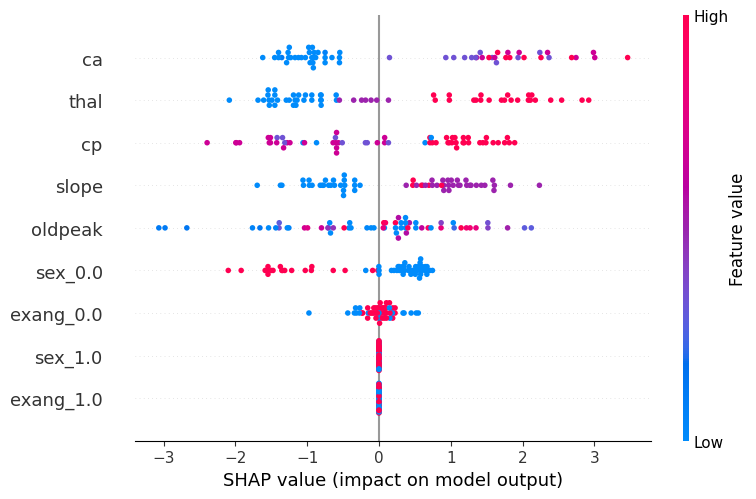


SHAP Bar Plot - Feature Importance


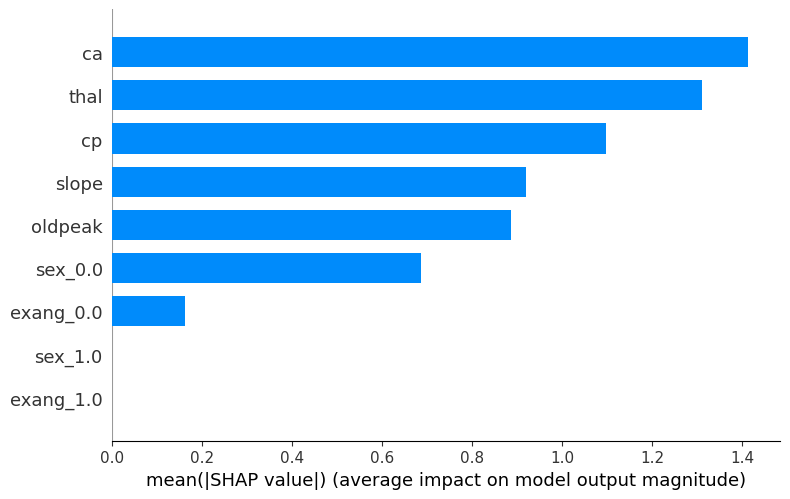


SHAP Force Plot for Sample Index 5


In [94]:
shap.initjs()  # Initialize SHAP JavaScript visualizations
print(f"Shape of X_train_2: {X_train_2.shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")

# xgb_shap = XGBClassifier(objective="binary:logistic", eval_metric='logloss', random_state=42)  # Create a new XGBoost instance
# xgb_shap.fit(X_train_2, y_train_2)

# Initialize SHAP explainer for XGBoost
explainer = shap.TreeExplainer(xgb)

# Compute SHAP values
shap_values = explainer.shap_values(X_test_2)

# Global Explainability - Summary Plot
print("\nSHAP Summary Plot - XGBoost")
shap.summary_plot(shap_values, X_test_2, feature_names=X_test_2.columns)

# Global Explainability - Bar Plot
print("\nSHAP Bar Plot - Feature Importance")
shap.summary_plot(shap_values, X_test_2, plot_type="bar", feature_names=X_test_2.columns)

# Local Explainability - Force Plot for a Specific Instance
sample_idx = 5  # Select a sample index
print(f"\nSHAP Force Plot for Sample Index {sample_idx}")
shap.force_plot(explainer.expected_value, shap_values[sample_idx, :], X_test_2.iloc[sample_idx, :])

Code for EBM Explainability analysis

Cleveland Dataset

In [103]:
print(f"Shape of X_test_2: {X_test_2.shape}")
print(f"Shape of y_test_2: {y_test_2.shape}")
# Retrieve global explanation
global_explanation = ebm.explain_global()
show(global_explanation)
show(ebm.explain_local(X_test_2[:5], y_test_2[:5]), 0)
# Extract univariate features and pairwise interactions
explanation_data = global_explanation.data()

# Separate univariate and pairwise interactions
univariate_features = []
pairwise_interactions = []

for name, score in zip(explanation_data["names"], explanation_data["scores"]):
    if "&" in name:  # Pairwise interactions contain "&"
        pairwise_interactions.append({"Interaction": name, "Score": score})
    else:
        univariate_features.append({"Feature": name, "Score": score})

# Display top univariate features
print("\nTop Univariate Features:")
for feature in sorted(univariate_features, key=lambda x: x["Score"], reverse=True):
    print(f"Feature: {feature['Feature']}, Score: {feature['Score']}")

# Display top pairwise interactions
print("\nTop Pairwise Interactions:")
for interaction in sorted(pairwise_interactions, key=lambda x: x["Score"], reverse=True):
    print(f"Interaction: {interaction['Interaction']}, Score: {interaction['Score']}")

Shape of X_test_2: (61, 9)
Shape of y_test_2: (61,)



Top Univariate Features:
Feature: ca, Score: 0.850840004764316
Feature: thal, Score: 0.6519902743397689
Feature: cp, Score: 0.5919309577513447
Feature: slope, Score: 0.5094573327436721
Feature: oldpeak, Score: 0.31527949872097616
Feature: sex_1.0, Score: 0.22180719904515864
Feature: sex_0.0, Score: 0.22171651834024234
Feature: exang_0.0, Score: 0.18939829403895667
Feature: exang_1.0, Score: 0.18853019515796596

Top Pairwise Interactions:
Interaction: thal & oldpeak, Score: 0.09269008224400296
Interaction: ca & oldpeak, Score: 0.08504691458422492
Interaction: ca & thal, Score: 0.07254983543357779
Interaction: oldpeak & cp, Score: 0.07037949994919615
Interaction: thal & slope, Score: 0.06343940255377908
Interaction: exang_1.0 & oldpeak, Score: 0.047272173664716234
Interaction: exang_0.0 & oldpeak, Score: 0.04620742156129511
Interaction: oldpeak & slope, Score: 0.04606105578096028
Interaction: exang_1.0 & cp, Score: 0.03373111281029308
Interaction: exang_0.0 & cp, Score: 0.03200851022666


Combined Feature Importance (EBM + XGBoost):
1. ca: 1.0194
2. thal: 0.8493
3. cp: 0.7434
4. slope: 0.6322
5. oldpeak: 0.4863
6. sex_0.0: 0.3609
7. exang_0.0: 0.1811
8. sex_1.0: 0.1553
9. exang_1.0: 0.1320
10. thal & oldpeak: 0.0649
11. ca & oldpeak: 0.0595
12. ca & thal: 0.0508
13. oldpeak & cp: 0.0493
14. thal & slope: 0.0444
15. exang_1.0 & oldpeak: 0.0331
16. exang_0.0 & oldpeak: 0.0323
17. oldpeak & slope: 0.0322
18. exang_1.0 & cp: 0.0236
19. exang_0.0 & cp: 0.0224


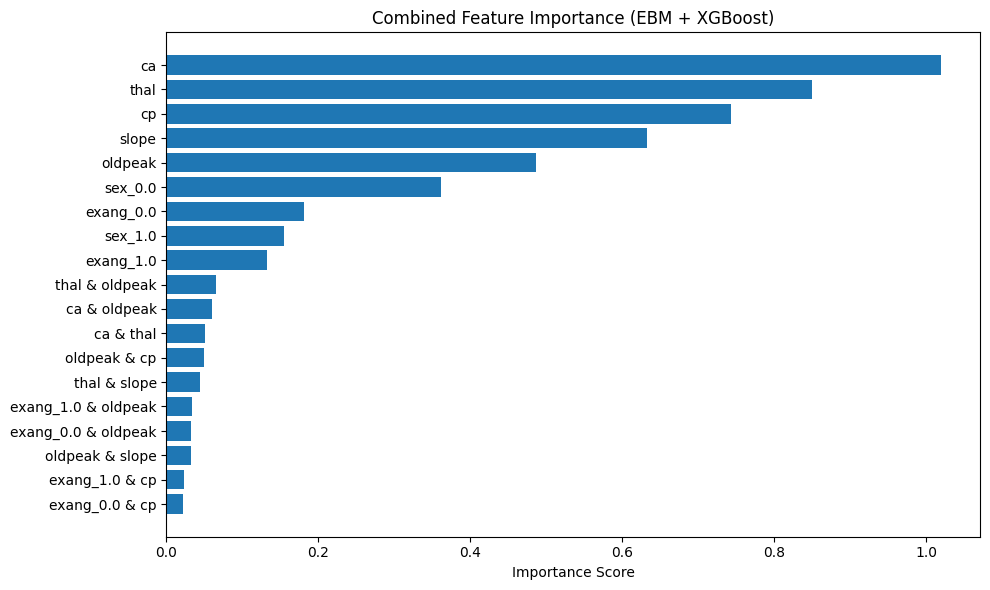


SHAP Summary Plot for XGBoost:


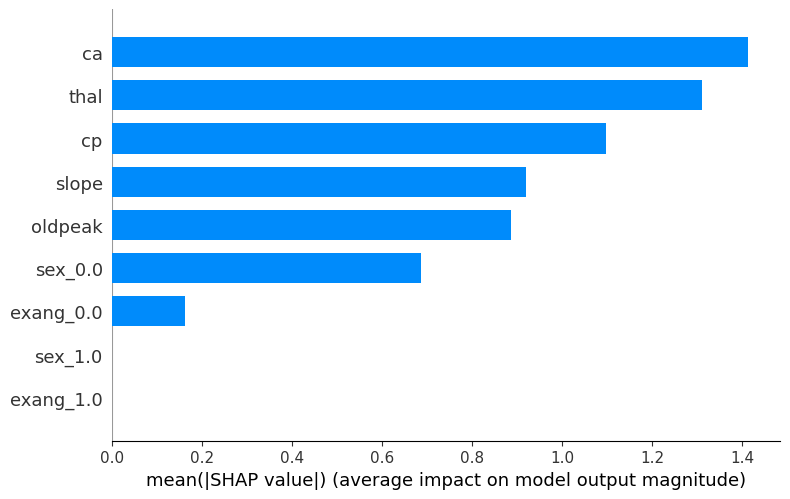

In [96]:
# Step 1: Extract Feature Importance from EBM
ebm_global = ebm.explain_global()
# show(ebm_global)
ebm_importance = {
    feature: score for feature, score in zip(
        ebm_global.feature_names, ebm_global.data()["scores"]
    )
}

# Step 2: Extract Feature Importance from XGBoost using SHAP
explainer_xgb = shap.TreeExplainer(xgb)
shap_values_xgb = explainer_xgb.shap_values(X_test_2)

# Calculate mean absolute SHAP values as feature importance for XGBoost
xgb_importance = {
    feature: abs(shap_values_xgb[:, idx]).mean()
    for idx, feature in enumerate(X_test_2.columns)
}

# Step 3: Combine Feature Importances
# Use ensemble weights already defined in your code (e.g., [0.7, 0.3])
ensemble_weights = {"EBM": 0.7, "XGBoost": 0.3}
combined_importance = {}

for feature in set(ebm_importance.keys()).union(xgb_importance.keys()):
    ebm_score = ebm_importance.get(feature, 0)  # Default to 0 if feature is not in EBM
    xgb_score = xgb_importance.get(feature, 0)  # Default to 0 if feature is not in XGBoost
    combined_importance[feature] = (
        ensemble_weights["EBM"] * ebm_score +
        ensemble_weights["XGBoost"] * xgb_score
    )

# Step 4: Sort Combined Importances
sorted_importance = sorted(combined_importance.items(), key=lambda x: x[1], reverse=True)

# Display Combined Feature Importance
print("\nCombined Feature Importance (EBM + XGBoost):")
for i, (feature, importance) in enumerate(sorted_importance):
    print(f"{i + 1}. {feature}: {importance:.4f}")

# Bar Plot of Combined Feature Importance
import matplotlib.pyplot as plt

# Prepare data for plotting
features = [item[0] for item in sorted_importance]
importance_scores = [item[1] for item in sorted_importance]

# Plot
plt.figure(figsize=(10, 6))
plt.barh(features[::-1], importance_scores[::-1])  # Reverse for descending order
plt.xlabel("Importance Score")
plt.title("Combined Feature Importance (EBM + XGBoost)")
plt.tight_layout()
plt.show()

# SHAP Summary Plot for XGBoost
print("\nSHAP Summary Plot for XGBoost:")
shap.summary_plot(shap_values_xgb, X_test_2, plot_type="bar")

Shape of X_train_2: (242, 9)
Shape of X_test_2: (61, 9)
Training features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']
Test features: ['ca', 'thal', 'exang_0.0', 'exang_1.0', 'oldpeak', 'cp', 'slope', 'sex_0.0', 'sex_1.0']



Initializing SHAP Kernel Explainer for the Ensemble...

Calculating SHAP Values for the Ensemble...


  0%|          | 0/61 [00:00<?, ?it/s]

Shape of shap_values_ensemble: (61, 9, 2)
Shape of X_test_2: (61, 9)
Shape of shap_values_binary: (61, 9)

Generating SHAP Summary Plot for the Ensemble...


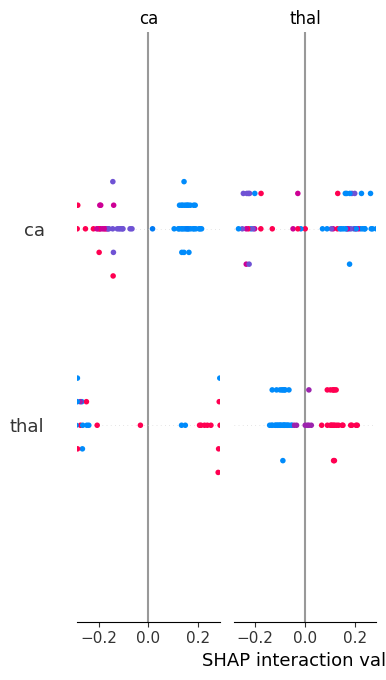


Generating Local Explanation for Sample Index 5...


In [100]:
print(f"Shape of X_train_2: {X_train_2.shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")

print("Training features:", X_train_2.columns.tolist())
print("Test features:", X_test_2.columns.tolist())

shap.initjs()   # Initialize SHAP JavaScript visualizations
# Step 1: Initialize SHAP Kernel Explainer
print("\nInitializing SHAP Kernel Explainer for the Ensemble...")
ensemble_explainer = shap.KernelExplainer(ensemble.predict_proba, X_test_2)

# Step 2: Calculate SHAP Values for the Test Set
print("\nCalculating SHAP Values for the Ensemble...")
shap_values_ensemble = ensemble_explainer.shap_values(X_test_2, nsamples=100)

# Debug: Check the shape of SHAP values and feature matrix
print(f"Shape of shap_values_ensemble: {np.array(shap_values_ensemble).shape}")
print(f"Shape of X_test_2: {X_test_2.shape}")
# Step 3: For Binary Classification (Extract SHAP Values for Positive Class)
# For binary classification, shap_values_ensemble is a 3D array (n_samples, n_features, 2)
# Extract values for the positive class (class 1)
shap_values_binary = shap_values_ensemble[:, :, 1]

# Debug: Check the new shape
print(f"Shape of shap_values_binary: {shap_values_binary.shape}")
assert shap_values_binary.shape == X_test_2.shape, "Mismatch between SHAP values and feature matrix!"

# Step 4: Generate Summary Plot for the Binary Classifier
print("\nGenerating SHAP Summary Plot for the Ensemble...")
shap.summary_plot(
    shap_values_ensemble,
    X_test_2,
    feature_names=X_test_2.columns,
    show=True
)

# Step 5: Local Explanations for a Specific Instance
sample_idx = 5  # Select a sample index for local explanations
print(f"\nGenerating Local Explanation for Sample Index {sample_idx}...")

shap.force_plot(
    ensemble_explainer.expected_value[1],  # Expected value for the positive class
    shap_values_binary[sample_idx],
    X_test_2.iloc[sample_idx],
    feature_names=X_test_2.columns
)

SHAP Analysis for XGB BOOST

Framingham Heart Study Dataset


SHAP Summary Plot - XGBoost


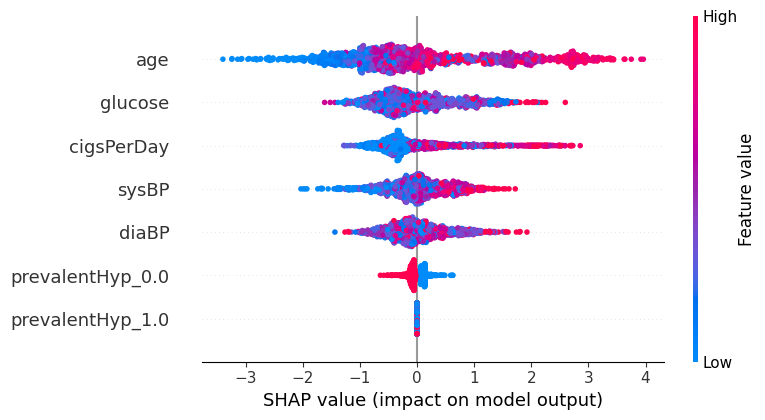


SHAP Bar Plot - Feature Importance


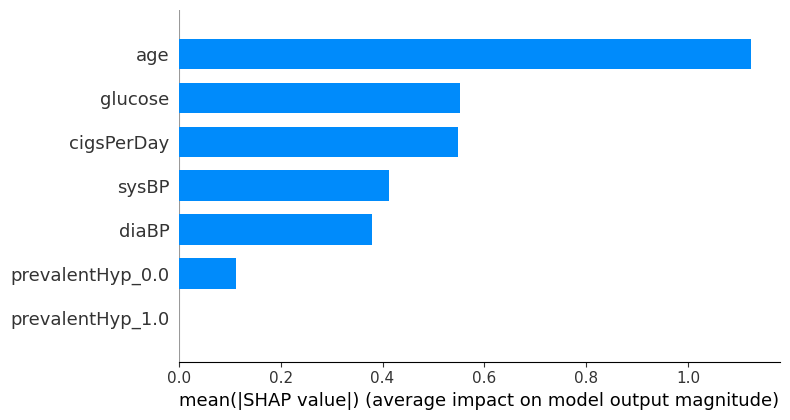


SHAP Force Plot for Sample Index 5


In [101]:
shap.initjs()  # Initialize SHAP JavaScript visualizations

# Initialize SHAP explainer for XGBoost
explainer_fsh = shap.TreeExplainer(xgb_fsh)

# Compute SHAP values
shap_values_fsh = explainer_fsh.shap_values(X_test_fsh_2)

# Global Explainability - Summary Plot
print("\nSHAP Summary Plot - XGBoost")
shap.summary_plot(shap_values_fsh, X_test_fsh_2, feature_names=X_test_fsh_2.columns)

# Global Explainability - Bar Plot
print("\nSHAP Bar Plot - Feature Importance")
shap.summary_plot(shap_values_fsh, X_test_fsh_2, plot_type="bar", feature_names=X_test_fsh_2.columns)

# Local Explainability - Force Plot for a Specific Instance
sample_idx_fsh = 5  # Select a sample index
print(f"\nSHAP Force Plot for Sample Index {sample_idx_fsh}")
shap.force_plot(explainer_fsh.expected_value, shap_values_fsh[sample_idx_fsh, :], X_test_fsh_2.iloc[sample_idx_fsh, :])

Code for EBM Explainability analysis

Framingham Heart Study Dataset

In [102]:
# Retrieve global explanation
global_explanation_fsh = ebm_fsh.explain_global()
show(global_explanation_fsh)
show(ebm_fsh.explain_local(X_test_fsh_2[:5], y_test[:5]), 0)
# Extract univariate features and pairwise interactions
explanation_data_fsh = global_explanation_fsh.data()

# Separate univariate and pairwise interactions
univariate_features_fsh = []
pairwise_interactions_fsh = []

for name, score in zip(explanation_data_fsh["names"], explanation_data_fsh["scores"]):
    if "&" in name:  # Pairwise interactions contain "&"
        pairwise_interactions_fsh.append({"Interaction": name, "Score": score})
    else:
        univariate_features_fsh.append({"Feature": name, "Score": score})

# Display top univariate features
print("\nTop Univariate Features:")
for feature in sorted(univariate_features_fsh, key=lambda x: x["Score"], reverse=True):
    print(f"Feature: {feature['Feature']}, Score: {feature['Score']}")

# Display top pairwise interactions
print("\nTop Pairwise Interactions:")
for interaction in sorted(pairwise_interactions_fsh, key=lambda x: x["Score"], reverse=True):
    print(f"Interaction: {interaction['Interaction']}, Score: {interaction['Score']}")


Top Univariate Features:
Feature: age, Score: 1.660930419138663
Feature: cigsPerDay, Score: 0.648672482900072
Feature: diaBP, Score: 0.5896983254652421
Feature: glucose, Score: 0.46285808370241305
Feature: sysBP, Score: 0.3273373724591637
Feature: prevalentHyp_0.0, Score: 0.08964690826357104
Feature: prevalentHyp_1.0, Score: 0.089212622343879

Top Pairwise Interactions:
Interaction: age & sysBP, Score: 0.052998857195778196
Interaction: age & diaBP, Score: 0.04895539353412879
Interaction: age & cigsPerDay, Score: 0.04621178533626022
Interaction: sysBP & cigsPerDay, Score: 0.03472625116923019
Interaction: glucose & diaBP, Score: 0.032703380959198794
Interaction: sysBP & diaBP, Score: 0.03076343105726097
Interaction: glucose & age, Score: 0.02907781221901979
Interaction: glucose & sysBP, Score: 0.02811629832945313
Interaction: prevalentHyp_0.0 & diaBP, Score: 0.016774178295367793
Interaction: prevalentHyp_1.0 & diaBP, Score: 0.016591625626778815



Combined Feature Importance (EBM + XGBoost):
1. age: 1.5000
2. cigsPerDay: 0.6188
3. diaBP: 0.5263
4. glucose: 0.4894
5. sysBP: 0.3527
6. prevalentHyp_0.0: 0.0964
7. prevalentHyp_1.0: 0.0624
8. age & sysBP: 0.0371
9. age & diaBP: 0.0343
10. age & cigsPerDay: 0.0323
11. sysBP & cigsPerDay: 0.0243
12. glucose & diaBP: 0.0229
13. sysBP & diaBP: 0.0215
14. glucose & age: 0.0204
15. glucose & sysBP: 0.0197
16. prevalentHyp_0.0 & diaBP: 0.0117
17. prevalentHyp_1.0 & diaBP: 0.0116


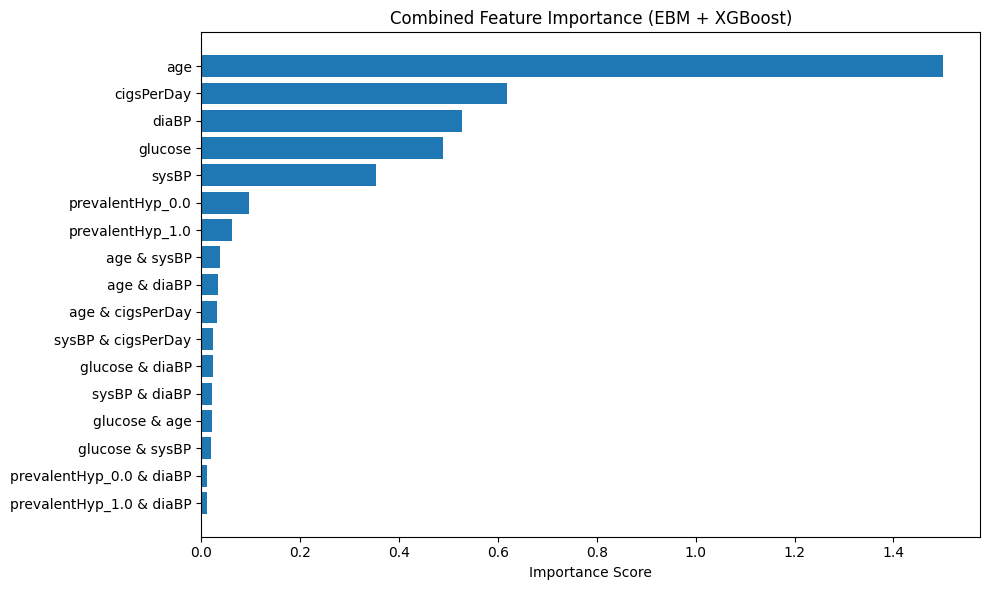


SHAP Summary Plot for XGBoost:


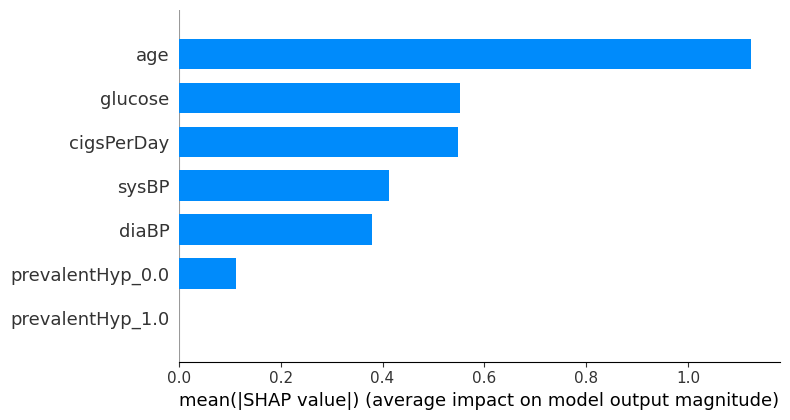

In [104]:
# Step 1: Extract Feature Importance from EBM
ebm_global_fsh = ebm_fsh.explain_global()
show(ebm_global_fsh)
show(ebm_fsh.explain_local(X_test_fsh_2[:5], y_test[:5]), 0)
ebm_importance_fsh = {
    feature: score for feature, score in zip(
        ebm_global_fsh.feature_names, ebm_global_fsh.data()["scores"]
    )
}

# Step 2: Extract Feature Importance from XGBoost using SHAP
explainer_xgb_fsh = shap.TreeExplainer(xgb_fsh)
shap_values_xgb_fsh = explainer_xgb_fsh.shap_values(X_test_fsh_2)

# Calculate mean absolute SHAP values as feature importance for XGBoost
xgb_importance_fsh = {
    feature: abs(shap_values_xgb_fsh[:, idx]).mean()
    for idx, feature in enumerate(X_test_fsh_2.columns)
}

# Step 3: Combine Feature Importances
# Use ensemble weights already defined in your code (e.g., [0.7, 0.3])
ensemble_weights_fsh = {"EBM": 0.7, "XGBoost": 0.3}
combined_importance_fsh = {}

for feature in set(ebm_importance_fsh.keys()).union(xgb_importance_fsh.keys()):
    ebm_score_fsh = ebm_importance_fsh.get(feature, 0)  # Default to 0 if feature is not in EBM
    xgb_score_fsh = xgb_importance_fsh.get(feature, 0)  # Default to 0 if feature is not in XGBoost
    combined_importance_fsh[feature] = (
        ensemble_weights_fsh["EBM"] * ebm_score_fsh +
        ensemble_weights_fsh["XGBoost"] * xgb_score_fsh
    )

# Step 4: Sort Combined Importances
sorted_importance_fsh = sorted(combined_importance_fsh.items(), key=lambda x: x[1], reverse=True)

# Display Combined Feature Importance
print("\nCombined Feature Importance (EBM + XGBoost):")
for i, (feature, importance) in enumerate(sorted_importance_fsh):
    print(f"{i + 1}. {feature}: {importance:.4f}")

# Prepare data for plotting
features_fsh = [item[0] for item in sorted_importance_fsh]
importance_scores_fsh = [item[1] for item in sorted_importance_fsh]

# Plot
plt.figure(figsize=(10, 6))
plt.barh(features_fsh[::-1], importance_scores_fsh[::-1])  # Reverse for descending order
plt.xlabel("Importance Score")
plt.title("Combined Feature Importance (EBM + XGBoost)")
plt.tight_layout()
plt.show()

# SHAP Summary Plot for XGBoost
print("\nSHAP Summary Plot for XGBoost:")
shap.summary_plot(shap_values_xgb_fsh, X_test_fsh_2, plot_type="bar")

Reducing background data for SHAP Kernel Explainer...

Initializing SHAP Kernel Explainer for the Ensemble...

Calculating SHAP Values for the Ensemble...


  0%|          | 0/1439 [00:00<?, ?it/s]

Shape of shap_values_ensemble_fsh: (1439, 7, 2)
Shape of X_test_fsh_2: (1439, 7)
Shape of shap_values_binary_fsh: (1439, 7)

Generating SHAP Summary Plot for the Ensemble...


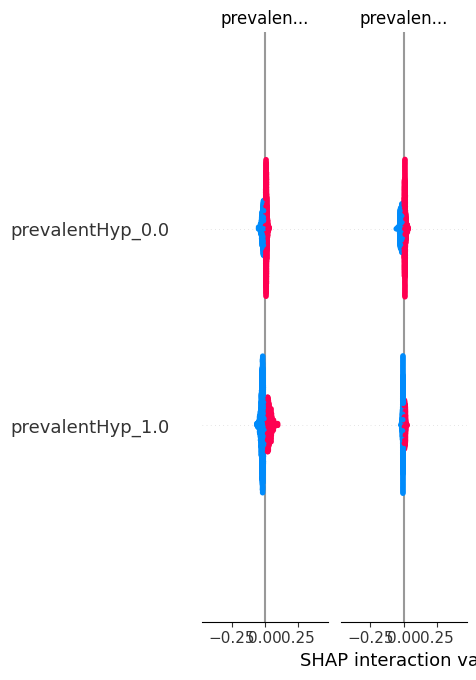


Generating Local Explanation for Sample Index 5...


In [105]:
# Initialize SHAP JavaScript visualizations
shap.initjs()

# Reduce the background data to speed up SHAP computations
print("Reducing background data for SHAP Kernel Explainer...")
background_data_fsh = shap.sample(X_test_fsh_2, 100)  # Use 100 samples for efficiency

# Step 1: Initialize SHAP Kernel Explainer
print("\nInitializing SHAP Kernel Explainer for the Ensemble...")
ensemble_explainer_fsh = shap.KernelExplainer(ensemble_fsh.predict_proba, background_data_fsh)

# Step 2: Calculate SHAP Values for the Test Set
print("\nCalculating SHAP Values for the Ensemble...")
shap_values_ensemble_fsh = ensemble_explainer_fsh.shap_values(X_test_fsh_2, nsamples=100)

# Debug: Check the shape of SHAP values and feature matrix
print(f"Shape of shap_values_ensemble_fsh: {np.array(shap_values_ensemble_fsh).shape}")
print(f"Shape of X_test_fsh_2: {X_test_fsh_2.shape}")

# Step 3: For Binary Classification (Extract SHAP Values for Positive Class)
# Extract SHAP values for the positive class (class 1)
if isinstance(shap_values_ensemble_fsh, list):  # SHAP returns a list of arrays for multiclass
    shap_values_binary_fsh = shap_values_ensemble_fsh[1]  # Positive class SHAP values
else:  # For binary classification, SHAP values are directly 2D
    shap_values_binary_fsh = shap_values_ensemble_fsh[:, :, 1]  # Extract positive class

# Debug: Validate Shapes
print(f"Shape of shap_values_binary_fsh: {shap_values_binary_fsh.shape}")
assert shap_values_binary_fsh.shape == X_test_fsh_2.shape, "Mismatch between SHAP values and feature matrix!"

# Step 4: Generate Summary Plot for the Binary Classifier
print("\nGenerating SHAP Summary Plot for the Ensemble...")
shap.summary_plot(
    shap_values_ensemble_fsh,
    X_test_fsh_2,
    feature_names=X_test_fsh_2.columns,
    show=True
)

# Step 5: Local Explanations for a Specific Instance
sample_idx_fsh = 5  # Select a sample index for local explanations
print(f"\nGenerating Local Explanation for Sample Index {sample_idx_fsh}...")

shap.force_plot(
    ensemble_explainer_fsh.expected_value[1],  # Expected value for the positive class
    shap_values_binary_fsh[sample_idx_fsh],
    X_test_fsh_2.iloc[sample_idx_fsh],
    feature_names=X_test_fsh_2.columns
)

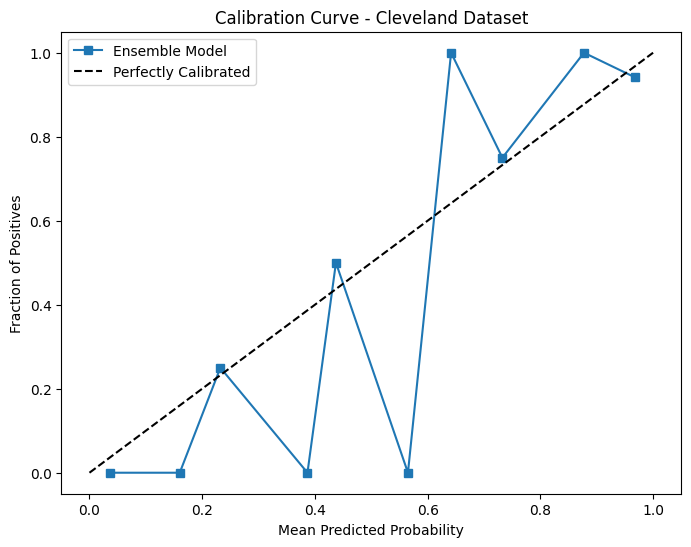

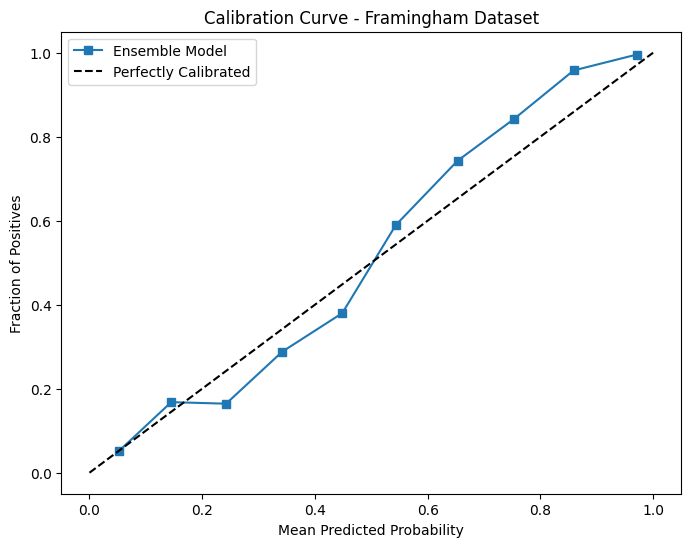

In [106]:
from sklearn.calibration import calibration_curve

# Calibration Metrics for Cleveland Dataset
y_prob = ensemble.predict_proba(X_test_2)[:, 1]  # Predicted probabilities from the ensemble model
fraction_of_positives, mean_predicted_value = calibration_curve(y_test_2, y_prob, n_bins=10, strategy='uniform')

plt.figure(figsize=(8, 6))
plt.plot(mean_predicted_value, fraction_of_positives, "s-", label="Ensemble Model")
plt.plot([0, 1], [0, 1], "k--", label="Perfectly Calibrated")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.title("Calibration Curve - Cleveland Dataset")
plt.legend()
plt.show()

# Calibration Metrics for Framingham Dataset
y_prob_fsh = ensemble_fsh.predict_proba(X_test_fsh_2)[:, 1]  # Predicted probabilities from the ensemble model
fraction_of_positives_fsh, mean_predicted_value_fsh = calibration_curve(y_test_fsh_2, y_prob_fsh, n_bins=10, strategy='uniform')

plt.figure(figsize=(8, 6))
plt.plot(mean_predicted_value_fsh, fraction_of_positives_fsh, "s-", label="Ensemble Model")
plt.plot([0, 1], [0, 1], "k--", label="Perfectly Calibrated")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.title("Calibration Curve - Framingham Dataset")
plt.legend()
plt.show()


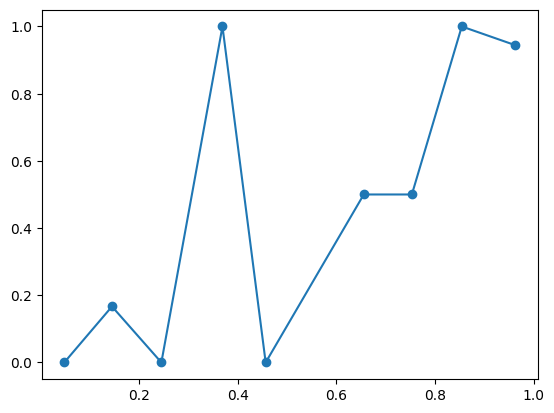

In [107]:
# Calibration Curve for EBM - Cleveland Dataset
y_prob_ebm = ebm.predict_proba(X_test_2)[:, 1]
fraction_of_positives_ebm, mean_predicted_value_ebm = calibration_curve(
    y_test_2, y_prob_ebm, n_bins=10, strategy='uniform'
)

plt.plot(mean_predicted_value_ebm, fraction_of_positives_ebm, "o-", label="EBM")


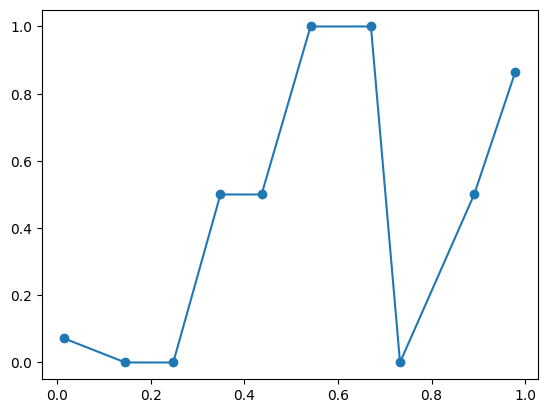

In [108]:
# Calibration Curve for XGBoost - Cleveland Dataset
y_prob_xgb = xgb.predict_proba(X_test_2)[:, 1]
fraction_of_positives_xgb, mean_predicted_value_xgb = calibration_curve(
    y_test_2, y_prob_xgb, n_bins=10, strategy='uniform'
)

plt.plot(mean_predicted_value_xgb, fraction_of_positives_xgb, "o-", label="XGBoost")


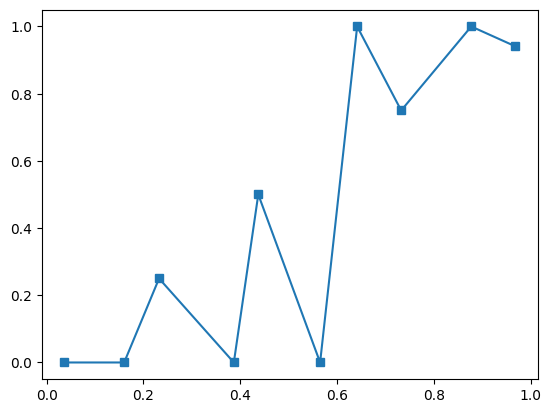

In [109]:
# Calibration Curve for Ensemble - Cleveland Dataset
y_prob_ensemble = ensemble.predict_proba(X_test_2)[:, 1]
fraction_of_positives_ensemble, mean_predicted_value_ensemble = calibration_curve(
    y_test_2, y_prob_ensemble, n_bins=10, strategy='uniform'
)

plt.plot(mean_predicted_value_ensemble, fraction_of_positives_ensemble, "s-", label="Ensemble")


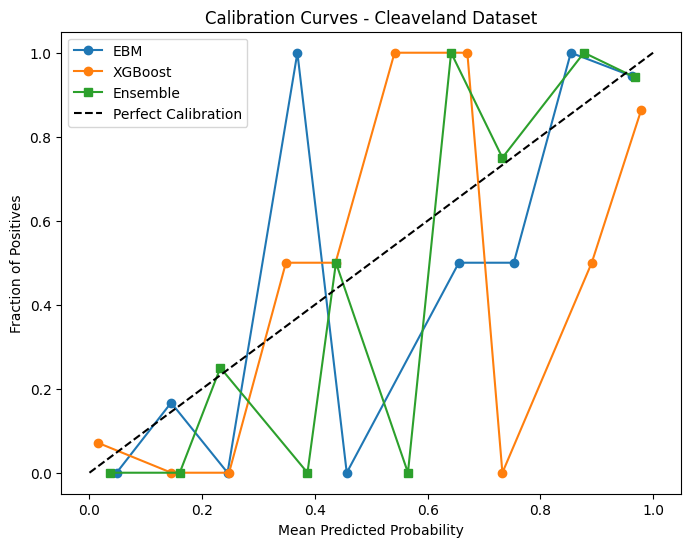

In [110]:
plt.figure(figsize=(8, 6))
plt.plot(mean_predicted_value_ebm, fraction_of_positives_ebm, "o-", label="EBM")
plt.plot(mean_predicted_value_xgb, fraction_of_positives_xgb, "o-", label="XGBoost")
plt.plot(mean_predicted_value_ensemble, fraction_of_positives_ensemble, "s-", label="Ensemble")
plt.plot([0, 1], [0, 1], "k--", label="Perfect Calibration")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.title("Calibration Curves - Cleaveland Dataset")
plt.legend()
plt.show()



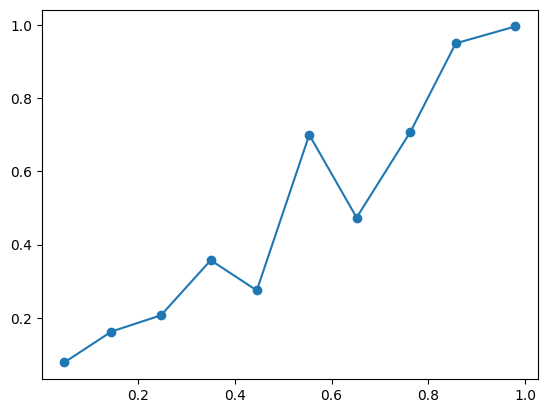

In [111]:
# Calibration Curves for Framingham Dataset
y_prob_ebm_fsh = ebm_fsh.predict_proba(X_test_fsh_2)[:, 1]
fraction_of_positives_ebm_fsh, mean_predicted_value_ebm_fsh = calibration_curve(
    y_test_fsh_2, y_prob_ebm_fsh, n_bins=10, strategy='uniform'
)
plt.plot(mean_predicted_value_ebm_fsh, fraction_of_positives_ebm_fsh, "o-", label="EBM")

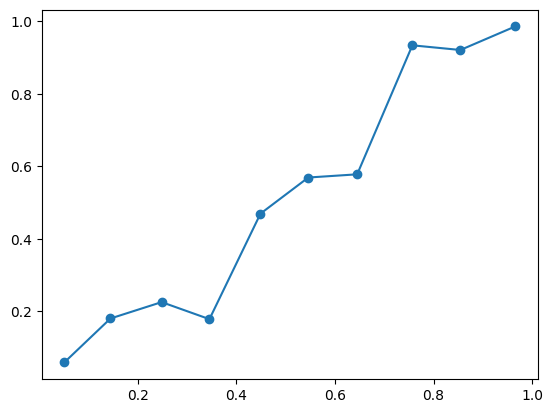

In [112]:
y_prob_xgb_fsh = xgb_fsh.predict_proba(X_test_fsh_2)[:, 1]
fraction_of_positives_xgb_fsh, mean_predicted_value_xgb_fsh = calibration_curve(
    y_test_fsh_2, y_prob_xgb_fsh, n_bins=10, strategy='uniform'
)
plt.plot(mean_predicted_value_xgb_fsh, fraction_of_positives_xgb_fsh, "o-", label="XGBoost")

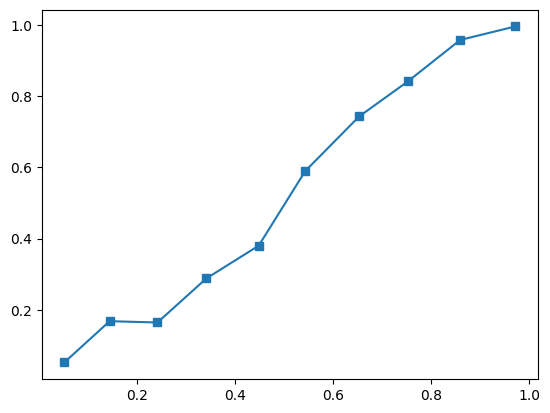

In [113]:
y_prob_ensemble_fsh = ensemble_fsh.predict_proba(X_test_fsh_2)[:, 1]
fraction_of_positives_ensemble_fsh, mean_predicted_value_ensemble_fsh = calibration_curve(
    y_test_fsh_2, y_prob_ensemble_fsh, n_bins=10, strategy='uniform'
)
plt.plot(mean_predicted_value_ensemble_fsh, fraction_of_positives_ensemble_fsh, "s-", label="Ensemble")

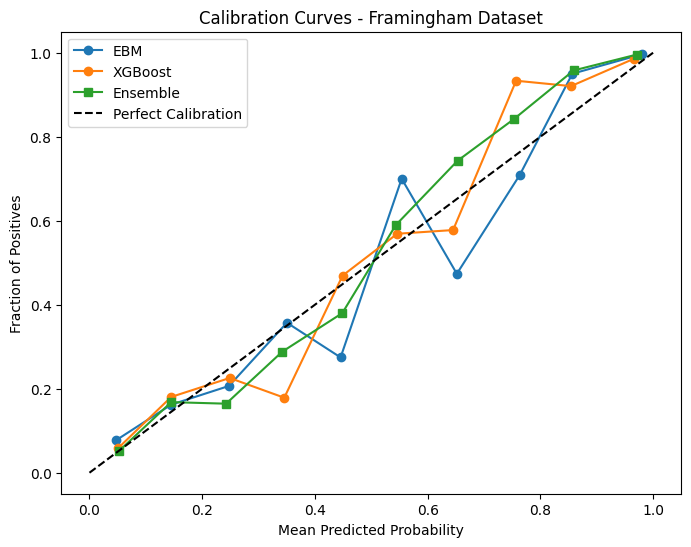

In [114]:
plt.figure(figsize=(8, 6))
plt.plot(mean_predicted_value_ebm_fsh, fraction_of_positives_ebm_fsh, "o-", label="EBM")
plt.plot(mean_predicted_value_xgb_fsh, fraction_of_positives_xgb_fsh, "o-", label="XGBoost")
plt.plot(mean_predicted_value_ensemble_fsh, fraction_of_positives_ensemble_fsh, "s-", label="Ensemble")
plt.plot([0, 1], [0, 1], "k--", label="Perfect Calibration")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.title("Calibration Curves - Framingham Dataset")
plt.legend()
plt.show()


In [115]:
from sklearn.metrics import r2_score
fidelity_score_ebm = r2_score(ebm.predict(X_test), shap_values.sum(axis=1))
print("Fidelity Score:", fidelity_score)

NameError: name 'fidelity_score' is not defined

#7. SHAP Explainability and extraction of features using SHAP
7.1 Cleveland Dataset

In [ ]:
# Compute SHAP values
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_resampled)

# SHAP summary plot
shap.summary_plot(shap_values, X_resampled)

# Top N features
if shap_values.ndim > 2:
    shap_values = shap_values[:, :, 0]
top_features = X_resampled.columns[shap_values.mean(axis=0).argsort()[::-1][:10]]
X_resampled_selected = X_resampled[top_features]
X_test_selected = X_test[top_features]

print("Top Features Selected:", top_features)

7.2 Framingham Heart Study Dataset

In [ ]:
# Compute SHAP values
explainer_fsh = shap.TreeExplainer(xgb_fsh)
shap_values_fsh = explainer_fsh.shap_values(X_resampled_fsh)

# SHAP summary plot
shap.summary_plot(shap_values_fsh, X_resampled_fsh)

# Top N features
if shap_values_fsh.ndim > 2:
    shap_values_fsh = shap_values_fsh[:, :, 0]
top_features_fsh = X_resampled_fsh.columns[shap_values_fsh.mean(axis=0).argsort()[::-1][:10]]
X_resampled_selected_fsh = X_resampled_fsh[top_features_fsh]
X_test_selected_fsh = X_test_fsh[top_features_fsh]

print("Top Features Selected:", top_features_fsh)

#9. Ensemble K-Fold Cross Validation
9.1 Cleaveland Dataset

In [ ]:
from sklearn.metrics import make_scorer, recall_score, precision_score, f1_score, accuracy_score
from statistics import stdev

# Define scoring functions with valid 'average' parameters for multiclass data
recall_scorer = make_scorer(recall_score, average='weighted')
precision_scorer = make_scorer(precision_score, average='weighted')
f1_scorer = make_scorer(f1_score, average='weighted')

# Define k-fold cross-validation
kf_recall = cross_val_score(ensemble, X_resampled_selected, y_resampled, cv=5, scoring=recall_scorer)
kf_accuracy = cross_val_score(ensemble, X_resampled_selected, y_resampled, cv=5, scoring='accuracy')  # accuracy doesn't need average
kf_precision = cross_val_score(ensemble, X_resampled_selected, y_resampled, cv=5, scoring=precision_scorer)
kf_f1 = cross_val_score(ensemble, X_resampled_selected, y_resampled, cv=5, scoring=f1_scorer)

# Create a DataFrame to compare metrics
metrics_comparison_kf = pd.DataFrame({
    "Metric": ["Cross Validation Scores", "Average Cross Validation Score", "Cross Validation Standard Deviation"],
    "Accuracy": [kf_accuracy.tolist(), kf_accuracy.mean(), stdev(kf_accuracy)],
    "Precision": [kf_precision.tolist(), kf_precision.mean(), stdev(kf_precision)],
    "Recall": [kf_recall.tolist(), kf_recall.mean(), stdev(kf_recall)],
    "F1 Score": [kf_f1.tolist(), kf_f1.mean(), stdev(kf_f1)]
})

# Display comparison table
print(metrics_comparison_kf)

# Define k-fold cross-validation for manual ensemble
kf = KFold(n_splits=5, shuffle=True, random_state=42)
ensemble_accuracies = []
ensemble_precision = []
ensemble_recall = []
ensemble_f1 = []

for train_index, test_index in kf.split(X_resampled_selected):
    # Split the data
    X_train_fold, X_test_fold = X_resampled_selected.iloc[train_index], X_resampled_selected.iloc[test_index]
    y_train_fold, y_test_fold = y_resampled.iloc[train_index], y_resampled.iloc[test_index]

    # Train models on the fold
    ebm.fit(X_train_fold, y_train_fold)
    xgb.fit(X_train_fold, y_train_fold)

    # Generate probabilities for the fold
    ebm_probs_fold = ebm.predict_proba(X_test_fold)
    xgb_probs_fold = xgb.predict_proba(X_test_fold)

    # Combine predictions
    ensemble_probs_fold = (0.7 * ebm_probs_fold) + (0.3 * xgb_probs_fold)
    ensemble_preds_fold = np.argmax(ensemble_probs_fold, axis=1)

    # Evaluate accuracy for the fold
    fold_accuracy = accuracy_score(y_test_fold, ensemble_preds_fold)
    fold_precision = precision_score(y_test_fold, ensemble_preds_fold, average='weighted')
    fold_recall = recall_score(y_test_fold, ensemble_preds_fold, average='weighted')
    fold_f1 = f1_score(y_test_fold, ensemble_preds_fold, average='weighted')
    ensemble_accuracies.append(fold_accuracy)
    ensemble_precision.append(fold_precision)
    ensemble_recall.append(fold_recall)
    ensemble_f1.append(fold_f1)

# Create a DataFrame to compare metrics
metrics_comparison_kf_manual = pd.DataFrame({
    "Metric": ["Cross Validation Scores", "Average Cross Validation Score", "Cross Validation Standard Deviation"],
    "Accuracy": [ensemble_accuracies, ensemble_accuracies.mean(), stdev(ensemble_accuracies)],
    "Precision": [ensemble_precision, ensemble_precision.mean(), stdev(ensemble_precision)],
    "Recall": [ensemble_recall, ensemble_recall.mean(), stdev(ensemble_recall)],
    "F1 Score": [ensemble_f1, ensemble_f1.mean(), stdev(ensemble_f1)]
})

# Display comparison table
print(metrics_comparison_kf_manual)


9.2 Framingham Heart Study Dataset

In [ ]:
# Define k-fold cross-validation
kf_recall_fsh = cross_val_score(ensemble_fsh, X_resampled_selected_fsh, y_resampled_fsh, cv=5, scoring='recall')
kf_accuracy_fsh = cross_val_score(ensemble_fsh, X_resampled_selected_fsh, y_resampled_fsh, cv=5, scoring='accuracy')
kf_precision_fsh = cross_val_score(ensemble_fsh, X_resampled_selected_fsh, y_resampled_fsh, cv=5, scoring='precision')
kf_f1_fsh = cross_val_score(ensemble_fsh, X_resampled_selected_fsh, y_resampled_fsh, cv=5, scoring='f1')

# Create a DataFrame to compare metrics
metrics_comparison_kf_fsh = pd.DataFrame({
    "Metric": ["Cross Validation Scores", "Average Cross Validation score", "Cross Validation standard deviation"],
    "Accuracy": [kf_accuracy_fsh, kf_accuracy_fsh.mean(), stdev(kf_accuracy_fsh)],
    "Precision": [kf_precision_fsh, kf_precision_fsh.mean(), stdev(kf_precision_fsh)],
    "Recall": [kf_recall_fsh, kf_recall_fsh.mean(), stdev(kf_recall_fsh)],
    "F1 Score": [kf_f1_fsh, kf_f1_fsh.mean(), stdev(kf_f1_fsh)]
})

# Display comparison table
print(metrics_comparison_kf_fsh)

# Define k-fold cross-validation for manual ensemble
kf_fsh = KFold(n_splits=5, shuffle=True, random_state=42)
ensemble_accuracies_fsh = []
ensemble_precision_fsh = []
ensemble_recall_fsh = []
ensemble_f1_fsh = []

for train_index, test_index in kf.split(X_resampled_selected_fsh):
    # Split the data
    X_train_fold_fsh, X_test_fold_fsh = X_resampled_selected_fsh.iloc[train_index], X_resampled_selected_fsh.iloc[test_index]
    y_train_fold_fsh, y_test_fold_fsh = y_resampled_fsh.iloc[train_index], y_resampled_fsh.iloc[test_index]

    # Train models on the fold
    ebm.fit(X_train_fold_fsh, y_train_fold_fsh)
    xgb.fit(X_train_fold_fsh, y_train_fold_fsh)

    # Generate probabilities for the fold
    ebm_probs_fold_fsh = ebm_fsh.predict_proba(X_test_fold_fsh)
    xgb_probs_fold_fsh = xgb_fsh.predict_proba(X_test_fold_fsh)

    # Combine predictions
    ensemble_probs_fold_fsh = (0.7 * ebm_probs_fold_fsh) + (0.3 * xgb_probs_fold_fsh)
    ensemble_preds_fold_fsh = np.argmax(ensemble_probs_fold_fsh, axis=1)

    # Evaluate accuracy for the fold
    fold_accuracy_fsh = accuracy_score(y_test_fold_fsh, ensemble_preds_fold_fsh)
    fold_precision_fsh = precision_score(y_test_fold_fsh, ensemble_preds_fold_fsh, average='weighted')
    fold_recall_fsh = recall_score(y_test_fold_fsh, ensemble_preds_fold_fsh, average='weighted')
    fold_f1_fsh = f1_score(y_test_fold_fsh, ensemble_preds_fold_fsh, average='weighted')
    ensemble_accuracies_fsh.append(fold_accuracy_fsh)
    ensemble_precision_fsh.append(fold_precision_fsh)
    ensemble_recall_fsh.append(fold_recall_fsh)
    ensemble_f1_fsh.append(fold_f1_fsh)

# Create a DataFrame to compare metrics
metrics_comparison_kf_manual_fsh = pd.DataFrame({
    "Metric": ["Cross Validation Scores", "Average Cross Validation Score", "Cross Validation Standard Deviation"],
    "Accuracy": [ensemble_accuracies_fsh, ensemble_accuracies_fsh.mean(), stdev(ensemble_accuracies_fsh)],
    "Precision": [ensemble_precision_fsh, ensemble_precision_fsh.mean(), stdev(ensemble_precision_fsh)],
    "Recall": [ensemble_recall_fsh, ensemble_recall_fsh.mean(), stdev(ensemble_recall_fsh)],
    "F1 Score": [ensemble_f1_fsh, ensemble_f1_fsh.mean(), stdev(ensemble_f1_fsh)]
})

# Display comparison table
print(metrics_comparison_kf_manual_fsh)


#10. Global Feature Importance for EBM Model
10.1 Cleaveland Dataset

In [ ]:
shap.initjs()  # Initialize SHAP JavaScript visualizations

# Global feature importance from EBM
ebm_global = ebm.explain_global()
show(ebm_global)

# Local SHAP explanations for individual predictions
shap.force_plot(explainer.expected_value[1], shap_values[0], X_resampled.iloc[0])
shap.force_plot(explainer.expected_value[2], shap_values[0], X_resampled.iloc[0])
shap.force_plot(explainer.expected_value[3], shap_values[0], X_resampled.iloc[0])
shap.force_plot(explainer.expected_value[4], shap_values[0], X_resampled.iloc[0])


# Number of classes in the dataset
num_classes = ensemble_probs.shape[1]

# Plot calibration curves for all classes
plt.figure(figsize=(10, 8))

for class_idx in range(num_classes):
    # Get probabilities for the current class
    class_probs = ensemble_probs[:, class_idx]

    # Generate calibration curve
    prob_true, prob_pred = calibration_curve((y_test == class_idx).astype(int), class_probs, n_bins=10)

    # Plot the calibration curve for this class
    plt.plot(prob_pred, prob_true, marker='o', label=f"Class {class_idx}")

# Add reference line (perfect calibration)
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')

# Add plot details
plt.title("Calibration Curves for Multiclass Ensemble")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.legend(loc="best")
plt.show()

10.2 Framingham Heart Study Dataset

In [ ]:
# SHAP for EBM
shap.initjs()  # Initialize SHAP JavaScript visualizations
ebm_global_fsh = ebm_fsh.explain_global()
show(ebm_global_fsh)

# SHAP for XGBoost
explainer_fsh = shap.TreeExplainer(xgb_fsh)
shap_values_fsh = explainer_fsh.shap_values(X_resampled_selected_fsh)

# Local SHAP explanations for XGBoost
shap.force_plot(explainer_fsh.expected_value, shap_values_fsh[0], X_resampled_selected_fsh.iloc[0])

# SHAP Summary Plot for XGBoost
shap.summary_plot(shap_values_fsh, X_resampled_selected_fsh)

# Predict probabilities from ensemble
ensemble_probs_positive_class_fsh = ensemble_probs_fsh.predict_proba(X_test_selected_fsh)[:, 1]  # Probabilities for class 1

# Generate calibration curve
prob_true_fsh, prob_pred_fsh = calibration_curve(y_test_fsh, ensemble_probs_positive_class_fsh, n_bins=10)

# Plot calibration curve
plt.plot(prob_pred_fsh, prob_true_fsh, marker='o', label='Ensemble (Soft Voting)')
plt.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Perfectly Calibrated')  # Reference line
plt.title("Calibration Curve for Ensemble")
plt.xlabel("Mean Predicted Probability")
plt.ylabel("Fraction of Positives")
plt.legend()
plt.show()

#11. Hyperparmeter Tuning for XGBoost and EBM
11.1 Cleaveland Dataset

In [ ]:
# Define the parameter grid for XGBClassifier
param_grid_xgb = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1]
}

# Define the parameter grid for EBM
param_grid_ebm = {
    'learning_rate': [0.01, 0.05, 0.1],
    'max_bins': [128, 256],
    'min_samples_leaf': [1, 5, 10]
}

# Perform Grid Search for XGBoost
grid_search_x = GridSearchCV(estimator=xgb, param_grid=param_grid_xgb, cv=3, scoring='accuracy')
grid_search_x.fit(X_resampled_selected, y_resampled)

# Perform Grid Search for EBM
grid_search_e = GridSearchCV(estimator=ebm, param_grid=param_grid_ebm, cv=3, scoring='accuracy')
grid_search_e.fit(X_resampled_selected, y_resampled)

# Print the best parameters
print("Best Parameters for XGBoost:", grid_search_x.best_params_)
print("Best Parameters for EBM:", grid_search_e.best_params_)

# Use the best parameters in the ensemble
xgb_tuned = grid_search_x.best_estimator_
ebm_tuned = grid_search_e.best_estimator_


11.1.1 Retraining of ensemble model with tuned parameters

In [ ]:
# Predict probabilities
ebm_probs_tuned = ebm_tuned.predict_proba(X_test_selected)
xgb_probs_tuned = xgb_tuned.predict_proba(X_test_selected)

# Predict classess
ebm_preds_tuned = ebm_tuned.predict(X_test_selected)
xgb_preds_tuned = xgb_tuned.predict(X_test_selected)

# Weighted Soft-Voting ensemble for only xgb tuned
ensemble_tuned_1 = VotingClassifier(estimators=[('ebm', ebm), ('xgb', xgb_tuned)], voting='soft')
ensemble_tuned_1.fit(X_resampled_selected, y_resampled)
ensemble_preds_tuned_1 = ensemble_tuned_1.predict(X_test_selected)

# Weighted Soft-Voting ensemble for only ebm tuned
ensemble_tuned_2 = VotingClassifier(estimators=[('ebm', ebm_tuned), ('xgb', xgb)], voting='soft')
ensemble_tuned_2.fit(X_resampled_selected, y_resampled)
ensemble_preds_tuned_2 = ensemble_tuned_2.predict(X_test_selected)

# Weighted Soft-Voting ensemble for both xgb tuned and ebm tuned
ensemble_tuned_final = VotingClassifier(estimators=[('ebm', ebm_tuned), ('xgb', xgb_tuned)], voting='soft')
ensemble_tuned_final.fit(X_resampled_selected, y_resampled)
ensemble_preds_tuned_final = ensemble_tuned_final.predict(X_test_selected)

11.1.2 Validation of tuned base models

In [ ]:
# Convert ebm_preds to integer type
ebm_preds_tuned = ebm_preds.astype(float).astype(int)

# EBM Metrics
ebm_accuracy_tuned = accuracy_score(y_test_np, ebm_preds_tuned)
ebm_precision_tuned = precision_score(y_test_np, ebm_preds_tuned, average='weighted')
ebm_recall_tuned = recall_score(y_test_np, ebm_preds_tuned, average='weighted')
ebm_f1_tuned = f1_score(y_test_np, ebm_preds_tuned, average='weighted')

print("EBM Metrics:")
print(f"Accuracy: {ebm_accuracy_tuned}")
print(f"Precision: {ebm_precision_tuned}")
print(f"Recall: {ebm_recall_tuned}")
print(f"F1 Score: {ebm_f1_tuned}")
print("\nClassification Report for EBM:")
print(classification_report(y_test, ebm_preds_tuned))

# XGBoost Metrics
xgb_accuracy_tuned = accuracy_score(y_test_np, xgb_preds_tuned)
xgb_precision_tuned = precision_score(y_test_np, xgb_preds_tuned, average='weighted')
xgb_recall_tuned = recall_score(y_test_np, xgb_preds_tuned, average='weighted')
xgb_f1_tuned = f1_score(y_test_np, xgb_preds_tuned, average='weighted')

print("XGBoost Metrics:")
print(f"Accuracy: {xgb_accuracy_tuned}")
print(f"Precision: {xgb_precision_tuned}")
print(f"Recall: {xgb_recall_tuned}")
print(f"F1 Score: {xgb_f1_tuned}")
print("\nClassification Report for XGBoost:")
print(classification_report(y_test_np, xgb_preds_tuned))

11.1.3 Evaluating Tuned Ensemble Model Prediction Accuracies for Cleaveland Dataset

In [ ]:
# Evaluate the ensemble with only xgb tuned
accuracy_tuned_1 = accuracy_score(y_test, ensemble_preds_tuned_1)
precision_tuned_1 = precision_score(y_test, ensemble_preds_tuned_1, average='weighted')
recall_tuned_1 = recall_score(y_test, ensemble_preds_tuned_1, average='weighted')
f1_tuned_1 = f1_score(y_test, ensemble_preds_tuned_1, average='weighted')

print(f"Ensemble Accuracy: {accuracy_tuned_1}")
print(f"Ensemble Precision: {precision_tuned_1}")
print(f"Ensemble Recall: {recall_tuned_1}")
print(f"Ensemble F1-Score: {f1_tuned_1}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_tuned_1))

# Evaluate the ensemble with only ebm tuned
accuracy_tuned_2 = accuracy_score(y_test, ensemble_preds_tuned_2)
precision_tuned_2 = precision_score(y_test, ensemble_preds_tuned_2, average='weighted')
recall_tuned_2 = recall_score(y_test, ensemble_preds_tuned_2, average='weighted')
f1_tuned_2 = f1_score(y_test, ensemble_preds_tuned_2, average='weighted')

print(f"Ensemble Accuracy: {accuracy_tuned_2}")
print(f"Ensemble Precision: {precision_tuned_2}")
print(f"Ensemble Recall: {recall_tuned_2}")
print(f"Ensemble F1-Score: {f1_tuned_2}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_tuned_2))

# Evaluate the ensemble with both xgb and ebm tuned
accuracy_final = accuracy_score(y_test, ensemble_preds_tuned_final)
precision_final = precision_score(y_test, ensemble_preds_tuned_final, average='weighted')
recall_final = recall_score(y_test, ensemble_preds_tuned_final, average='weighted')
f1_final = f1_score(y_test, ensemble_preds_tuned_final, average='weighted')

print(f"Ensemble Accuracy: {accuracy_final}")
print(f"Ensemble Precision: {precision_final}")
print(f"Ensemble Recall: {recall_final}")
print(f"Ensemble F1-Score: {f1_final}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_tuned_final))

11.1.4 Comparing the metrics of individual base models (tuned and not tuned) and ensemble models (tuned and not tuned) for Cleaveland Dataset

In [ ]:
# Create a DataFrame to compare metrics
metrics_comparison_tuned = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "EBM": [ebm_accuracy, ebm_precision, ebm_recall, ebm_f1],
    "EBM - TUNED": [ebm_accuracy_tuned, ebm_precision_tuned, ebm_recall_tuned, ebm_f1_tuned],
    "XGBoost": [xgb_accuracy, xgb_precision, xgb_recall, xgb_f1],
    "XGBoost - TUNED": [xgb_accuracy_tuned, xgb_precision_tuned, xgb_recall_tuned, xgb_f1_tuned],
    "IELF": [accuracy, precision, recall, f1],
    "IELF - XGB TUNED ONLY": [accuracy_tuned_1, precision_tuned_1, recall_tuned_1, f1_tuned_1],
    "IELF - EBM TUNED ONLY": [accuracy_tuned_2, precision_tuned_2, recall_tuned_2, f1_tuned_2],
    "IELF - ALL BASE MODELS TUNED": [accuracy_final, precision_final, recall_final, f1_final]
})

# Display comparison table
print(metrics_comparison_tuned)

11.2 Framingham Heart Study Dataset

In [ ]:
# Perform Grid Search for XGBoost
grid_search_x_fsh = GridSearchCV(estimator=xgb_fsh, param_grid=param_grid_xgb, cv=3, scoring='accuracy')
grid_search_x_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)

# Perform Grid Search for EBM
grid_search_e_fsh = GridSearchCV(estimator=ebm_fsh, param_grid=param_grid_ebm, cv=3, scoring='accuracy')
grid_search_e_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)

# Print the best parameters
print("Best Parameters for XGBoost:", grid_search_x_fsh.best_params_)
print("Best Parameters for EBM:", grid_search_e_fsh.best_params_)

# Use the best parameters in the ensemble
xgb_tuned_fsh = grid_search_x_fsh.best_estimator_
ebm_tuned_fsh = grid_search_e_fsh.best_estimator_


11.2.1 Retraining of ensemble model with tuned parameters

In [ ]:
# Predict probabilities
ebm_probs_tuned_fsh = ebm_tuned_fsh.predict_proba(X_test_selected_fsh)
xgb_probs_tuned_fsh = xgb_tuned_fsh.predict_proba(X_test_selected_fsh)

# Predict classess
ebm_preds_tuned_fsh = ebm_tuned_fsh.predict(X_test_selected_fsh)
xgb_preds_tuned_fsh = xgb_tuned.predict(X_test_selected_fsh)

# Weighted Soft-Voting ensemble for only xgb tuned
ensemble_tuned_1_fsh = VotingClassifier(estimators=[('ebm', ebm_fsh), ('xgb', xgb_tuned_fsh)], voting='soft')
ensemble_tuned_1_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)
ensemble_preds_tuned_1_fsh = ensemble_tuned_1_fsh.predict(X_test_selected_fsh)

# Weighted Soft-Voting ensemble for only ebm tuned
ensemble_tuned_2_fsh = VotingClassifier(estimators=[('ebm', ebm_tuned_fsh), ('xgb', xgb_fsh)], voting='soft')
ensemble_tuned_2_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)
ensemble_preds_tuned_2_fsh = ensemble_tuned_2_fsh.predict(X_test_selected_fsh)

# Weighted Soft-Voting ensemble for both xgb tuned and ebm tuned
ensemble_tuned_final_fsh = VotingClassifier(estimators=[('ebm', ebm_tuned_fsh), ('xgb', xgb_tuned_fsh)], voting='soft')
ensemble_tuned_final_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)
ensemble_preds_tuned_final_fsh = ensemble_tuned_final_fsh.predict(X_test_selected_fsh)


11.2.2 Validation of tuned base models for Framnigham Heart Study Dataset



In [ ]:
# EBM Metrics
ebm_accuracy_tuned_fsh = accuracy_score(y_test_np, ebm_preds_tuned_fsh)
ebm_precision_tuned_fsh = precision_score(y_test_np, ebm_preds_tuned_fsh, average='weighted')
ebm_recall_tuned_fsh = recall_score(y_test_np, ebm_preds_tuned_fsh, average='weighted')
ebm_f1_tuned_fsh = f1_score(y_test_np, ebm_preds_tuned_fsh, average='weighted')

print("EBM Metrics:")
print(f"Accuracy: {ebm_accuracy_tuned_fsh}")
print(f"Precision: {ebm_precision_tuned_fsh}")
print(f"Recall: {ebm_recall_tuned_fsh}")
print(f"F1 Score: {ebm_f1_tuned_fsh}")
print("\nClassification Report for EBM:")
print(classification_report(y_test, ebm_preds_tuned_fsh))

# XGBoost Metrics
xgb_accuracy_tuned_fsh = accuracy_score(y_test_np, xgb_preds_tuned_fsh)
xgb_precision_tuned_fsh = precision_score(y_test_np, xgb_preds_tuned_fsh, average='weighted')
xgb_recall_tuned_fsh = recall_score(y_test_np, xgb_preds_tuned_fsh, average='weighted')
xgb_f1_tuned_fsh = f1_score(y_test_np, xgb_preds_tuned_fsh, average='weighted')

print("XGBoost Metrics:")
print(f"Accuracy: {xgb_accuracy_tuned_fsh}")
print(f"Precision: {xgb_precision_tuned_fsh}")
print(f"Recall: {xgb_recall_tuned_fsh}")
print(f"F1 Score: {xgb_f1_tuned_fsh}")
print("\nClassification Report for XGBoost:")
print(classification_report(y_test_np, xgb_preds_tuned_fsh))

11.2.3 Evaluating Tuned Ensemble Model Prediction Accuracies for Framingham Heart Study Dataset

In [ ]:
# Evaluate the ensemble with only xgb tuned
accuracy_tuned_1_fsh = accuracy_score(y_test, ensemble_preds_tuned_1_fsh)
precision_tuned_1_fsh = precision_score(y_test, ensemble_preds_tuned_1_fsh, average='weighted')
recall_tuned_1_fsh = recall_score(y_test, ensemble_preds_tuned_1_fsh, average='weighted')
f1_tuned_1_fsh = f1_score(y_test, ensemble_preds_tuned_1_fsh, average='weighted')

print(f"Ensemble Accuracy: {accuracy_tuned_1_fsh}")
print(f"Ensemble Precision: {precision_tuned_1_fsh}")
print(f"Ensemble Recall: {recall_tuned_1_fsh}")
print(f"Ensemble F1-Score: {f1_tuned_1_fsh}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_tuned_1_fsh))

# Evaluate the ensemble with only ebm tuned
accuracy_tuned_2_fsh = accuracy_score(y_test, ensemble_preds_tuned_2_fsh)
precision_tuned_2_fsh = precision_score(y_test, ensemble_preds_tuned_2_fsh, average='weighted')
recall_tuned_2_fsh = recall_score(y_test, ensemble_preds_tuned_2_fsh, average='weighted')
f1_tuned_2_fsh = f1_score(y_test, ensemble_preds_tuned_2_fsh, average='weighted')

print(f"Ensemble Accuracy: {accuracy_tuned_2_fsh}")
print(f"Ensemble Precision: {precision_tuned_2_fsh}")
print(f"Ensemble Recall: {recall_tuned_2_fsh}")
print(f"Ensemble F1-Score: {f1_tuned_2_fsh}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_tuned_2_fsh))

# Evaluate the ensemble with both xgb and ebm tuned
accuracy_final_fsh = accuracy_score(y_test, ensemble_preds_final_fsh)
precision_final_fsh = precision_score(y_test, ensemble_preds_final_fsh, average='weighted')
recall_final_fsh = recall_score(y_test, ensemble_preds_final_fsh, average='weighted')
f1_final_fsh = f1_score(y_test, ensemble_preds_final_fsh, average='weighted')

print(f"Ensemble Accuracy: {accuracy_final_fsh}")
print(f"Ensemble Precision: {precision_final_fsh}")
print(f"Ensemble Recall: {recall_final_fsh}")
print(f"Ensemble F1-Score: {f1_final_fsh}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds_final_fsh))

11.2.4 Comparing the metrics of individual base models (tuned and not tuned) and ensemble models (tuned and not tuned) for Framingham Heart Study Dataset

In [ ]:
# Create a DataFrame to compare metrics
metrics_comparison_tuned_fsh = pd.DataFrame({
    "Metric": ["Accuracy", "Precision", "Recall", "F1 Score"],
    "EBM": [ebm_accuracy_fsh, ebm_precision_fsh, ebm_recall_fsh, ebm_f1_fsh],
    "EBM - TUNED": [ebm_accuracy_tuned_fsh, ebm_precision_tuned_fsh, ebm_recall_tuned_fsh, ebm_f1_tuned_fsh],
    "XGBoost": [xgb_accuracy_fsh, xgb_precision_fsh, xgb_recall_fsh, xgb_f1_fsh],
    "XGBoost - TUNED": [xgb_accuracy_tuned_fsh, xgb_precision_tuned_fsh, xgb_recall_tuned_fsh, xgb_f1_tuned_fsh],
    "IELF": [accuracy_fsh, precision_fsh, recall_fsh, f1_fsh],
    "IELF - XGB TUNED ONLY": [accuracy_tuned_1_fsh, precision_tuned_1_fsh, recall_tuned_1_fsh, f1_tuned_1_fsh],
    "IELF - EBM TUNED ONLY": [accuracy_tuned_2_fsh, precision_tuned_2_fsh, recall_tuned_2_fsh, f1_tuned_2_fsh],
    "IELF - ALL BASE MODELS TUNED": [accuracy_final_fsh, precision_final_fsh, recall_final_fsh, f1_final_fsh]
})

# Display comparison table
print(metrics_comparison_tuned_fsh)

In [ ]:
# Train the tuned XGBoost model
xgb_tuned.fit(X_resampled_selected, y_resampled)

# Use the tuned model in the ensemble
ensemble_probs = (0.7 * ebm.predict_proba(X_test_selected)) + (0.3 * xgb_tuned.predict_proba(X_test_selected))
ensemble_preds = np.argmax(ensemble_probs, axis=1)

# Evaluate the ensemble
accuracy = accuracy_score(y_test, ensemble_preds)
precision = precision_score(y_test, ensemble_preds, average='weighted')
recall = recall_score(y_test, ensemble_preds, average='weighted')
f1 = f1_score(y_test, ensemble_preds, average='weighted')

print(f"Ensemble Accuracy: {accuracy}")
print(f"Ensemble Precision: {precision}")
print(f"Ensemble Recall: {recall}")
print(f"Ensemble F1-Score: {f1}")

# Detailed classification report
print(classification_report(y_test, ensemble_preds))

# Define k-fold cross-validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
ensemble_accuracies = []

for train_index, test_index in kf.split(X_resampled_selected):
    # Split the data
    X_train_fold, X_test_fold = X_resampled_selected.iloc[train_index], X_resampled_selected.iloc[test_index]
    y_train_fold, y_test_fold = y_resampled.iloc[train_index], y_resampled.iloc[test_index]

    # Train models on the fold
    ebm.fit(X_train_fold, y_train_fold)
    xgb.fit(X_train_fold, y_train_fold)

    # Generate probabilities for the fold
    ebm_probs_fold = ebm.predict_proba(X_test_fold)
    xgb_probs_fold = xgb_tuned.predict_proba(X_test_fold)

    # Combine predictions
    ensemble_probs_fold = (0.7 * ebm_probs_fold) + (0.3 * xgb_probs_fold)
    ensemble_preds_fold = np.argmax(ensemble_probs_fold, axis=1)

    # Evaluate accuracy for the fold
    fold_accuracy = accuracy_score(y_test_fold, ensemble_preds_fold)
    ensemble_accuracies.append(fold_accuracy)

print(f"Ensemble Cross-Validation Accuracy: {np.mean(ensemble_accuracies)}")

11.2 Framingham Heart Study Dataset

1.2 Cleveland Dataset

In [ ]:
# # Fetch dataset
# heart_disease = fetch_ucirepo(id=45)

# # Data (as pandas dataframes)
# X = heart_disease.data.features
# y = heart_disease.data.targets

# # Metadata
# print(heart_disease.metadata)

# # Variable information
# print(heart_disease.variables)

# # Access the complete dataset table
# complete_data = heart_disease.data.original
# X = complete_data.drop('num', axis=1)
# y = complete_data['num']

# # Missing data summary
# missing_data_summary = complete_data.isnull().sum().reset_index()
# missing_data_summary.columns = ['Column', 'Missing Values']
# missing_data_summary['Percentage Missing'] = (
#     missing_data_summary['Missing Values'] / len(complete_data) * 100
# )

# print("Summary of Missing Data:")
# print(missing_data_summary)

# complete_data.head()
# print("\nTotal Number of Rows and Columns:")
# print(f"Rows: {complete_data.shape[0]}, Columns: {complete_data.shape[1]}")

#2. Class Distribution and Visualization
2.1 Framingham Dataset

In [ ]:
# # Class distribution
# class_distribution_fsh = fsh_dataset['TenYearCHD'].value_counts()
# print("Class Distribution:\n", class_distribution_fsh)

# # Visualization
# class_distribution_fsh.plot(kind='bar')
# plt.title("Class Distribution")
# plt.xlabel("Class")
# plt.ylabel("Count")
# plt.show()

2.2 Cleveland Dataset

In [ ]:
# # Class distribution
# class_distribution_clv = complete_data['num'].value_counts()
# print("Class Distribution:\n", class_distribution_clv)

# # Visualization
# class_distribution_clv.plot(kind='bar')
# plt.title("Class Distribution")
# plt.xlabel("Class")
# plt.ylabel("Count")
# plt.show()

#3. Correlation Analysis
3.1 Framingham Dataset

In [ ]:
# # Correlation matrix
# fsh_correlation_matrix = fsh_dataset.corr()

# # Heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(fsh_correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
# plt.title("Correlation Matrix - FSH Dataset")
# plt.show()

# numerical_columns_fsh = ['totChol', 'age', 'sysBP', 'cigsPerDay', 'BMI', 'heartRate', 'glucose', 'diaBP']
# correlations_fsh = fsh_dataset[numerical_columns_fsh + ['TenYearCHD']].corr()
# target_corr_fsh = correlations_fsh['TenYearCHD'].sort_values(ascending=False)
# print("Correlation with target (TenYearCHD) - FSH Dataset:\n", target_corr_fsh)

# # Scatter plots
# for column in numerical_columns_fsh:
#     sns.scatterplot(x=fsh_dataset[column], y=fsh_dataset['TenYearCHD'])
#     plt.title(f"{column} vs Target (TenYearCHD)")
#     plt.show()

3.2 Cleveland Dataset

In [ ]:
# # Correlation matrix
# correlation_matrix = complete_data.corr()

# # Heatmap
# plt.figure(figsize=(10, 8))
# sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
# plt.title("Correlation Matrix - Cleveland Dataset")
# plt.show()

# numerical_columns = ['chol', 'age', 'trestbps', 'thalach', 'ca', 'oldpeak']
# correlations = complete_data[numerical_columns + ['num']].corr()
# target_corr = correlations['num'].sort_values(ascending=False)
# print("Correlation with target (num) - Cleveland Dataset:\n", target_corr)

#4. Feature Selection (Chi-Square Tests)
4.1 Framingham Dataset

In [ ]:
# # Label encode categorical columns
# categorical_columns_fsh = ['sex', 'currentSmoker', 'diabetes', 'BPMeds', 'prevalentHyp', 'prevalentStroke']
# for column in categorical_columns_fsh:
#     fsh_dataset[column] = LabelEncoder().fit_transform(fsh_dataset[column])

# chi2_values_fsh, p_values_fsh = chi2(fsh_dataset[categorical_columns_fsh], fsh_dataset['TenYearCHD'])
# chi2_results_fsh = pd.DataFrame({'Feature': categorical_columns_fsh, 'Chi2': chi2_values_fsh, 'p-value': p_values_fsh})
# print(chi2_results_fsh.sort_values(by='Chi2', ascending=False))

4.2 Cleveland Dataset

In [ ]:
# # Label encode categorical columns
# categorical_columns = ['sex', 'cp', 'fbs', 'restecg', 'exang', 'slope', 'thal']
# for column in categorical_columns:
#     complete_data[column] = LabelEncoder().fit_transform(complete_data[column])

# chi2_values, p_values = chi2(complete_data[categorical_columns], complete_data['num'])
# chi2_results = pd.DataFrame({'Feature': categorical_columns, 'Chi2': chi2_values, 'p-value': p_values})
# print(chi2_results.sort_values(by='Chi2', ascending=False))

5. Data Imputation

In [ ]:
# # Iterative imputation for Cleveland
# mice_imputer = IterativeImputer(random_state=42)
# complete_data_imputed = pd.DataFrame(mice_imputer.fit_transform(complete_data), columns=complete_data.columns)
# X_imputed = complete_data_imputed.drop('num', axis=1)
# y_imputed = complete_data_imputed['num']

# # Iterative imputation for Framingham
# mice_imputer_fsh = IterativeImputer(random_state=42)
# fsh_dataset_imputed = pd.DataFrame(mice_imputer_fsh.fit_transform(fsh_dataset), columns=fsh_dataset.columns)
# X_fsh_imputed = fsh_dataset_imputed.drop('TenYearCHD', axis=1)
# y_fsh_imputed = fsh_dataset_imputed['TenYearCHD']

# # Check for missing values
# missing_data_summary = complete_data_imputed.isnull().sum().reset_index()
# missing_data_summary.columns = ['Column', 'Missing Values']
# print(missing_data_summary)

# missing_data_summary_fsh = fsh_dataset_imputed.isnull().sum().reset_index()
# missing_data_summary_fsh.columns = ['Column', 'Missing Values']
# print(missing_data_summary_fsh)

#6. Data Resampling
6.1 SMOTE for Framingham

In [ ]:
# smote = SMOTE(random_state=42)
# X_resampled_fsh, y_resampled_fsh = smote.fit_resample(X_fsh_imputed, y_fsh_imputed)
# print("Class Distribution after SMOTE (Framingham):", Counter(y_resampled_fsh))

6.2 SMOTETomek for Cleveland

In [ ]:
# smote_tomek = SMOTETomek(random_state=42)
# X_resampled, y_resampled = smote_tomek.fit_resample(X_imputed, y_imputed)
# print("Class Distribution after SMOTETomek (Cleveland):", Counter(y_resampled))

#7. Exploratory Visualizations
7.1 Class Distribution Before and After Resampling (Cleveland Dataset)


In [ ]:
# # Combine original and resampled data for visualization
# original_df = pd.DataFrame({'Class': y, 'Distribution': 'Before SMOTE'})
# resampled_df = pd.DataFrame({'Class': y_resampled, 'Distribution': 'After SMOTE'})
# combined_df = pd.concat([original_df, resampled_df])

# # Plot
# plt.figure(figsize=(10, 6))
# sns.countplot(x='Class', hue='Distribution', data=combined_df)
# plt.title("Class Distribution Before and After SMOTE - Cleveland Dataset")
# plt.xlabel("Classes")
# plt.ylabel("Frequency")
# plt.show()

Correlation measures the linear relationship between numerical variables. A correlation value close to 0 indicates a weak linear relationship, while values closer to -1 or 1 indicate a strong relationship.

Rule of Thumb:

Correlation > |0.7|: Strong relationship.
Correlation < |0.3|: Weak relationship.

7.2 Class Distribution Before and After Resampling (Framingham Dataset)

In [ ]:
# # Combine original and resampled data for visualization
# original_df_fsh = pd.DataFrame({'Class': y_fsh, 'Distribution': 'Before SMOTE'})
# resampled_df_fsh = pd.DataFrame({'Class': y_resampled_fsh, 'Distribution': 'After SMOTE'})
# combined_df_fsh = pd.concat([original_df_fsh, resampled_df_fsh])

# # Plot
# plt.figure(figsize=(10, 6))
# sns.countplot(x='Class', hue='Distribution', data=combined_df_fsh)
# plt.title("Class Distribution Before and After SMOTE - Framingham Dataset")
# plt.xlabel("Classes")
# plt.ylabel("Frequency")
# plt.show()

#8. Model Training and Feature Importance
8.1 Random Forest (Cleveland Dataset)

In [ ]:
# Train Random Forest
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X, y)

# Feature importance
feature_importance = pd.DataFrame({'Feature': X.columns, 'Importance': rf_model.feature_importances_})
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)
print(feature_importance)

8.2 Random Forest (Framingham Dataset)

In [ ]:
# Train Random Forest
rf_model_fsh = RandomForestClassifier(random_state=42)
rf_model_fsh.fit(X_fsh, y_fsh)

# Feature importance
feature_importance_fsh = pd.DataFrame({'Feature': X_fsh.columns, 'Importance': rf_model_fsh.feature_importances_})
feature_importance_fsh = feature_importance_fsh.sort_values(by='Importance', ascending=False)
print(feature_importance_fsh)

#9. SHAP Explainability
9.1 Cleveland Dataset

In [ ]:
# Split into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
# Train XGBoost
xgb = XGBClassifier(eval_metric='logloss', random_state=42)
xgb.fit(X_resampled, y_resampled)

# Compute SHAP values
explainer = shap.TreeExplainer(xgb)
shap_values = explainer.shap_values(X_resampled)

# SHAP summary plot
shap.summary_plot(shap_values, X_resampled)

# Top N features
if shap_values.ndim > 2:
    shap_values = shap_values[:, :, 0]
top_features = X_resampled.columns[shap_values.mean(axis=0).argsort()[::-1][:10]]
X_resampled_selected = X_resampled[top_features]
X_test_selected = X_test[top_features]

print("Top Features Selected:", top_features)

9.2 Framingham Dataset

In [ ]:
# Split into training and testing sets
X_train_fsh, X_test_fsh, y_train_fsh, y_test_fsh = train_test_split(X_resampled_fsh, y_resampled_fsh, test_size=0.2, random_state=42)

# Train XGBoost
xgb_fsh = XGBClassifier(eval_metric='logloss', random_state=42)
xgb_fsh.fit(X_resampled_fsh, y_resampled_fsh)

# Compute SHAP values
explainer_fsh = shap.TreeExplainer(xgb_fsh)
shap_values_fsh = explainer_fsh.shap_values(X_resampled_fsh)

# SHAP summary plot
shap.summary_plot(shap_values_fsh, X_resampled_fsh)

# Top N features
if shap_values_fsh.ndim > 2:
    shap_values_fsh = shap_values_fsh[:, :, 0]
top_features_fsh = X_resampled_fsh.columns[shap_values_fsh.mean(axis=0).argsort()[::-1][:10]]
X_resampled_selected_fsh = X_resampled_fsh[top_features_fsh]
X_test_selected_fsh = X_test_fsh[top_features_fsh]

print("Top Features Selected:", top_features_fsh)

9.3 Cleveland Dataset Default Ensemble Evaluation (Before Hyperparameter Tuning)

In [ ]:
# Default ensemble model (before tuning)
# Train EBM and XGBoost with default parameters
ebm_default = ExplainableBoostingClassifier(random_state=42, interactions=0)
ebm_default.fit(X_resampled_selected, y_resampled)

xgb_default = XGBClassifier(eval_metric='logloss', random_state=42)  # Default params
xgb_default.fit(X_resampled_selected, y_resampled)

# Ensemble predictions
ebm_probs_default = ebm_default.predict_proba(X_test_selected)
xgb_probs_default = xgb_default.predict_proba(X_test_selected)
ensemble_probs_default = (0.7 * ebm_probs_default) + (0.3 * xgb_probs_default)
ensemble_preds_default = np.argmax(ensemble_probs_default, axis=1)

# Evaluate default ensemble
accuracy_default = accuracy_score(y_test, ensemble_preds_default)
precision_default = precision_score(y_test, ensemble_preds_default, average='weighted')
recall_default = recall_score(y_test, ensemble_preds_default, average='weighted')
f1_default = f1_score(y_test, ensemble_preds_default, average='weighted')

print(f"Default Ensemble Accuracy: {accuracy_default}")
print(f"Default Ensemble Precision: {precision_default}")
print(f"Default Ensemble Recall: {recall_default}")
print(f"Default Ensemble F1-Score: {f1_default}")

# Classification report for baseline
print("Default Ensemble Classification Report:\n", classification_report(y_test, ensemble_preds_default))

9.4 Framingham Dataset Default Ensemble Evaluation (Before Hyperparameter Tuning)

In [ ]:
# Default ensemble model (before tuning)
# Train EBM and XGBoost with default parameters
ebm_default_fsh = ExplainableBoostingClassifier(random_state=42, interactions=0)
ebm_default_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)

xgb_default_fsh = XGBClassifier(eval_metric='logloss', random_state=42)  # Default params
xgb_default_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)

# Ensemble predictions
ebm_probs_default_fsh = ebm_default_fsh.predict_proba(X_test_selected_fsh)
xgb_probs_default_fsh = xgb_default_fsh.predict_proba(X_test_selected_fsh)
ensemble_probs_default_fsh = (0.7 * ebm_probs_default_fsh) + (0.3 * xgb_probs_default_fsh)
ensemble_preds_default_fsh = np.argmax(ensemble_probs_default_fsh, axis=1)

# Evaluate default ensemble
accuracy_default_fsh = accuracy_score(y_test_fsh, ensemble_preds_default_fsh)
precision_default_fsh = precision_score(y_test_fsh, ensemble_preds_default_fsh, average='weighted')
recall_default_fsh = recall_score(y_test_fsh, ensemble_preds_default_fsh, average='weighted')
f1_default_fsh = f1_score(y_test_fsh, ensemble_preds_default_fsh, average='weighted')

print(f"Default Ensemble Accuracy: {accuracy_default_fsh}")
print(f"Default Ensemble Precision: {precision_default_fsh}")
print(f"Default Ensemble Recall: {recall_default_fsh}")
print(f"Default Ensemble F1-Score: {f1_default_fsh}")

# Classification report for baseline
print("Default Ensemble Classification Report:\n", classification_report(y_test_fsh, ensemble_preds_default_fsh))

#10. Hyperparameter Tuning
10.1 Manual Grid Search with Parallelization

In [ ]:
# Define parameter grid
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1]
}
param_combinations = list(itertools.product(*param_grid.values()))

# Split training and validation data
X_train_x, X_val_x, y_train_x, y_val_x = train_test_split(
    X_resampled_selected, y_resampled, test_size=0.2, random_state=42
)

# Evaluate model function
def evaluate_model(params, X_train, X_val, y_train, y_val):
    param_dict = dict(zip(param_grid.keys(), params))
    model = XGBClassifier(eval_metric='logloss', random_state=42, **param_dict)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_val)
    return {'params': param_dict, 'accuracy': accuracy_score(y_val, y_pred)}

# Parallel execution
results = Parallel(n_jobs=-1)(delayed(evaluate_model)(params, X_train_x, X_val_x, y_train_x, y_val_x) for params in param_combinations)
best_result = max(results, key=lambda x: x['accuracy'])
print("\nBest Parameters:", best_result['params'])
print("Best Validation Accuracy:", best_result['accuracy'])

#11. Ensemble Model Training and Evaluation
11.1 Cleveland Dataset

In [ ]:
# Train EBM and XGBoost
ebm = ExplainableBoostingClassifier(random_state=42, interactions=0)
ebm.fit(X_resampled_selected, y_resampled)
xgb_tuned = XGBClassifier(eval_metric='logloss', random_state=42, **best_result['params'])
xgb_tuned.fit(X_resampled_selected, y_resampled)

# Weighted ensemble
ebm_probs = ebm.predict_proba(X_test_selected)
xgb_probs = xgb_tuned.predict_proba(X_test_selected)
ensemble_probs = (0.7 * ebm_probs) + (0.3 * xgb_probs)
ensemble_preds = np.argmax(ensemble_probs, axis=1)

# Evaluation
accuracy = accuracy_score(y_test, ensemble_preds)
precision = precision_score(y_test, ensemble_preds, average='weighted')
recall = recall_score(y_test, ensemble_preds, average='weighted')
f1 = f1_score(y_test, ensemble_preds, average='weighted')

print(f"Ensemble Accuracy: {accuracy}")
print(f"Ensemble Precision: {precision}")
print(f"Ensemble Recall: {recall}")
print(f"Ensemble F1-Score: {f1}")
print(classification_report(y_test, ensemble_preds))

11.2 Framingham Dataset

In [ ]:
# Train EBM and XGBoost
ebm_fsh = ExplainableBoostingClassifier(random_state=42, interactions=0)
ebm_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)
xgb_tuned_fsh = XGBClassifier(eval_metric='logloss', random_state=42, **best_result['params'])
xgb_tuned_fsh.fit(X_resampled_selected_fsh, y_resampled_fsh)

# Weighted ensemble
ebm_probs_fsh = ebm_fsh.predict_proba(X_test_selected_fsh)
xgb_probs_fsh = xgb_tuned_fsh.predict_proba(X_test_selected_fsh)
ensemble_probs_fsh = (0.7 * ebm_probs_fsh) + (0.3 * xgb_probs_fsh)
ensemble_preds_fsh = np.argmax(ensemble_probs_fsh, axis=1)

# Evaluation
accuracy_fsh = accuracy_score(y_test_fsh, ensemble_preds_fsh)
precision_fsh = precision_score(y_test_fsh, ensemble_preds_fsh, average='weighted')
recall_fsh = recall_score(y_test_fsh, ensemble_preds_fsh, average='weighted')
f1_fsh = f1_score(y_test_fsh, ensemble_preds_fsh, average='weighted')

print(f"Ensemble Accuracy: {accuracy_fsh}")
print(f"Ensemble Precision: {precision_fsh}")
print(f"Ensemble Recall: {recall_fsh}")
print(f"Ensemble F1-Score: {f1_fsh}")
print(classification_report(y_test_fsh, ensemble_preds_fsh))

11.3 Post-Tuning Comparison - Cleveland Dataset and Framingham Dataset

In [ ]:
# Define the metrics for both datasets and configurations
metrics_data = {
    "Dataset": ["Cleveland", "Cleveland", "Framingham", "Framingham"],
    "Configuration": ["Default", "Tuned", "Default", "Tuned"],
    "Accuracy": [accuracy_default, accuracy, accuracy_default_fsh, accuracy_fsh],
    "Precision": [precision_default, precision, precision_default_fsh, precision_fsh],
    "Recall": [recall_default, recall, recall_default_fsh, recall_fsh],
    "F1-Score": [f1_default, f1, f1_default_fsh, f1_fsh],
}

# Create a DataFrame
metrics_df = pd.DataFrame(metrics_data)

# Display the table
print("Metrics Comparison Table:")
print(metrics_df)

# Plot the comparison table as a bar chart
plt.figure(figsize=(12, 8))
metrics = ["Accuracy", "Precision", "Recall", "F1-Score"]
x_labels = metrics_df["Dataset"] + " - " + metrics_df["Configuration"]

for metric in metrics:
    plt.bar(x_labels, metrics_df[metric], label=metric)

plt.title("Comparison of Default vs. Tuned Ensemble Models")
plt.xlabel("Dataset and Configuration")
plt.ylabel("Metric Value")
plt.xticks(rotation=45, ha="right")
plt.legend()
plt.tight_layout()
plt.show()
